In [22]:
import math
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV
import lightgbm as lgb
import seaborn as sns

In [23]:
xlsx_file = pd.ExcelFile('./2021-2022_O3&气象五参.xlsx')
sheet_names = xlsx_file.sheet_names
data = pd.DataFrame()

# datat= pd.read_excel('./预测数据.xlsx')
# datat

#得到2021和2022年的数据
df1 = xlsx_file.parse(sheet_names[0])
df2 = xlsx_file.parse(sheet_names[1])
data = pd.concat([df1,df2])
data = data.reset_index(drop=True)
# datat.info()
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')

def daypart(hour):
    if hour in [2,3,4,5]:
        return "dawn"
    elif hour in [6,7,8,9]:
        return "morning"
    elif hour in [10,11,12,13]:
        return "noon"
    elif hour in [14,15,16,17]:
        return "afternoon"
    elif hour in [18,19,20,21]:
        return "evening"
    else: return "midnight"
data['C1705_DATETIME'] = pd.to_datetime(data['C1705_DATETIME'])
data['year'] = data.C1705_DATETIME.dt.year
data['month'] = data.C1705_DATETIME.dt.month
data['day'] = data.C1705_DATETIME.dt.day
data['hour'] = data.C1705_DATETIME.dt.hour
# data['weekday'] = data.C1705_DATETIME.dt.weekday
# data['day_of_Week'] = data.C1705_DATETIME.dt.dayofweek
to_one_hot = data['C1705_DATETIME'].dt.day_name()
# second: one hot encode to 7 columns
days = pd.get_dummies(to_one_hot)
#display data
for column in days.columns:
    data[column] = days[column]
    
raw_dayparts = data['hour'].apply(daypart)
# one hot encoding
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    data[column] = dayparts[column]


mask = data['O3VAL'] < 0  # 创建一个布尔掩码，表示负值
data.loc[mask, 'O3VAL'] *= -1  # 将负值取反
data1 = data[data['C0007_PNAME']=='八大关街道']
data2 = data[data['C0007_PNAME']=='北宅街道']
data3 = data[data['C0007_PNAME']=='登州路街道']
data4 = data[data['C0007_PNAME']=='上马街道']
data5 = data[data['C0007_PNAME']=='兴城路街道']


import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# data1['O3VAL'] = scaler.fit_transform(np.array(data1['O3VAL'].values.reshape(-1, 1)))
data4['QIWENVAL'] = scaler.fit_transform(np.array(data4['QIWENVAL'].values.reshape(-1, 1)))
data4['FSVAL'] = scaler.fit_transform(np.array(data4['FSVAL'].values.reshape(-1, 1)))
data4['FXVAL'] = scaler.fit_transform(np.array(data4['FXVAL'].values.reshape(-1, 1)))
data4['SHIDUVAL'] = scaler.fit_transform(np.array(data4['SHIDUVAL'].values.reshape(-1, 1)))
data4['YALIVAL'] = scaler.fit_transform(np.array(data4['YALIVAL'].values.reshape(-1, 1)))
# data1['O3VAL'] = np.sqrt(data1['O3VAL'])
# 创建一个示例时间序列数据
# dates = pd.date_range(start='2021-01-01 00:00:00',end='2022-12-17 23:00:00',freq='H')
# print(data1[data1['C1705_DATETIME'] == '2021-12-31 23:00:00'])
# ts = pd.Series(scaler.fit_transform(data1.loc[0:82703]['O3VAL'].values.reshape(-1, 1)).flatten(), index=dates)

dates = pd.date_range(start='2021-01-01 00:00:00',end='2021-12-31 23:00:00',freq='H')
ts = pd.Series(data1.loc[0:30480]['O3VAL'].values.reshape(-1, 1).flatten(), index=dates)
# 进行STL分解
stl = STL(ts)  # seasonal参数表示季节性周期，这里设定为13表示大约一个季度
result = stl.fit()

dates1 = pd.date_range(start='2022-01-01 00:00:00',end='2022-12-31 23:00:00',freq='H')
ts1 = pd.Series(scaler.fit_transform(data1.loc[30480:]['O3VAL'].values.reshape(-1, 1)).flatten(), index=dates1)
# 进行STL分解
stl1 = STL(ts1)  # seasonal参数表示季节性周期，这里设定为13表示大约一个季度
result1 = stl1.fit()

# 获取分解后的趋势、季节性和残差
trend = result.trend.values
seasonal = result.seasonal.values
residual = result.resid.values

trend1 = result1.trend.values
seasonal1 = result1.seasonal.values
residual1 = result1.resid.values

mean_trend = (trend + trend1) / 2
mean_seasonal = (seasonal + seasonal1) / 2
mean_residual = (residual + residual1) / 2
time_dates = pd.date_range(start='2024-04-01 00:00:00',end='2024-6-30 23:00:00',freq='H')
trend_scaled = scaler.fit_transform(np.array(mean_trend.reshape(-1, 1)))[2160:4344]
seasonal_scaled = scaler.fit_transform(np.array(mean_seasonal.reshape(-1, 1)))[2160:4344]

trend_array = {}
seasonal_array = {}
for i in range(0, 2184):
    trend_array[time_dates[i]] = trend_scaled[i][0]
    seasonal_array[time_dates[i]] = seasonal_scaled[i][0]

C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\2507635135.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4['QIWENVAL'] = scaler.fit_transform(np.array(data4['QIWENVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\2507635135.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data4['FSVAL'] = scaler.fit_transform(np.array(data4['FSVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\2507635135.py:70: SettingWithCopyWarning: 
A value is

In [24]:
datat= pd.read_excel('7.30预测.xls')
datat = datat[datat['C0007_PNAME'] == '上马街道']
datat = datat.rename(columns={"TO_CHAR(H.C1705_DATETIME,'YYYY": '日期'})
datat
zhihou = 28*24+1

In [25]:
datat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 6517 to 8700
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   C0007_SUBSTATION_ID  2184 non-null   int64  
 1   C0007_PNAME          2184 non-null   object 
 2   日期                   2184 non-null   object 
 3   QIWENVAL             2184 non-null   float64
 4   FSVAL                2184 non-null   float64
 5   FXVAL                2174 non-null   float64
 6   SHIDUVAL             2184 non-null   float64
 7   YALIVAL              2184 non-null   float64
 8   O3VAL                2170 non-null   float64
dtypes: float64(6), int64(1), object(2)
memory usage: 170.6+ KB


In [26]:
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')

In [27]:
datat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 6517 to 8700
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   C0007_SUBSTATION_ID  2184 non-null   int64  
 1   C0007_PNAME          2184 non-null   object 
 2   日期                   2184 non-null   object 
 3   QIWENVAL             2184 non-null   float64
 4   FSVAL                2184 non-null   float64
 5   FXVAL                2184 non-null   float64
 6   SHIDUVAL             2184 non-null   float64
 7   YALIVAL              2184 non-null   float64
 8   O3VAL                2184 non-null   float64
dtypes: float64(6), int64(1), object(2)
memory usage: 170.6+ KB


In [28]:
import os
import pandas as pd
def get_season(month):
    if month in [2, 3, 4]:
        return 1
    elif month in [5, 6, 7, 8]:
        return 2
    elif month in [9, 10, 11]:
        return 3
    elif month in [12, 1]:
        return 4
def calculate_wind_speed(U, V):
    return np.sqrt(U**2 + V**2)   

def calculate_wind_direction(U, V):
    # 确保U和V没有缺失值
    U = np.nan_to_num(U)
    V = np.nan_to_num(V)
    direction = np.arctan2(U, V) * (180 / np.pi)  # 转换为角度
    direction = np.mod(direction + 360, 360)  # 确保风向在0到360度之间
    return direction

folder_path = "./wrfout/"
files = os.listdir(folder_path)
columns_to_convert = ['U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL']
df_list = []
date_format = "%Y-%m-%d_%H_%M_%S"
for file in files:
    # 获取完整路径
    file_path = os.path.join(folder_path, file)
    data = pd.read_csv(file_path, delimiter='\s+', header=None, engine='python',skiprows=1,
                       usecols=[0, 1, 2, 3, 5, 6, 7],
                       names=['日期', '站点', 'U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL'])
    data = data[data['站点'] == 'shangma']
    data['year'] = data['日期'].str[:4].astype(int)
    data['month'] = data['日期'].str[5:7].astype(int)
    data['day'] = data['日期'].str[8:10].astype(int)
    data['hour'] = data['日期'].str[11:13].astype(int)
    for column in columns_to_convert:
        data[column] = pd.to_numeric(data[column], errors='coerce')
        data['FSVAL'] = calculate_wind_speed(data['U10'], data['V10'])
        data['FXVAL'] = calculate_wind_direction(data['U10'], data['V10'])
    data['QIWENVAL'] = data['气温开尔文'] - 273.15
    columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
    for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')
    data['日期'] = pd.to_datetime(data['日期'], format=date_format)
    df_list.append(data)

def is_weekend_series(series):
    def is_weekday(date):
        weekday = date.weekday()
        return weekday >= 5

    return series.apply(is_weekday)

df_list 

[                     日期       站点   U10   V10   气温开尔文  YALIVAL  SHIDUVAL  year  \
 3   2024-05-09 00:00:00  shangma -1.40  4.89  286.38  1019.95     67.26  2024   
 8   2024-05-09 01:00:00  shangma -1.51  4.72  286.15  1020.21     68.08  2024   
 13  2024-05-09 02:00:00  shangma -1.01  4.66  286.04  1020.18     66.30  2024   
 18  2024-05-09 03:00:00  shangma -0.32  3.93  285.57  1020.20     58.30  2024   
 23  2024-05-09 04:00:00  shangma -0.14  3.73  285.16  1020.47     54.79  2024   
 ..                  ...      ...   ...   ...     ...      ...       ...   ...   
 938 2024-05-16 19:00:00  shangma -4.28  6.33  287.44  1018.60     88.64  2024   
 943 2024-05-16 20:00:00  shangma -3.04  6.59  287.31  1018.84     85.21  2024   
 948 2024-05-16 21:00:00  shangma -2.02  6.49  286.99  1019.13     87.41  2024   
 953 2024-05-16 22:00:00  shangma -2.26  6.82  286.56  1019.24     92.78  2024   
 958 2024-05-16 23:00:00  shangma -2.27  6.26  286.33  1019.27     96.36  2024   
 
      month  d

In [29]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL
6517,13768,上马街道,2024-04-01 00,9.303,3.363,250.128,69.734,1008.992,81.0
6518,13768,上马街道,2024-04-01 01,9.020,3.339,194.981,74.597,1009.133,87.0
6519,13768,上马街道,2024-04-01 02,8.821,2.842,231.582,79.270,1009.249,81.0
6520,13768,上马街道,2024-04-01 03,8.758,2.100,288.866,82.009,1008.938,72.0
6521,13768,上马街道,2024-04-01 04,8.672,3.291,222.363,84.449,1008.754,69.0
...,...,...,...,...,...,...,...,...,...
8696,13768,上马街道,2024-06-30 19,27.224,4.225,166.603,67.630,995.506,119.0
8697,13768,上马街道,2024-06-30 20,26.675,2.992,249.216,69.821,996.083,109.0
8698,13768,上马街道,2024-06-30 21,26.108,3.029,252.613,73.116,996.305,92.0
8699,13768,上马街道,2024-06-30 22,25.625,2.797,139.440,77.822,996.917,87.0


In [30]:
from datetime import date
from datetime import date 
from sklearn.compose import ColumnTransformer
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(2 * np.pi * x / period))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(2 * np.pi * x / period))

cyclic_cossin_transformer = ColumnTransformer(
    transformers=[
        ("month_sin", sin_transformer(12), ["month"]),
        ("month_cos", cos_transformer(12), ["month"]),
        ("day_sin", sin_transformer(7), ["day"]),
        ("day_cos", cos_transformer(7), ["day"]),
        ("hour_sin", sin_transformer(24), ["hour"]),
        ("hour_cos", cos_transformer(24), ["hour"]),
    ],
    remainder=MinMaxScaler(),
)
o3_columns = ['O3VAL_' + str(i) for i in range(1,28*24+1)]
holidays_2024 = [
    "2024-01-01 00:00:00",  # 元旦
    "2024-02-10 00:00:00",  # 除夕
    "2024-02-11 00:00:00",  # 春节（初一）
    "2024-02-12 00:00:00",  # 春节（初二）
    "2024-02-13 00:00:00",  # 春节（初三）
    "2024-02-14 00:00:00",  # 春节（初四）
    "2024-02-15 00:00:00",  # 春节（初五）
    "2024-02-16 00:00:00",  # 春节（初六）
    "2024-04-04 00:00:00",  # 清明节
    "2024-05-01 00:00:00",  # 劳动节
    "2024-06-10 00:00:00",  # 端午节
    "2024-09-17 00:00:00",  # 中秋节
    "2024-10-01 00:00:00",  # 国庆节
    "2024-10-02 00:00:00",  # 国庆节
    "2024-10-03 00:00:00",  # 国庆节
    "2024-10-04 00:00:00",  # 国庆节
    "2024-10-05 00:00:00",  # 国庆节
    "2024-10-06 00:00:00",  # 国庆节
    "2024-10-07 00:00:00"   # 国庆节
]
datat['日期'] = pd.to_datetime(datat['日期'])
datat['year'] = datat.日期.dt.year
datat['month'] = datat.日期.dt.month
datat['day'] = datat.日期.dt.day
datat['hour'] = datat.日期.dt.hour

from datetime import date
from datetime import date 
from sklearn.compose import ColumnTransformer
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(2 * np.pi * x / period))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(2 * np.pi * x / period))

cyclic_cossin_transformer = ColumnTransformer(
    transformers=[
        ("month_sin", sin_transformer(12), ["month"]),
        ("month_cos", cos_transformer(12), ["month"]),
        ("day_sin", sin_transformer(7), ["day"]),
        ("day_cos", cos_transformer(7), ["day"]),
        ("hour_sin", sin_transformer(24), ["hour"]),
        ("hour_cos", cos_transformer(24), ["hour"]),
    ],
    remainder=MinMaxScaler(),
)
o3_columns = ['O3VAL_' + str(i) for i in range(1,28*24+1)]
holidays_2024 = [
    "2024-01-01 00:00:00",  # 元旦
    "2024-02-10 00:00:00",  # 除夕
    "2024-02-11 00:00:00",  # 春节（初一）
    "2024-02-12 00:00:00",  # 春节（初二）
    "2024-02-13 00:00:00",  # 春节（初三）
    "2024-02-14 00:00:00",  # 春节（初四）
    "2024-02-15 00:00:00",  # 春节（初五）
    "2024-02-16 00:00:00",  # 春节（初六）
    "2024-04-04 00:00:00",  # 清明节
    "2024-05-01 00:00:00",  # 劳动节
    "2024-06-10 00:00:00",  # 端午节
    "2024-09-17 00:00:00",  # 中秋节
    "2024-10-01 00:00:00",  # 国庆节
    "2024-10-02 00:00:00",  # 国庆节
    "2024-10-03 00:00:00",  # 国庆节
    "2024-10-04 00:00:00",  # 国庆节
    "2024-10-05 00:00:00",  # 国庆节
    "2024-10-06 00:00:00",  # 国庆节
    "2024-10-07 00:00:00"   # 国庆节
]
datat['日期'] = pd.to_datetime(datat['日期'])
datat['year'] = datat.日期.dt.year
datat['month'] = datat.日期.dt.month
datat['day'] = datat.日期.dt.day
datat['hour'] = datat.日期.dt.hour

X_transformed = cyclic_cossin_transformer.fit_transform(datat[['month','day','hour']])
datat = datat.reset_index(drop=True)
X_transformed_df = pd.DataFrame(X_transformed, columns=['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos'])
X_transformed_df = X_transformed_df.reset_index(drop=True)
datat = pd.concat([datat, X_transformed_df], axis=1)

datat['quarter']=datat['日期'].dt.quarter
datat['hour_section'] = (datat['hour'] // 6)
datat['diff'] = datat['日期'] - pd.Timestamp('2024-01-01')
datat['diff_hours'] = datat['diff'].values.astype("timedelta64[h]").astype('int')


datat['is_weekend'] = is_weekend_series(datat.日期)
datat['day_of_year'] = datat.日期.dt.dayofyear
datat['day_of_week'] = datat.日期.dt.dayofweek
datat['week_of_year'] = datat.日期.dt.isocalendar().week
datat['is_year_start']    = datat['日期'].dt.is_year_start
datat['is_year_end']    = datat['日期'].dt.is_year_end
datat['is_quarter_start'] = datat['日期'].dt.is_quarter_start 
datat['is_quarter_end'] = datat['日期'].dt.is_quarter_end
datat['is_month_start']   = datat['日期'].dt.is_month_start 
datat['is_month_end']     = datat['日期'].dt.is_month_end
datat['day_to_year_start'] = (datat['日期'] - pd.to_datetime(datat['日期'].dt.year, format='%Y')) / pd.Timedelta(days=1)
datat['is_holiday'] = datat['日期'].apply(lambda x: 1 if x in holidays_2024 else 0)
day_of_week = datat['日期'].dt.dayofweek
datat['day_to_weekend'] = (6 - day_of_week) % 7 
# datat1['O3_roll_mean_24'] = datat1['O3VAL'].rolling(window=24).mean()
# datat1['O3_roll_max_24'] = datat1['O3VAL'].rolling(window=24).max()
# datat1['O3_roll_min_24'] = datat1['O3VAL'].rolling(window=24).min()


columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')


to_one_hot1 = datat['日期'].dt.day_name()
days1 = pd.get_dummies(to_one_hot1)
for column in days1.columns:
    datat[column] = days[column]
    
raw_dayparts = datat['hour'].apply(daypart)
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    datat[column] = dayparts[column]
datat['Trend'] = 0
datat['Seasonal'] = 0
# datat['O3VAL'] = np.sqrt(datat['O3VAL'])
# datat['O3_roll_mean_24'] = datat['O3VAL'].rolling(window=24).mean()
# datat['O3_roll_max_24'] = datat['O3VAL'].rolling(window=24).max()
# datat['O3_roll_min_24'] = datat['O3VAL'].rolling(window=24).min()
num = 0



datat['quarter']=datat['日期'].dt.quarter
datat['hour_section'] = (datat['hour'] // 6)
datat['diff'] = datat['日期'] - pd.Timestamp('2024-01-01')
datat['diff_hours'] = datat['diff'].values.astype("timedelta64[h]").astype('int')


datat['is_weekend'] = is_weekend_series(datat.日期)
datat['day_of_year'] = datat.日期.dt.dayofyear
datat['day_of_week'] = datat.日期.dt.dayofweek
datat['week_of_year'] = datat.日期.dt.isocalendar().week
datat['is_year_start']    = datat['日期'].dt.is_year_start
datat['is_year_end']    = datat['日期'].dt.is_year_end
datat['is_quarter_start'] = datat['日期'].dt.is_quarter_start 
datat['is_quarter_end'] = datat['日期'].dt.is_quarter_end
datat['is_month_start']   = datat['日期'].dt.is_month_start 
datat['is_month_end']     = datat['日期'].dt.is_month_end
datat['day_to_year_start'] = (datat['日期'] - pd.to_datetime(datat['日期'].dt.year, format='%Y')) / pd.Timedelta(days=1)
datat['is_holiday'] = datat['日期'].apply(lambda x: 1 if x in holidays_2024 else 0)
day_of_week = datat['日期'].dt.dayofweek
datat['day_to_weekend'] = (6 - day_of_week) % 7 
# datat1['O3_roll_mean_24'] = datat1['O3VAL'].rolling(window=24).mean()
# datat1['O3_roll_max_24'] = datat1['O3VAL'].rolling(window=24).max()
# datat1['O3_roll_min_24'] = datat1['O3VAL'].rolling(window=24).min()


columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')


to_one_hot1 = datat['日期'].dt.day_name()
days1 = pd.get_dummies(to_one_hot1)
for column in days1.columns:
    datat[column] = days[column]
    
raw_dayparts = datat['hour'].apply(daypart)
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    datat[column] = dayparts[column]
datat['Trend'] = 0
datat['Seasonal'] = 0
# datat['O3VAL'] = np.sqrt(datat['O3VAL'])
# datat['O3_roll_mean_24'] = datat['O3VAL'].rolling(window=24).mean()
# datat['O3_roll_max_24'] = datat['O3VAL'].rolling(window=24).max()
# datat['O3_roll_min_24'] = datat['O3VAL'].rolling(window=24).min()


In [31]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,Tuesday,Wednesday,afternoon,dawn,evening,midnight,morning,noon,Trend,Seasonal
0,13768,上马街道,2024-04-01 00:00:00,9.303,3.363,250.128,69.734,1008.992,81.0,2024,...,False,False,False,False,False,True,False,False,0,0
1,13768,上马街道,2024-04-01 01:00:00,9.020,3.339,194.981,74.597,1009.133,87.0,2024,...,False,False,False,False,False,True,False,False,0,0
2,13768,上马街道,2024-04-01 02:00:00,8.821,2.842,231.582,79.270,1009.249,81.0,2024,...,False,False,False,True,False,False,False,False,0,0
3,13768,上马街道,2024-04-01 03:00:00,8.758,2.100,288.866,82.009,1008.938,72.0,2024,...,False,False,False,True,False,False,False,False,0,0
4,13768,上马街道,2024-04-01 04:00:00,8.672,3.291,222.363,84.449,1008.754,69.0,2024,...,False,False,False,True,False,False,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13768,上马街道,2024-06-30 19:00:00,27.224,4.225,166.603,67.630,995.506,119.0,2024,...,False,False,False,False,True,False,False,False,0,0
2180,13768,上马街道,2024-06-30 20:00:00,26.675,2.992,249.216,69.821,996.083,109.0,2024,...,False,False,False,False,True,False,False,False,0,0
2181,13768,上马街道,2024-06-30 21:00:00,26.108,3.029,252.613,73.116,996.305,92.0,2024,...,False,False,False,False,True,False,False,False,0,0
2182,13768,上马街道,2024-06-30 22:00:00,25.625,2.797,139.440,77.822,996.917,87.0,2024,...,False,False,False,False,False,True,False,False,0,0


In [32]:
def add_columns(df):
    for i in range(1, 28*24+1):  # Loop through 1 to 24
        new_col_name = f"O3VAL_{i}"  # New column name based on index
        df[new_col_name] = df['O3VAL'].shift(i)
    # 结束之后
    # df.dropna(axis=0,
    #       how='any',
    #       subset=None,
    #       inplace=True)
    # for i in range(2, 7*24+1):
    #     old_col_name = f"O3VAL_{i-1}"
    #     cur_col_name = f"O3VAL_{i}"
    #     df[cur_col_name] = df[old_col_name] + df[cur_col_name]

    # sum = 0
    # label_sum = 1
    # for i in range(7*24 + 1, 28*24 + 1):
    #     # 构建列名
    #     col_name = f"WEEK_O3VAL_{label_sum}"
    #     del_col_name = f"O3VAL_{i}"
    #     fur_col_name = f"O3VAL_{i + 1}"
    #     if i == 7 * 24 + 7*24+1 or i == 7 * 24 + 14*24+1 or i == 7 * 24 + 21*24:
    #         del_col_name = f"WEEK_O3VAL_{label_sum -1}"
    #     # 累加本周的值
    #     if fur_col_name in df.columns:
    #         df[fur_col_name] = df[del_col_name] + df[fur_col_name]
    #     else:
    #         df[col_name] = df[del_col_name]
    #     del_col_name = f"O3VAL_{i}"
    #     # 计算累加和
    #     sum += 1
        
    #     # 如果累加到一周 (7 * 24 个时间步)
    #     if sum == 7 * 24:
    #         # 构建新特征列
    #         df[col_name] = df[del_col_name]
    #         # 重置累加器
    #         sum = 0
    #         label_sum += 1
    #     df.drop(del_col_name, axis=1, inplace=True)



# Call the function to add columns
add_columns(datat)
datat.dropna(axis=0,
          how='any',
          subset=None,
          inplace=True)
# datat['max_O3'] = datat[o3_columns].max(axis=1)
# datat['min_O3'] = datat[o3_columns].min(axis=1)
# datat['avg_O3'] = datat[o3_columns].mean(axis=1)
# datat['median_O3'] = datat[o3_columns].median(axis=1)
# datat['stddev_O3'] = datat[o3_columns].std(axis=1)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_12452\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joini

In [33]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,O3VAL_663,O3VAL_664,O3VAL_665,O3VAL_666,O3VAL_667,O3VAL_668,O3VAL_669,O3VAL_670,O3VAL_671,O3VAL_672
672,13768,上马街道,2024-04-29 00:00:00,15.876,1.423,176.737,65.392,1009.193,53.0,2024,...,84.0,77.0,62.0,70.0,67.0,69.0,72.0,81.0,87.0,81.0
673,13768,上马街道,2024-04-29 01:00:00,15.537,1.106,210.438,66.605,1008.905,36.0,2024,...,96.0,84.0,77.0,62.0,70.0,67.0,69.0,72.0,81.0,87.0
674,13768,上马街道,2024-04-29 02:00:00,14.596,1.647,118.960,75.024,1008.391,38.0,2024,...,104.0,96.0,84.0,77.0,62.0,70.0,67.0,69.0,72.0,81.0
675,13768,上马街道,2024-04-29 03:00:00,13.920,1.963,126.362,80.414,1007.808,23.0,2024,...,114.0,104.0,96.0,84.0,77.0,62.0,70.0,67.0,69.0,72.0
676,13768,上马街道,2024-04-29 04:00:00,12.624,3.184,112.965,91.447,1008.070,20.0,2024,...,123.0,114.0,104.0,96.0,84.0,77.0,62.0,70.0,67.0,69.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13768,上马街道,2024-06-30 19:00:00,27.224,4.225,166.603,67.630,995.506,119.0,2024,...,106.0,107.0,108.0,90.0,94.0,103.0,130.0,138.0,154.0,161.0
2180,13768,上马街道,2024-06-30 20:00:00,26.675,2.992,249.216,69.821,996.083,109.0,2024,...,92.0,106.0,107.0,108.0,90.0,94.0,103.0,130.0,138.0,154.0
2181,13768,上马街道,2024-06-30 21:00:00,26.108,3.029,252.613,73.116,996.305,92.0,2024,...,71.0,92.0,106.0,107.0,108.0,90.0,94.0,103.0,130.0,138.0
2182,13768,上马街道,2024-06-30 22:00:00,25.625,2.797,139.440,77.822,996.917,87.0,2024,...,90.0,71.0,92.0,106.0,107.0,108.0,90.0,94.0,103.0,130.0


In [34]:
# Merge the DataFrames on the date
# pd.set_option('display.max_rows', None)  # 取消行数限制
# pd.set_option('display.max_columns', None)  # 取消列数限制
sta_data = pd.read_csv('sta.csv')
day_time_columns = ['dawn','morning','noon','afternoon','evening','midnight']
which_day = ['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos','diff_hours', 'hour_section','quarter','is_weekend', 'day_of_year', 'day_of_week',  
               'is_year_start', 'is_year_end', 'is_quarter_start', 'is_quarter_end',
               'is_month_start', 'is_month_end', 'day_to_year_start', 'is_holiday', 'day_to_weekend']
windows_columns = ['max_O3','min_O3','avg_O3','median_O3','stddev_O3']
# windows_o3 = ['O3_roll_mean_24','O3_roll_max_24','O3_roll_min_24']
merged_df_list = [] 
X_list = []
y_list = []
for i in range(len(df_list)):
    merged_df = pd.merge_asof(df_list[i], datat[['日期', 'O3VAL','Trend','Seasonal']+o3_columns+which_day], left_on='日期', right_on='日期', direction='nearest')
    # merged_df['O3VAL'] = scaler.fit_transform(np.array(merged_df['O3VAL'].values.reshape(-1, 1)))

    # merged_df['QIWENVAL'] = scaler.fit_transform(np.array(merged_df['QIWENVAL'].values.reshape(-1, 1)))
    # merged_df['FSVAL'] = scaler.fit_transform(np.array(merged_df['FSVAL'].values.reshape(-1, 1)))
    # merged_df['FXVAL'] = scaler.fit_transform(np.array(merged_df['FXVAL'].values.reshape(-1, 1)))
    # merged_df['SHIDUVAL'] = scaler.fit_transform(np.array(merged_df['SHIDUVAL'].values.reshape(-1, 1)))
    # merged_df['YALIVAL'] = scaler.fit_transform(np.array(merged_df['YALIVAL'].values.reshape(-1, 1)))

    # merged_df['O3VAL'] = np.sqrt(merged_df['O3VAL'])
    merged_df_list.append(merged_df)
    X = merged_df[['year', 'month', 'day', 'hour'] +o3_columns+which_day+['QIWENVAL'	,'FSVAL'	,'SHIDUVAL'	,'YALIVAL']]
    y = merged_df['O3VAL']
    X = pd.merge(X , sta_data, on=['month', 'day', 'hour'], how='left')
    # X['max_O3'] = np.sqrt(X['max_O3'])
    # X['min_O3'] = np.sqrt(X['min_O3'])
    # X['avg_O3'] = np.sqrt(X['avg_O3'])
    # X['median_O3'] = np.sqrt(X['median_O3'])
    # X['stddev_O3'] = np.sqrt(X['stddev_O3'])
    X_list.append(X)
    y_list.append(y)
    print(X)


     year  month  day  hour  O3VAL_1  O3VAL_2  O3VAL_3  O3VAL_4  O3VAL_5  \
0    2024      5    9     0     96.0    106.0    118.0    130.0    142.0   
1    2024      5    9     1     97.0     96.0    106.0    118.0    130.0   
2    2024      5    9     2     95.0     97.0     96.0    106.0    118.0   
3    2024      5    9     3     94.0     95.0     97.0     96.0    106.0   
4    2024      5    9     4     83.0     94.0     95.0     97.0     96.0   
..    ...    ...  ...   ...      ...      ...      ...      ...      ...   
187  2024      5   16    19    134.0    149.0    165.0    163.0    156.0   
188  2024      5   16    20    130.0    134.0    149.0    165.0    163.0   
189  2024      5   16    21    127.0    130.0    134.0    149.0    165.0   
190  2024      5   16    22    110.0    127.0    130.0    134.0    149.0   
191  2024      5   16    23    103.0    110.0    127.0    130.0    134.0   

     O3VAL_6  ...  day_to_weekend  QIWENVAL     FSVAL  SHIDUVAL  YALIVAL  \
0      154.

In [35]:
model = lgb.Booster(model_file='lgb_first_attempt2.txt')

In [36]:
y_pred_list = []
import random
for i in range(len(X_list)):
    y_pred = np.array([])
    X_test = X_list[i].values
    for i, x in enumerate(X_test):
        y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
        for j in range(1,min(28*24+1, len(X_test) - i)):  # Loop through 1 to 48
            # if 0.8 < random.random():
                X_test[i+j,3+j]= y_pred[i]
    y_pred_list.append(y_pred)
    # data1['max_O3'] = data1[o3_columns].max(axis=1)
    # data1['min_O3'] = data1[o3_columns].min(axis=1)
    # data1['avg_O3'] = data1[o3_columns].mean(axis=1)
    # data1['median_O3'] = data1[o3_columns].median(axis=1)
    # data1['stddev_O3'] = data1[o3_columns].std(axis=1)
    # y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
    # old_sum = 0
    # if i != 0:
    #     if i < 7 * 24 + 5:
    #         old_sum = X_test[i, i-1]
    #     else:
    #         old_sum = X_test[7 * 24 + 5, 7 * 24 + 4]
    # for j in range(1, 7*24+1):
    #     if i + j < 8 * 24:
    #         if j == 1:
    #             X_test[i+j, 4+j] = y_pred[i]
    #         else:
    #             X_test[i+j, 4+j] = X_test[i+j, 4+j] - old_sum + y_pred[i]
    # for j in range(3):
    #     if i + j < 8 * 24:
    #         X_test[i+j, 173 +j] = X_test[i+j, 173 +j] - old_sum +  y_pred[i]

    
    

    # for j in range(1,min(171, len(X_test) - i)): # Loop through 1 to 48
    #     X_test[i+j, 4+j] = y_pred[i] 


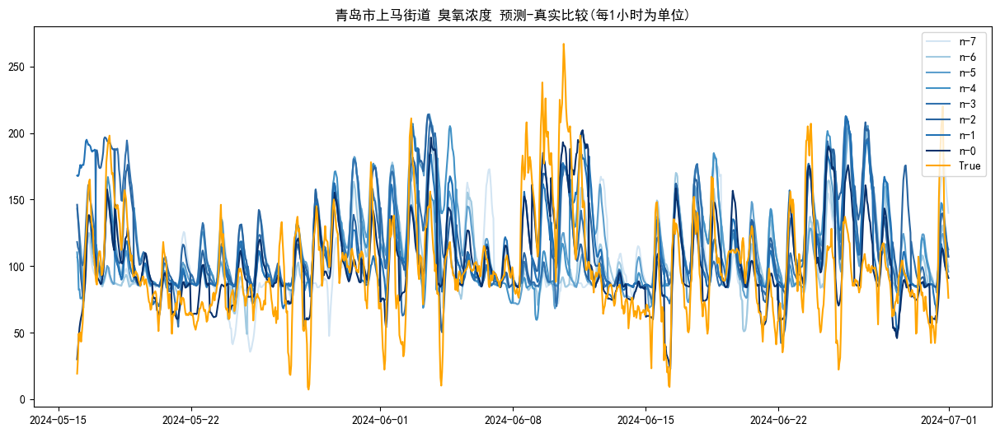

n-7 MASE: 43.84879757933588
n-7 R2: -0.23868652296376958
n-6 MASE: 43.289810658386486
n-6 R2: -0.20730613556141675
n-5 MASE: 45.310567849502775
n-5 R2: -0.3226503313442537
n-4 MASE: 43.52717422511534
n-4 R2: -0.22058206065416863
n-3 MASE: 39.468407014128154
n-3 R2: -0.0035643642925460295
n-2 MASE: 39.049952812319624
n-2 R2: 0.01760292216945747
n-1 MASE: 36.2637754818924
n-1 R2: 0.15278805642238935
n-0 MASE: 26.950853642429344
n-0 R2: 0.5320590134392391


In [37]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
import matplotlib.dates as mdates
from datetime import datetime, timedelta
date_range_list = []
start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
end_date111 = datetime(2024, 6, 30, 23, 0, 0)
true_value_list = []
date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
merged_data = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')

true_value_list = merged_data['O3VAL'].tolist()

start_date = datetime(2024, 5, 16, 0, 0, 0) 
end_date = datetime(2024, 5, 16, 23, 0, 0)
while end_date < datetime(2024, 7, 1, 0, 0, 0):
    date_range = pd.date_range(start=start_date, end=end_date, freq='H')
    date_range_list.append(date_range)
    end_date += timedelta(hours=1)
    start_date = end_date
    end_date += timedelta(days=1)
    end_date -= timedelta(hours=1)

num = 0
colors = [
 '#d3e5f3','#a1cae1', 
    '#5d9fcd', '#4292c6',  '#3171ad',
    '#2864a0', '#2171b5',   '#08306b','orange'
]
true_legend_added = 0 
pred_value_list_7 = np.array([])
pred_value_list_6 = np.array([])
pred_value_list_5 = np.array([])
pred_value_list_4 = np.array([])
pred_value_list_3 = np.array([])
pred_value_list_2 = np.array([])
pred_value_list_1 = np.array([])
pred_value_list_0 = np.array([])

for date_ranges in date_range_list:
    num = 7
    for i in range(len(df_list)):
        is_in_list = df_list[i]['日期'].isin(date_ranges)
        rmse_list = []
        r2_list = []
        if is_in_list.any():
            matching_indices = df_list[i].index[is_in_list].tolist()
            matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
            if num == 7:
                pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 6:
                pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 5:
                pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 4:
                pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 3:
                pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 2:
                pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 1:
                pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 0:
                pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            num-=1



plt.figure(figsize=(15, 6))
plt.title("青岛市上马街道 臭氧浓度 预测-真实比较(每1小时为单位)")
plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
plt.legend()
plt.show()   


print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))

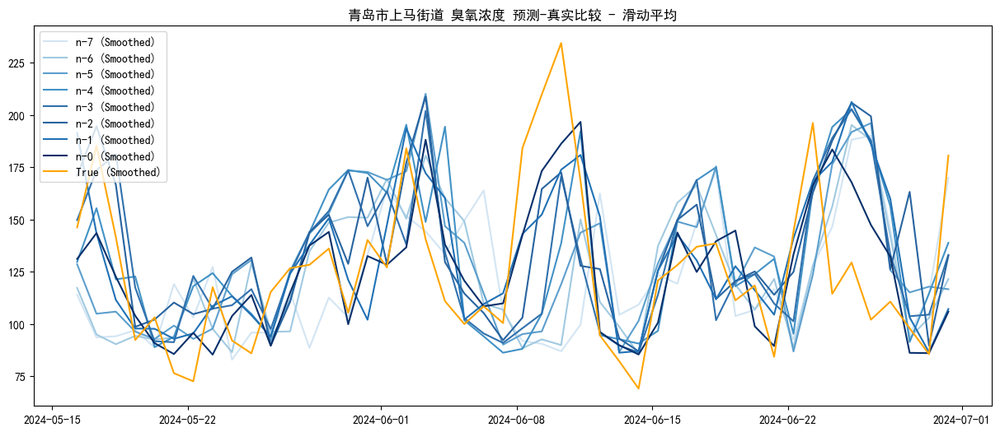

n-7 RMSE: 48.12472090675479
n-7 R2: -0.6567408109920103
n-6 RMSE: 47.636634439599334
n-6 R2: -0.6233055149159807
n-5 RMSE: 47.3645396915179
n-5 R2: -0.6048142229997338
n-4 RMSE: 43.05615465137513
n-4 R2: -0.3261376446005233
n-3 RMSE: 39.5931068892531
n-3 R2: -0.12139157121545541
n-2 RMSE: 36.77028439581522
n-2 R2: 0.03280932548863902
n-1 RMSE: 33.83206131557133
n-1 R2: 0.18120526543720317
n-0 RMSE: 28.10778824444603
n-0 R2: 0.43483993191484216


In [38]:
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data
# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8

# 对每个预测值列表应用滑动窗口函数
smoothed_pred_value_list_7 = sliding_window_average(pred_value_list_7, window_size)
smoothed_pred_value_list_6 = sliding_window_average(pred_value_list_6, window_size)
smoothed_pred_value_list_5 = sliding_window_average(pred_value_list_5, window_size)
smoothed_pred_value_list_4 = sliding_window_average(pred_value_list_4, window_size)
smoothed_pred_value_list_3 = sliding_window_average(pred_value_list_3, window_size)
smoothed_pred_value_list_2 = sliding_window_average(pred_value_list_2, window_size)
smoothed_pred_value_list_1 = sliding_window_average(pred_value_list_1, window_size)
smoothed_pred_value_list_0 = sliding_window_average(pred_value_list_0, window_size)

# 对真实值列表应用滑动窗口函数
smoothed_true_value_list = sliding_window_average(true_value_list, window_size)

# 再次应用 max_values 函数
interval = 24
smoothed_pred_value_list_7 = max_values(smoothed_pred_value_list_7, interval)
smoothed_pred_value_list_6 = max_values(smoothed_pred_value_list_6, interval)
smoothed_pred_value_list_5 = max_values(smoothed_pred_value_list_5, interval)
smoothed_pred_value_list_4 = max_values(smoothed_pred_value_list_4, interval)
smoothed_pred_value_list_3 = max_values(smoothed_pred_value_list_3, interval)
smoothed_pred_value_list_2 = max_values(smoothed_pred_value_list_2, interval)
smoothed_pred_value_list_1 = max_values(smoothed_pred_value_list_1, interval)
smoothed_pred_value_list_0 = max_values(smoothed_pred_value_list_0, interval)

# 由于 max_values 可能会减少列表长度，我们也需要对 smoothed_true_value_list 应用相同的操作
smoothed_true_value_list = max_values(smoothed_true_value_list, interval)

# 获取用于绘图的时间范围，减去窗口大小 + 1，以匹配滑动平均后的长度
# 并且需要进一步减去由 max_values 函数导致的长度减少
smoothed_date_range111 = date_range111[window_size - 1::interval]

plt.figure(figsize=(15, 6))
plt.title("青岛市上马街道 臭氧浓度 预测-真实比较 - 滑动平均")
plt.plot(smoothed_date_range111, smoothed_pred_value_list_7, color=colors[0], label='n-7 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_6, color=colors[1], label='n-6 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_5, color=colors[2], label='n-5 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_4, color=colors[3], label='n-4 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_3, color=colors[4], label='n-3 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_2, color=colors[5], label='n-2 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_1, color=colors[6], label='n-1 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_0, color=colors[7], label='n-0 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_true_value_list, color=colors[-1], label='True (Smoothed)')
plt.legend()
plt.show()

# 计算滑动平均后的性能指标
print('n-7 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_7)))
print('n-7 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_7))
print('n-6 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_6)))
print('n-6 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_6))
print('n-5 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_5)))
print('n-5 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_5))
print('n-4 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_4)))
print('n-4 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_4))
print('n-3 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_3)))
print('n-3 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_3))
print('n-2 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_2)))
print('n-2 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_2))
print('n-1 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_1)))
print('n-1 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_1))
print('n-0 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_0)))
print('n-0 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_0))

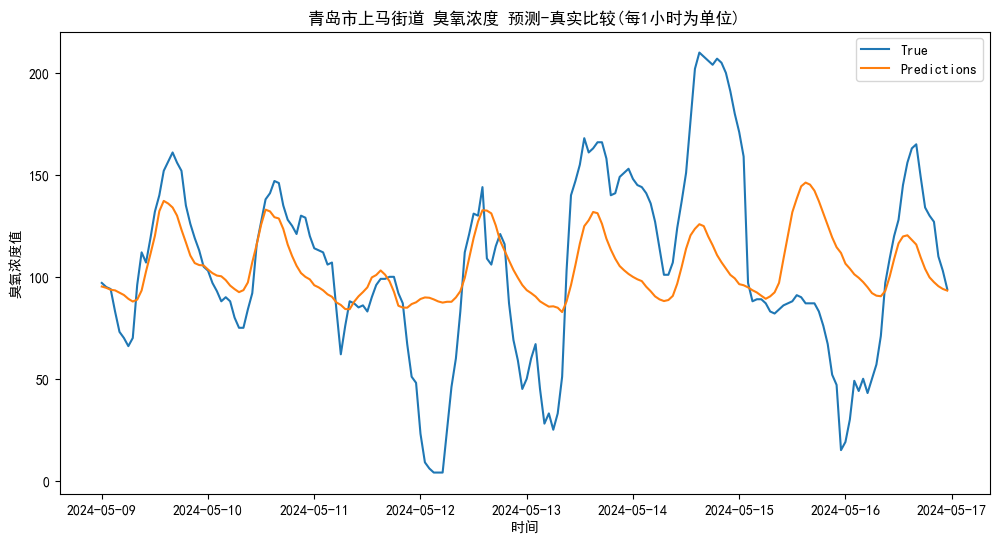

rmse: 39.79712376665024
r2 score: 0.2186350960703357
all
rmse: 39.79712376665024
r2 score: 0.2186350960703357
all-1
rmse: 38.119184935195726
r2 score: 0.3197513370632762
all-2
rmse: 30.513566721164228
r2 score: 0.43200408150377


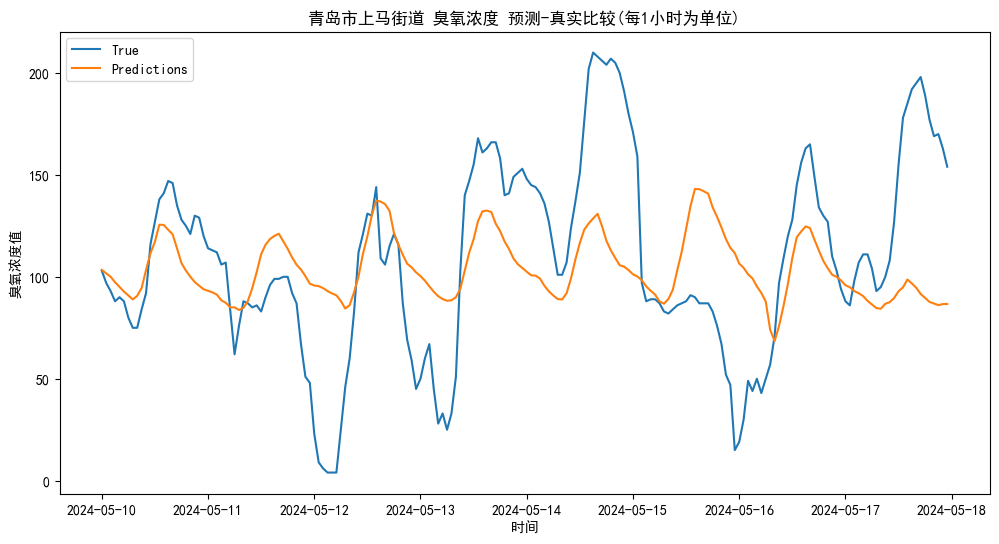

rmse: 45.16718278192695
r2 score: 0.09099056614261924
all
rmse: 45.16718278192695
r2 score: 0.09099056614261924
all-1
rmse: 42.70946946235977
r2 score: 0.17259382490558206
all-2
rmse: 41.94603392685945
r2 score: 0.2629707181737284


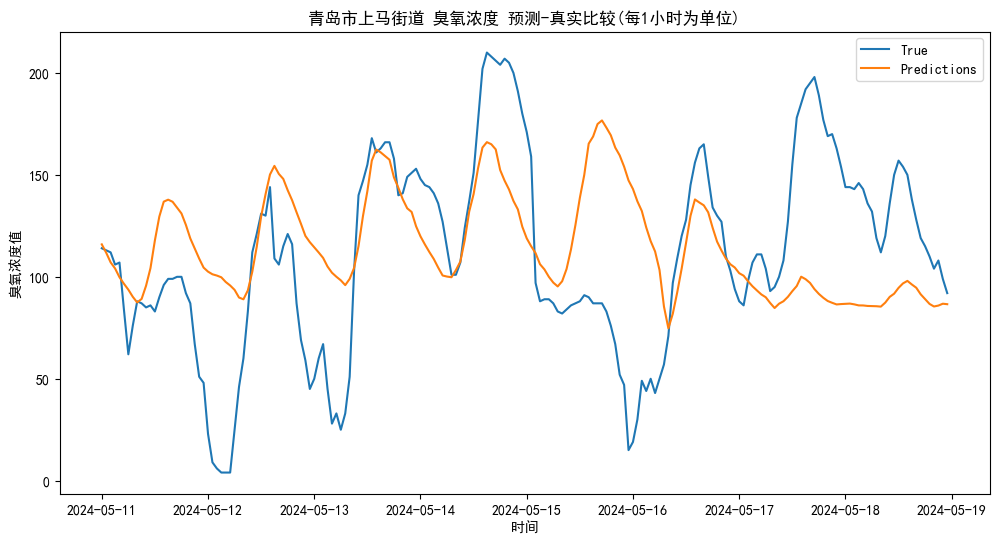

rmse: 49.71634486905169
r2 score: -0.09087129035042407
all
rmse: 49.71634486905169
r2 score: -0.09087129035042407
all-1
rmse: 48.436408024970035
r2 score: 0.040230840797357725
all-2
rmse: 48.36009966112395
r2 score: 0.07464517056386721


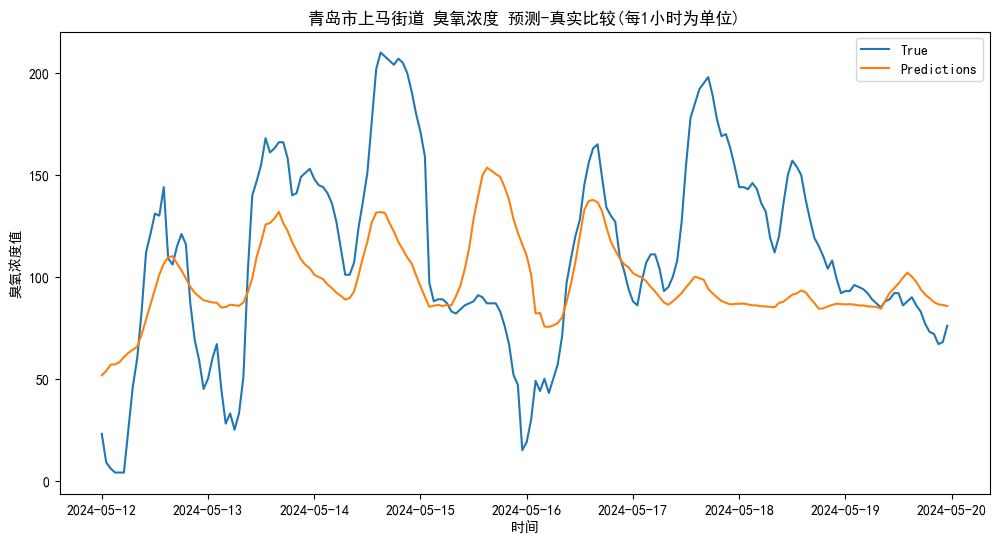

rmse: 44.54343088170197
r2 score: 0.1203985788373042
all
rmse: 44.54343088170197
r2 score: 0.1203985788373042
all-1
rmse: 47.83622826699645
r2 score: 0.17591642597748447
all-2
rmse: 44.68945988832288
r2 score: 0.2930089338302504


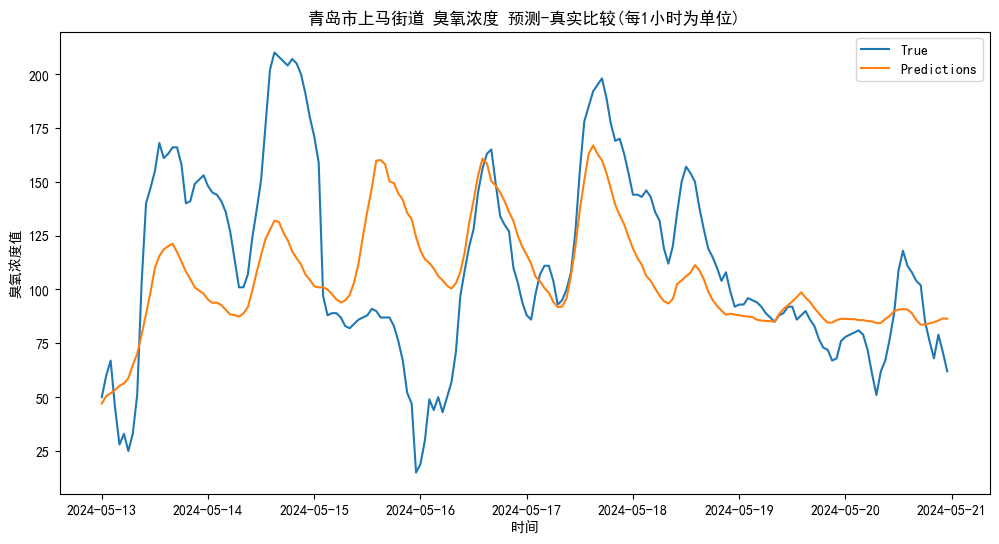

rmse: 38.44681000598363
r2 score: 0.23435659977746448
all
rmse: 38.44681000598363
r2 score: 0.23435659977746448
all-1
rmse: 43.70244853433194
r2 score: 0.11888414789837143
all-2
rmse: 45.90007272685439
r2 score: 0.16294548407300602


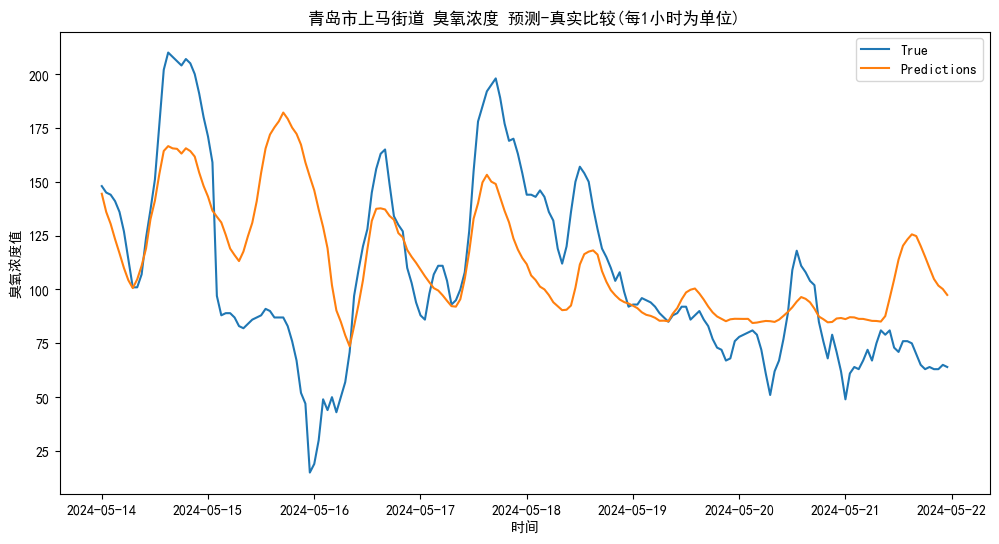

rmse: 38.40667439794216
r2 score: 0.16878657434036093
all
rmse: 38.40667439794216
r2 score: 0.16878657434036093
all-1
rmse: 41.39739016695744
r2 score: 0.08142862292570296
all-2
rmse: 45.14989923709195
r2 score: -0.0231662703925275


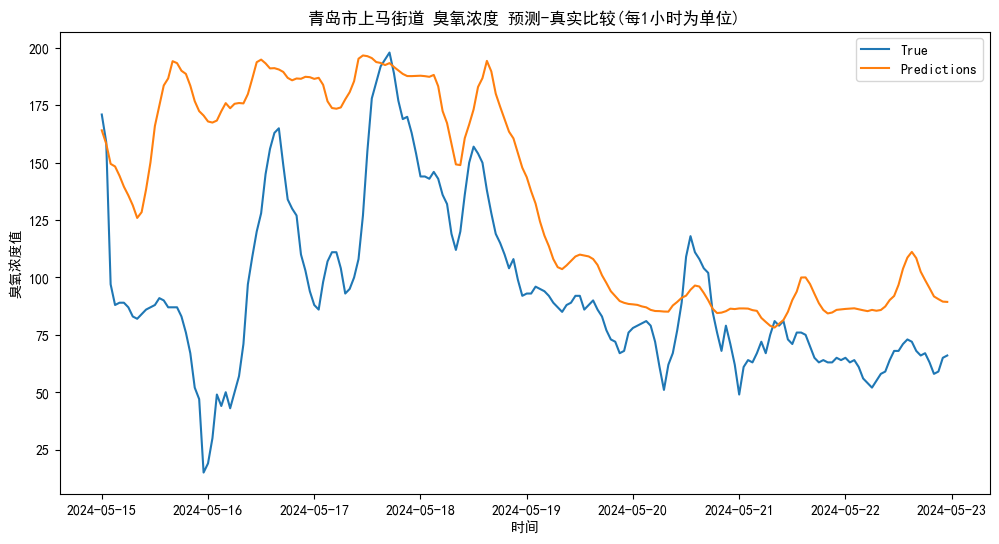

rmse: 54.372046020451485
r2 score: -1.2638880621138768
all
rmse: 54.372046020451485
r2 score: -1.2638880621138768
all-1
rmse: 60.97556623591248
r2 score: -1.708857515018225
all-2
rmse: 66.41715321141804
r2 score: -1.9890943863210944


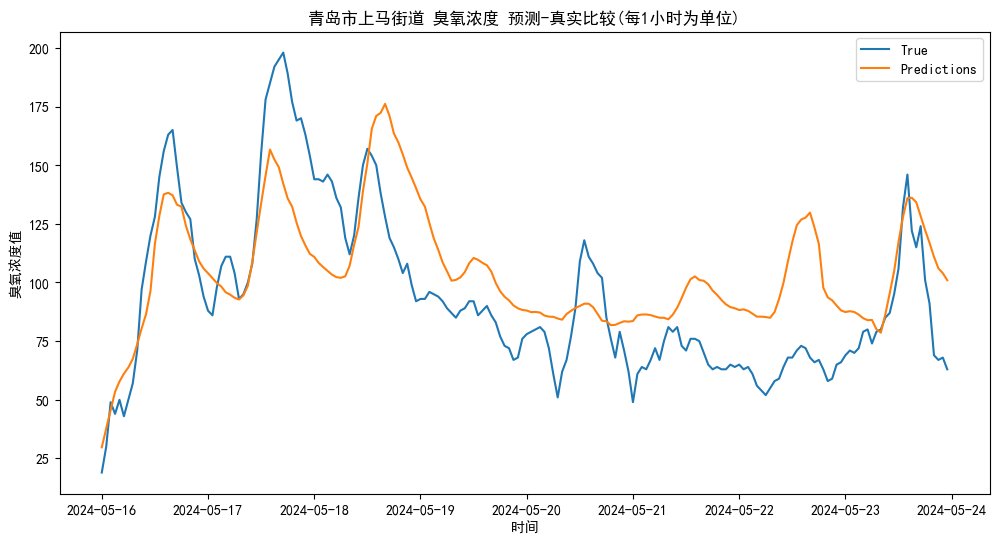

rmse: 26.694743010874724
r2 score: 0.43316589882222
all
rmse: 26.694743010874724
r2 score: 0.43316589882222
all-1
rmse: 25.078101560714767
r2 score: 0.5443482156969262
all-2
rmse: 25.22804937588848
r2 score: 0.5462372020664454


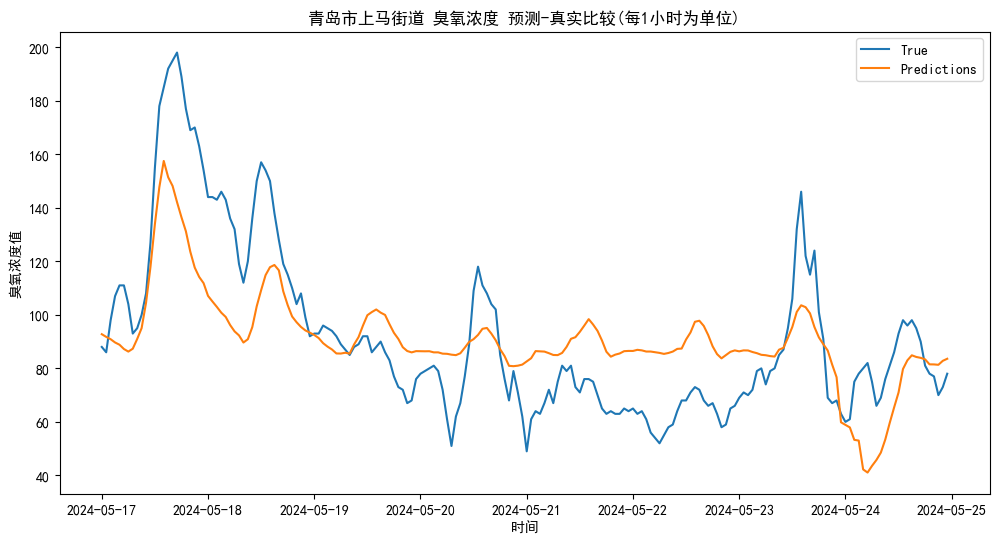

rmse: 22.551172377205273
r2 score: 0.5119088495139454
all
rmse: 22.551172377205273
r2 score: 0.5119088495139454
all-1
rmse: 23.91805265510329
r2 score: 0.5423650643463757
all-2
rmse: 23.599277669130455
r2 score: 0.5561370520803083


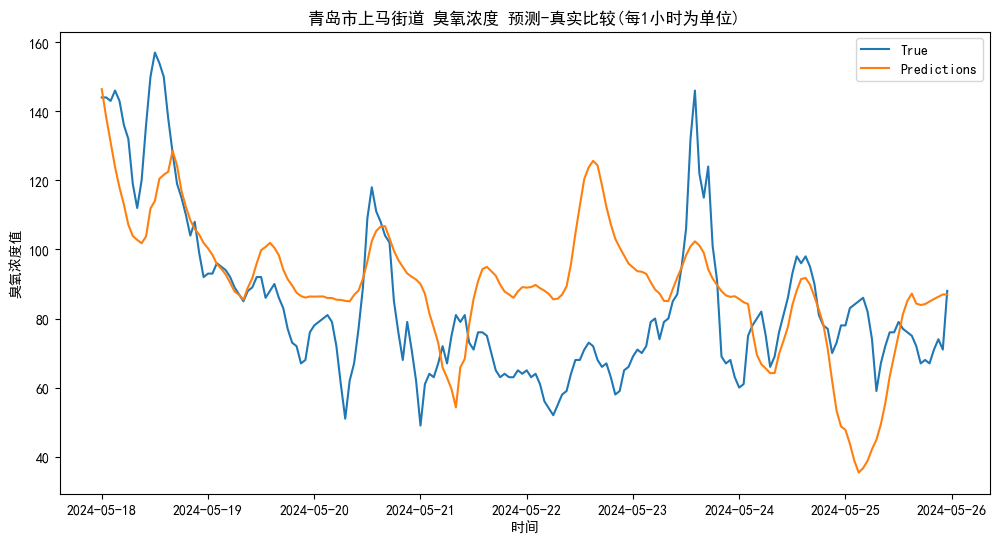

rmse: 22.04905837777812
r2 score: 0.10107787888880981
all
rmse: 22.04905837777812
r2 score: 0.10107787888880981
all-1
rmse: 22.76424892666223
r2 score: 0.2301553597857655
all-2
rmse: 23.40636337360511
r2 score: 0.21844685369960526


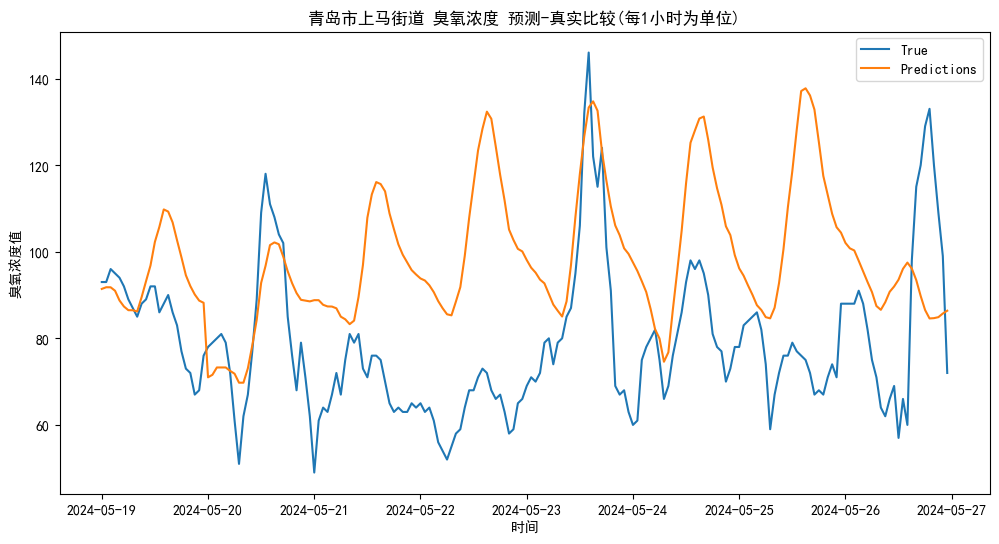

rmse: 27.975974626752777
r2 score: -1.7514044812442577
all
rmse: 27.975974626752777
r2 score: -1.7514044812442577
all-1
rmse: 26.449098317641436
r2 score: -1.592133123366763
all-2
rmse: 26.481159715466156
r2 score: -1.3362130372321235


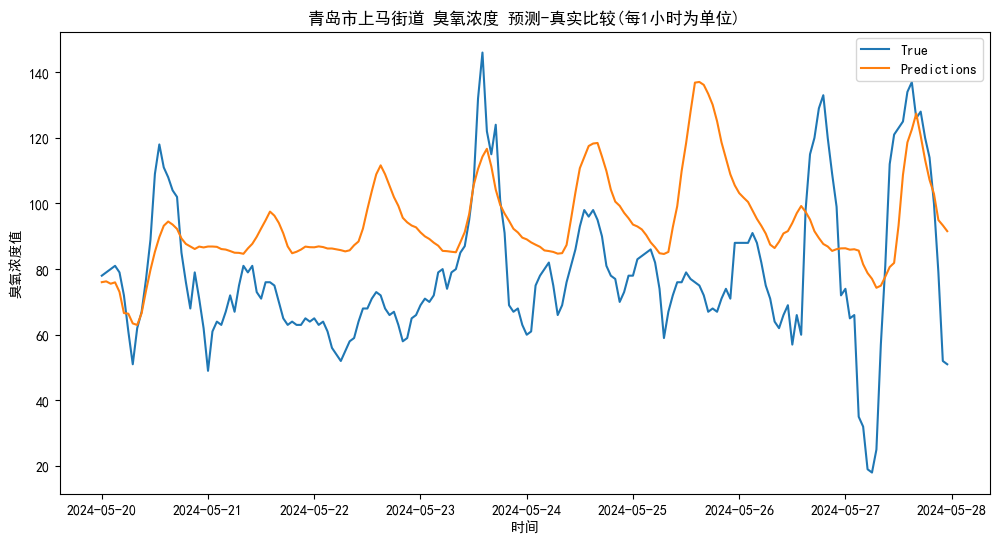

rmse: 25.905690673227824
r2 score: -0.4334582745749247
all
rmse: 25.905690673227824
r2 score: -0.4334582745749247
all-1
rmse: 25.10864646279592
r2 score: -1.4695057794797544
all-2
rmse: 21.2248381677562
r2 score: -0.520021218443316


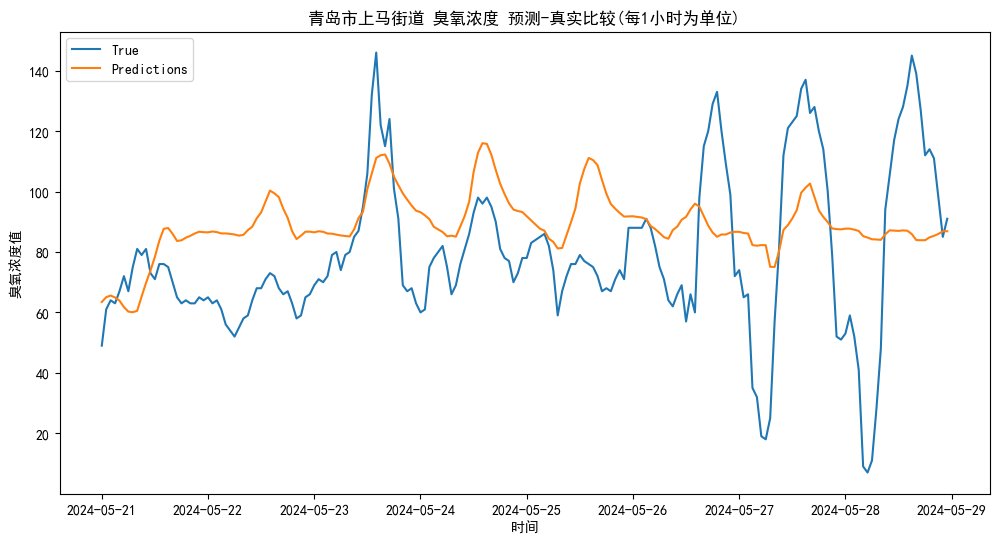

rmse: 26.512595619726135
r2 score: -0.05566938310495728
all
rmse: 26.512595619726135
r2 score: -0.05566938310495728
all-1
rmse: 20.78250368420803
r2 score: -0.4186510092272877
all-2
rmse: 20.161871647860135
r2 score: -0.7174589631678328


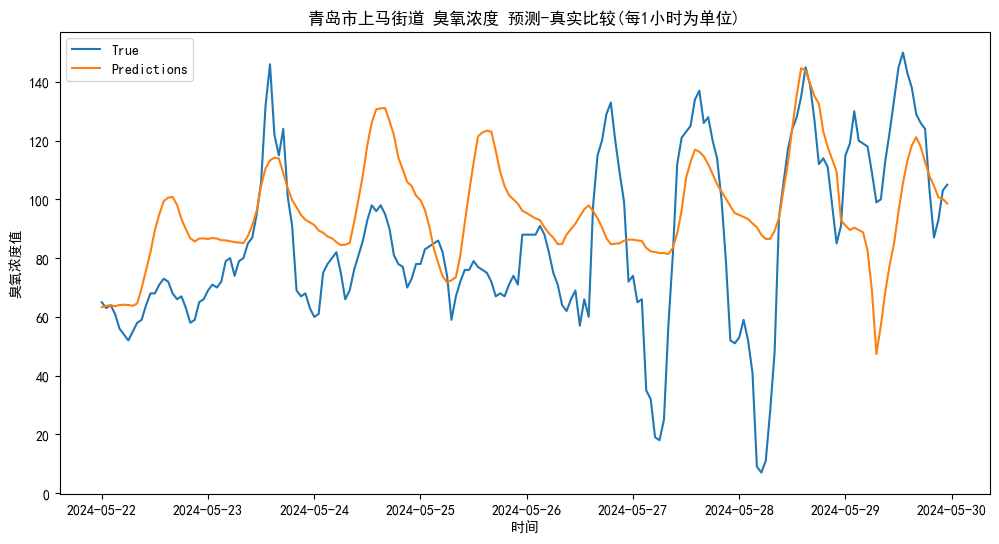

rmse: 27.99279603699067
r2 score: 0.06224217381995689
all
rmse: 27.99279603699067
r2 score: 0.06224217381995689
all-1
rmse: 25.347196582359967
r2 score: -0.18194387530841083
all-2
rmse: 23.69729353148917
r2 score: -0.6706686006491873


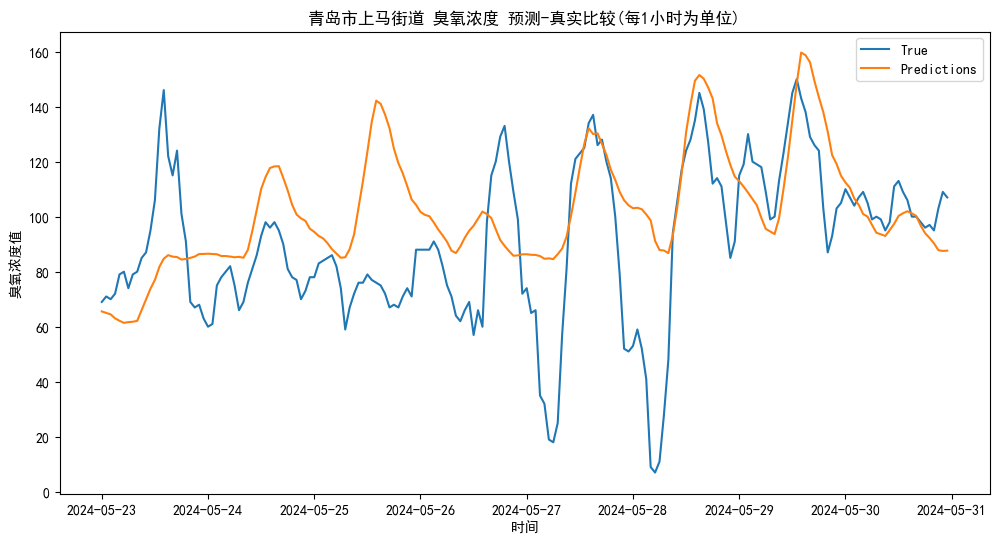

rmse: 28.53470225425651
r2 score: -0.031400907347121976
all
rmse: 28.53470225425651
r2 score: -0.031400907347121976
all-1
rmse: 31.81313441185342
r2 score: -0.2740818403368861
all-2
rmse: 29.43615327043268
r2 score: -0.49543014496091686


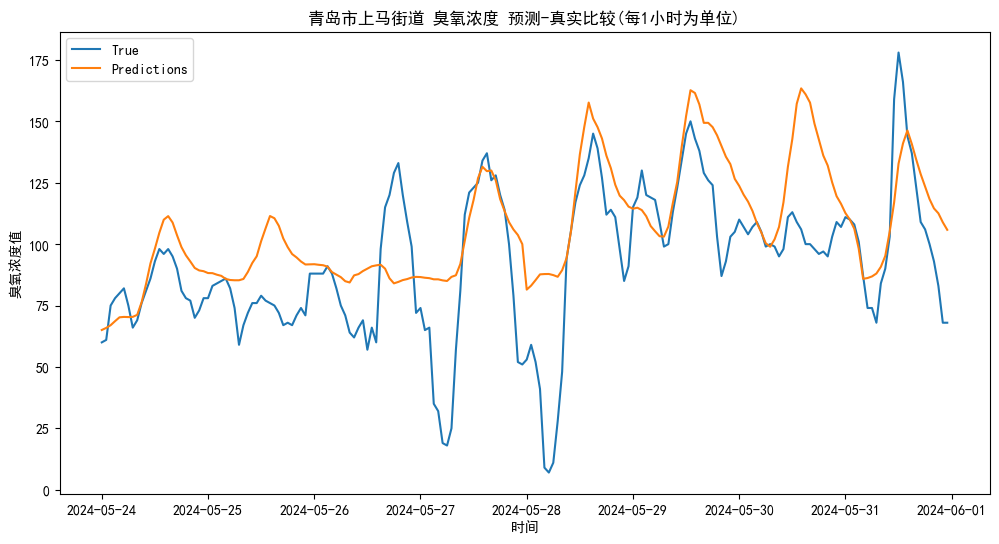

rmse: 26.29177878189698
r2 score: 0.20397801899670942
all
rmse: 26.29177878189698
r2 score: 0.20397801899670942
all-1
rmse: 26.146360545714025
r2 score: 0.26367154663840275
all-2
rmse: 27.011136862161468
r2 score: 0.13151075605561213


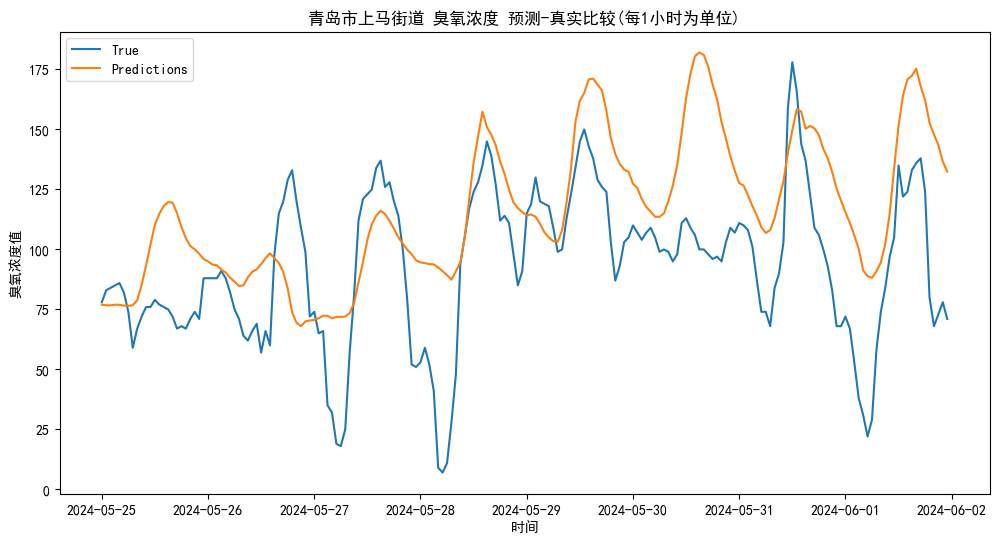

rmse: 35.96327308491814
r2 score: -0.2909874777779633
all
rmse: 35.96327308491814
r2 score: -0.2909874777779633
all-1
rmse: 33.68822620888728
r2 score: -0.22738634018083959
all-2
rmse: 30.21858570051305
r2 score: 0.14994865347491892


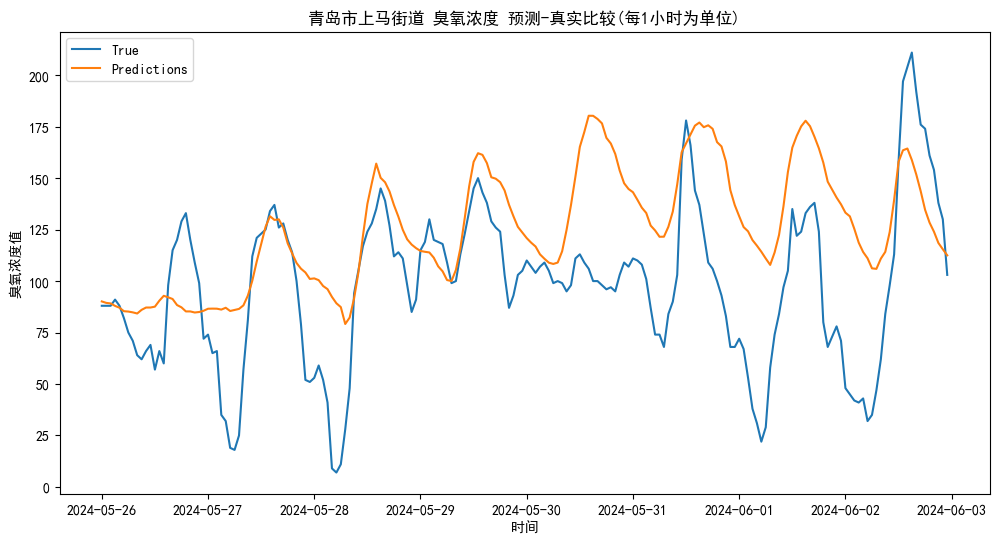

rmse: 43.03493990623954
r2 score: -0.2740132391014607
all
rmse: 43.03493990623954
r2 score: -0.2740132391014607
all-1
rmse: 37.47605356539476
r2 score: -0.3608094782476541
all-2
rmse: 34.53685345586494
r2 score: -0.15597875174689335


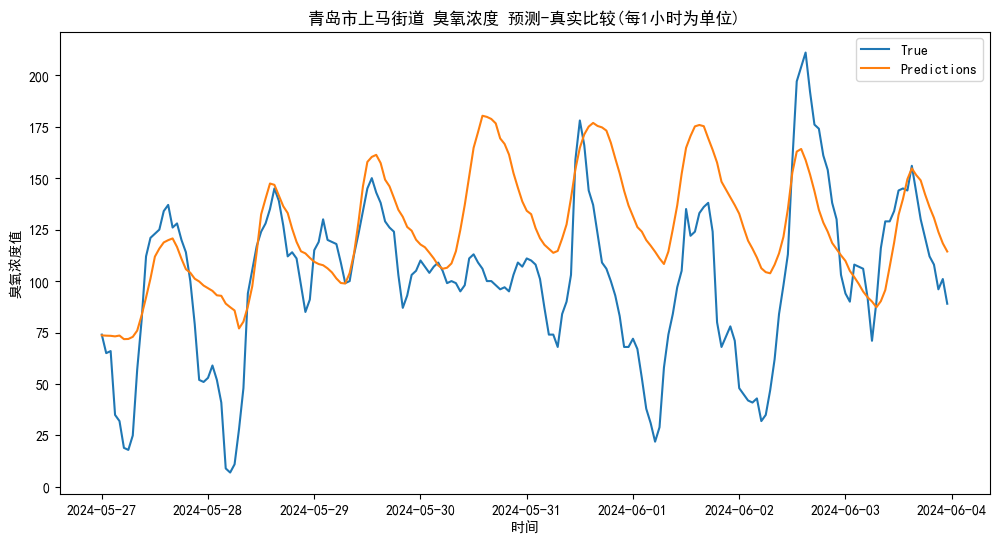

rmse: 40.89411419409978
r2 score: -0.14065179547512696
all
rmse: 40.89411419409978
r2 score: -0.14065179547512696
all-1
rmse: 41.97347247610149
r2 score: -0.5012606774082526
all-2
rmse: 37.07667197458239
r2 score: -0.23214385581299357


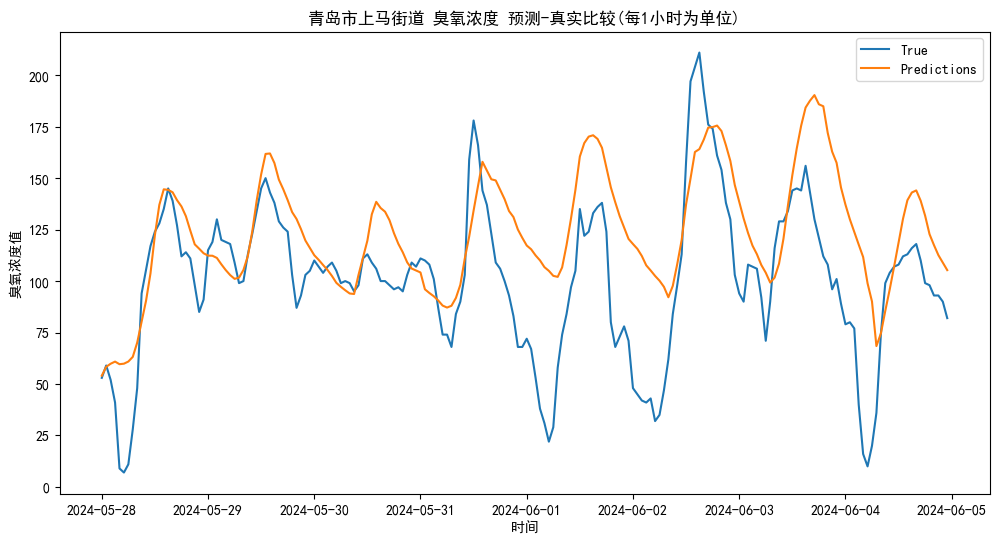

rmse: 35.61023249595761
r2 score: 0.09817875414444532
all
rmse: 35.61023249595761
r2 score: 0.09817875414444532
all-1
rmse: 33.40239785211995
r2 score: 0.2693379857181202
all-2
rmse: 30.7373493210376
r2 score: 0.10112524440913251


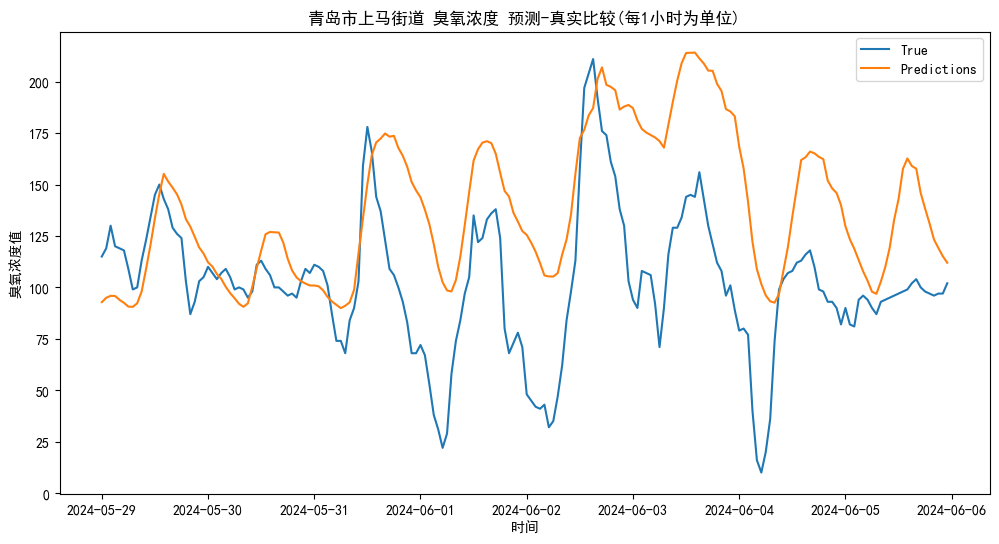

rmse: 49.211893697746035
r2 score: -1.1108026319373372
all
rmse: 49.211893697746035
r2 score: -1.1108026319373372
all-1
rmse: 49.29653058963432
r2 score: -0.9352330693191053
all-2
rmse: 41.18964548871052
r2 score: -0.2184158659544564


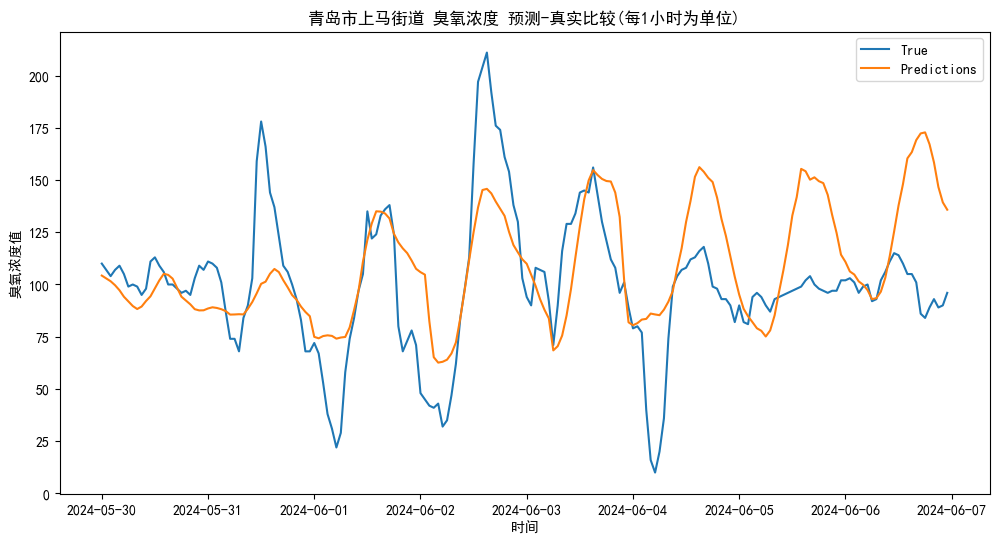

rmse: 31.52898645947785
r2 score: 0.08253931723322261
all
rmse: 31.52898645947785
r2 score: 0.08253931723322261
all-1
rmse: 28.74343896641132
r2 score: 0.4195664200845398
all-2
rmse: 26.433664813601276
r2 score: 0.5072071586068125


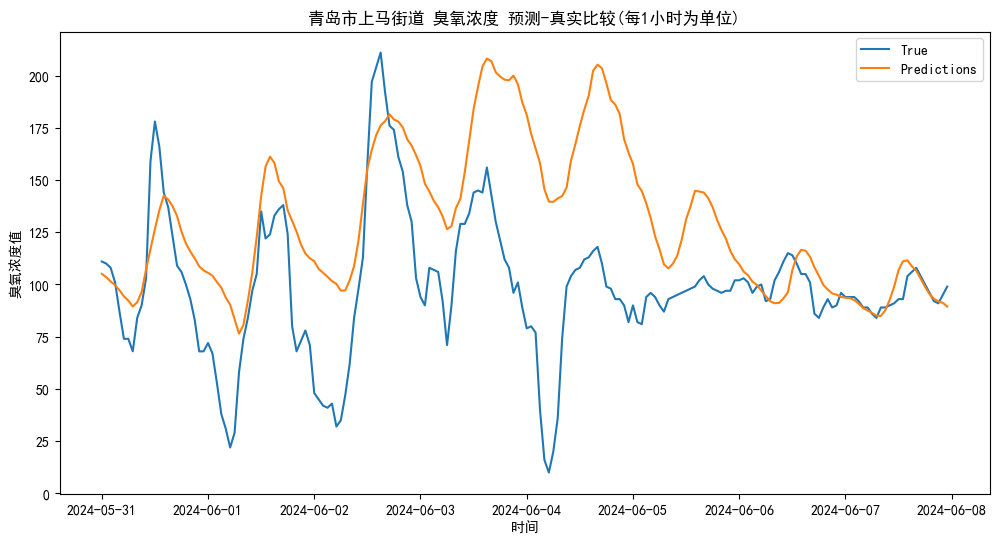

rmse: 46.77071869478312
r2 score: -1.0158517505631335
all
rmse: 46.77071869478312
r2 score: -1.0158517505631335
all-1
rmse: 53.780196866737825
r2 score: -1.02933600482074
all-2
rmse: 56.42825591126622
r2 score: -0.8727627360801034


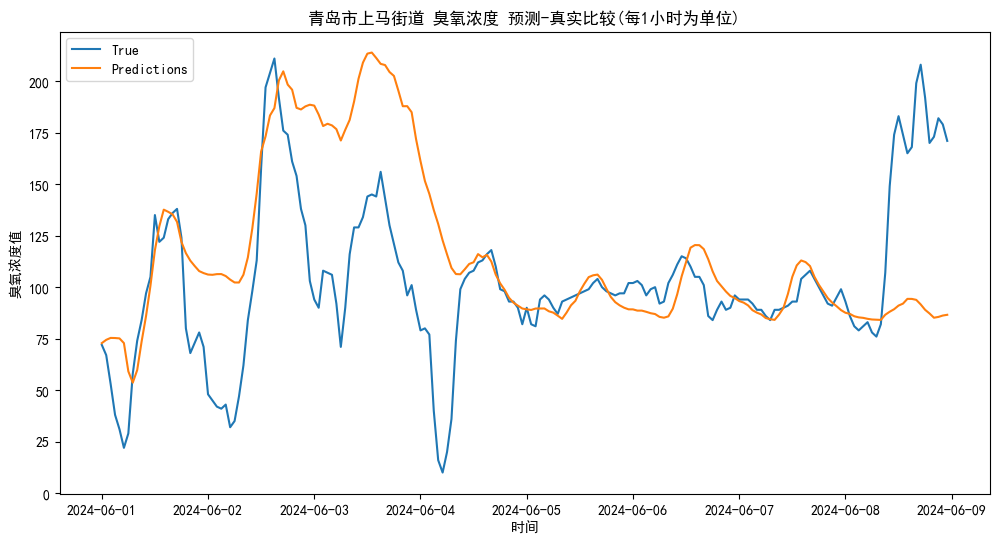

rmse: 45.7455415714558
r2 score: -0.46352343119583117
all
rmse: 45.7455415714558
r2 score: -0.46352343119583117
all-1
rmse: 44.80206011279849
r2 score: -0.5794326396900162
all-2
rmse: 48.70430956312976
r2 score: -0.5707302019893343


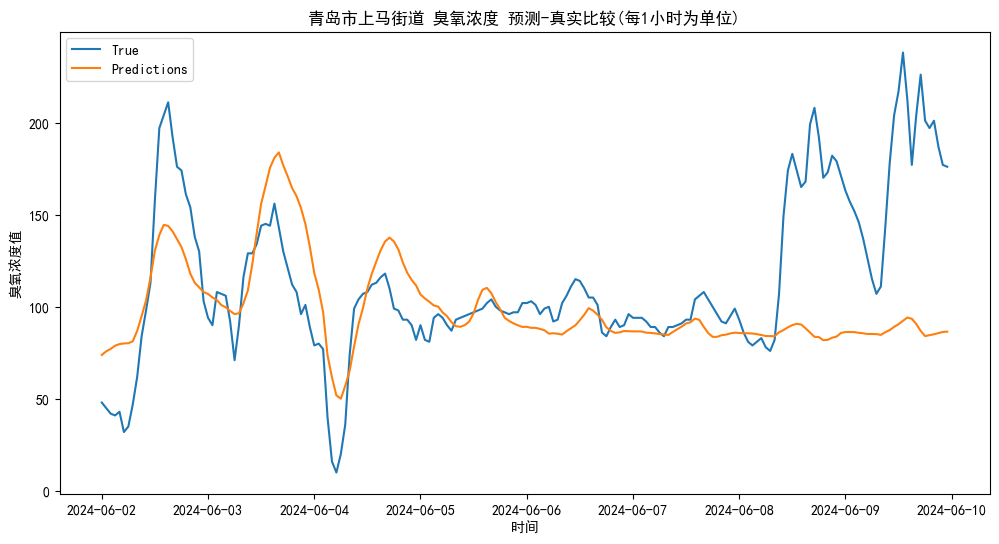

rmse: 46.14722579165956
r2 score: -0.12522811017821112
all
rmse: 46.14722579165956
r2 score: -0.12522811017821112
all-1
rmse: 23.74523571852118
r2 score: 0.45376837088521105
all-2
rmse: 25.687367073439457
r2 score: 0.4610218736330879


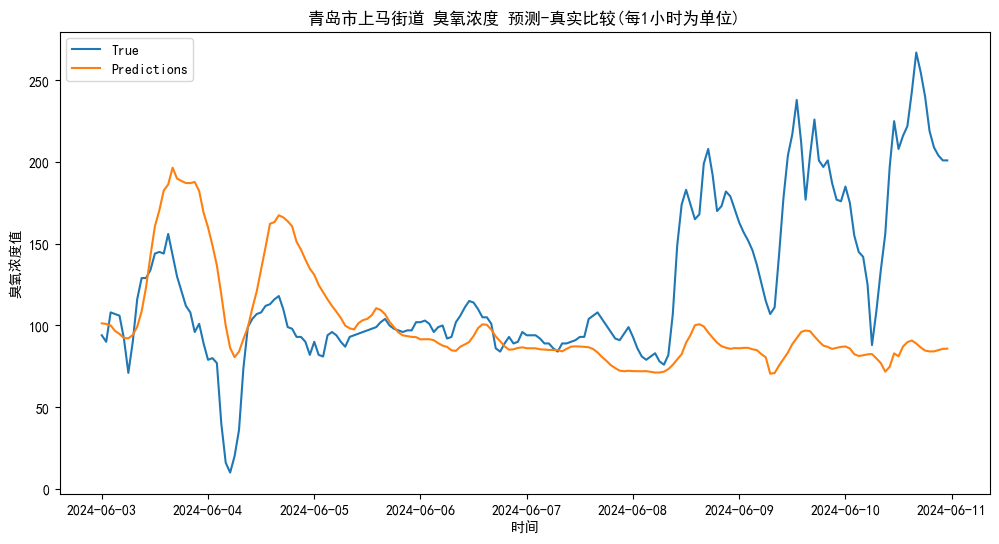

rmse: 63.13572901110923
r2 score: -0.7360488939294354
all
rmse: 63.13572901110923
r2 score: -0.7360488939294354
all-1
rmse: 41.47605236347939
r2 score: -0.7358805708530551
all-2
rmse: 33.81630621866435
r2 score: -1.5560306807806996


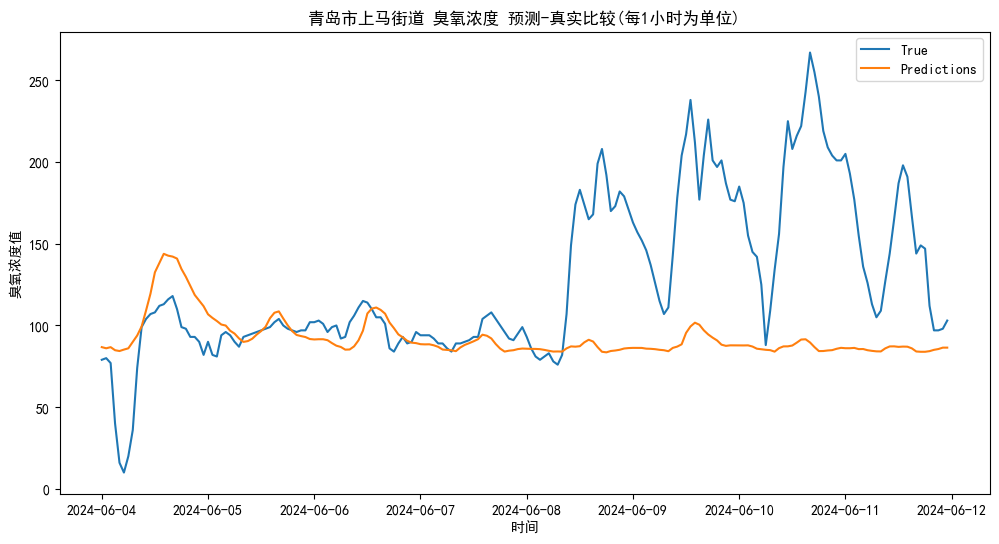

rmse: 62.682075079243084
r2 score: -0.6265003898917365
all
rmse: 62.682075079243084
r2 score: -0.6265003898917365
all-1
rmse: 49.18712142913027
r2 score: -0.3345300153834594
all-2
rmse: 36.085027819402775
r2 score: -0.2237369816119501


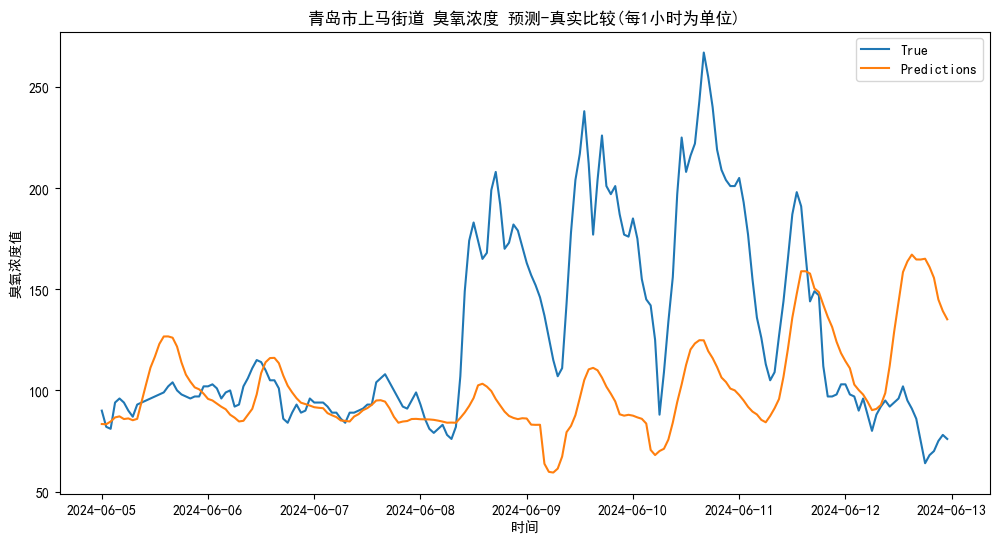

rmse: 57.93153174621988
r2 score: -0.4933583852724437
all
rmse: 57.93153174621988
r2 score: -0.4933583852724437
all-1
rmse: 60.10321008294808
r2 score: -0.4777409620356281
all-2
rmse: 50.16216268035931
r2 score: -0.45820198715519567


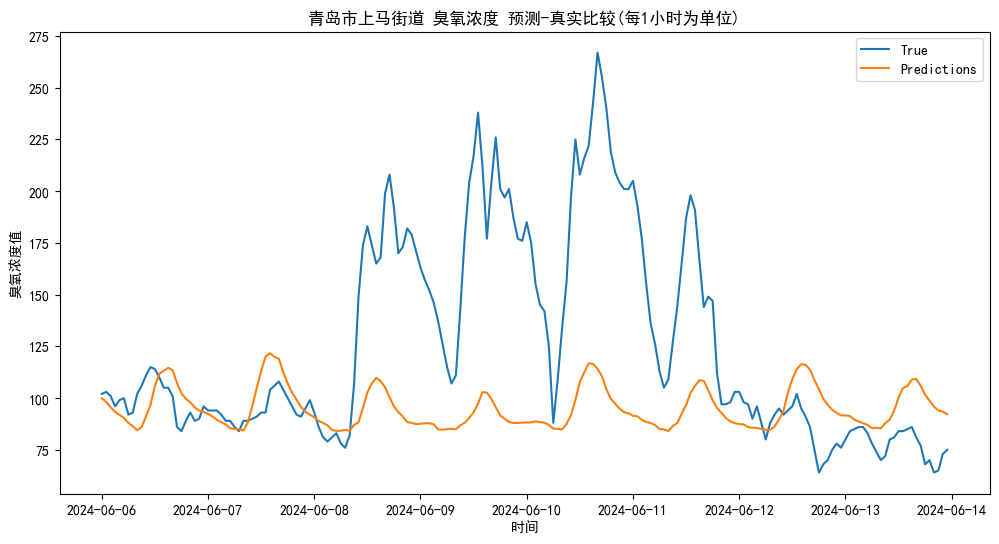

rmse: 57.235944143937566
r2 score: -0.35433150912882727
all
rmse: 57.235944143937566
r2 score: -0.35433150912882727
all-1
rmse: 65.17653607333912
r2 score: -0.7870368185580447
all-2
rmse: 66.23278061190405
r2 score: -0.6822818461479454


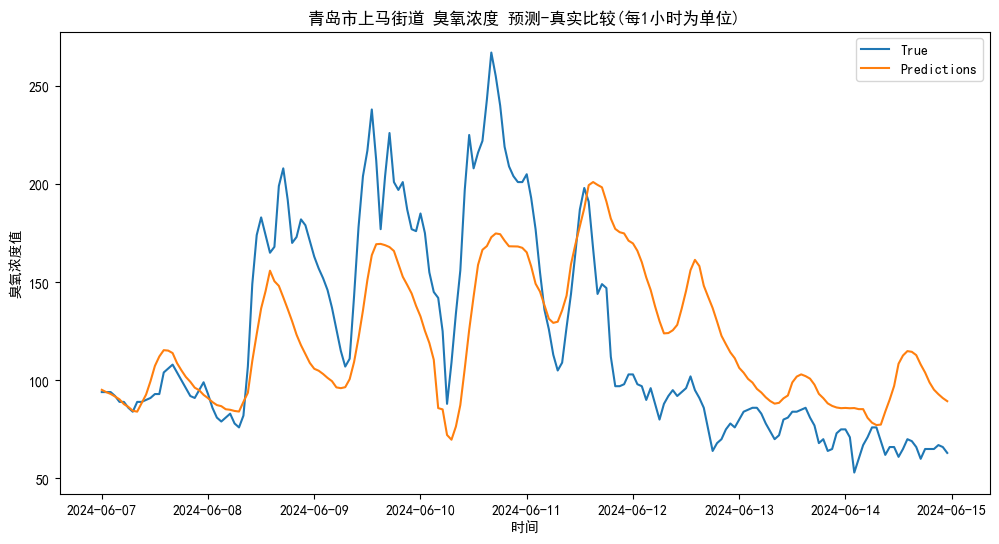

rmse: 40.17038381292601
r2 score: 0.412135353022549
all
rmse: 40.17038381292601
r2 score: 0.412135353022549
all-1
rmse: 44.031520717887325
r2 score: 0.24547829388072107
all-2
rmse: 41.76252408594266
r2 score: 0.28766009088971345


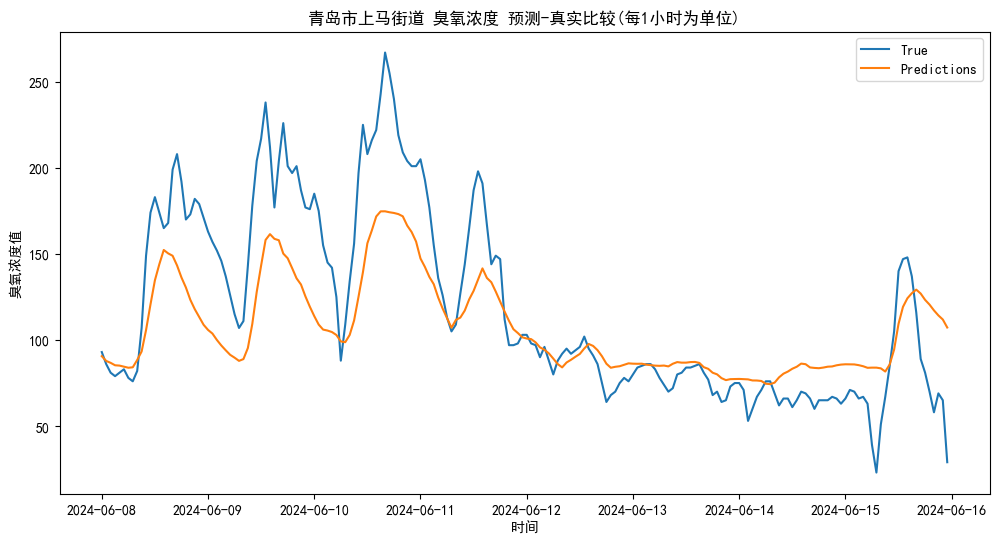

rmse: 35.39069478121838
r2 score: 0.5833231583530045
all
rmse: 35.39069478121838
r2 score: 0.5833231583530045
all-1
rmse: 37.524573790138575
r2 score: 0.5046903547662471
all-2
rmse: 40.96168777713675
r2 score: 0.3612100547401518


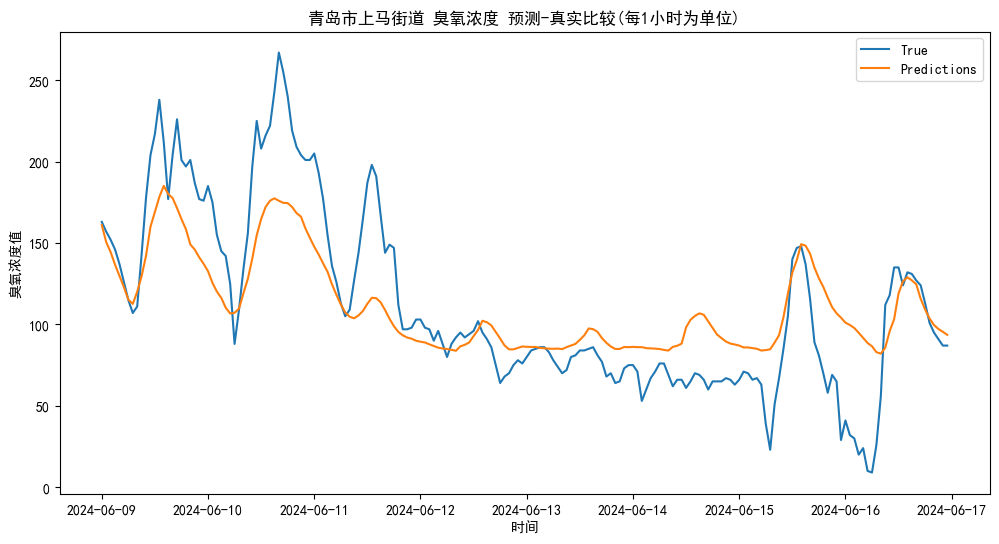

rmse: 33.69114522932308
r2 score: 0.6284796654379682
all
rmse: 33.69114522932308
r2 score: 0.6284796654379682
all-1
rmse: 31.707526454531777
r2 score: 0.6759354577177665
all-2
rmse: 32.558620996950914
r2 score: 0.6414443170133795


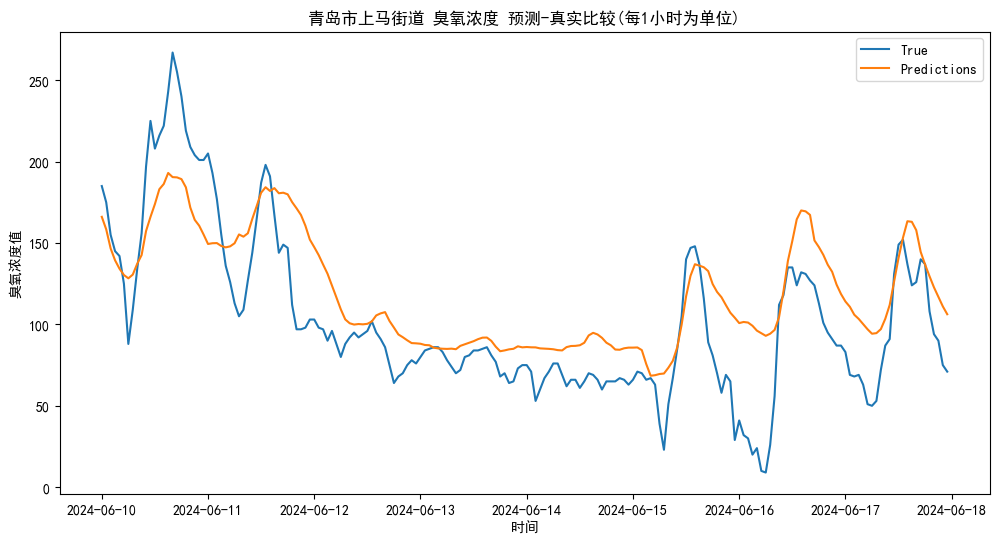

rmse: 33.065728388960416
r2 score: 0.5627279500129188
all
rmse: 33.065728388960416
r2 score: 0.5627279500129188
all-1
rmse: 29.65107656974541
r2 score: 0.6764971452728843
all-2
rmse: 29.09251366717421
r2 score: 0.7027002670270701


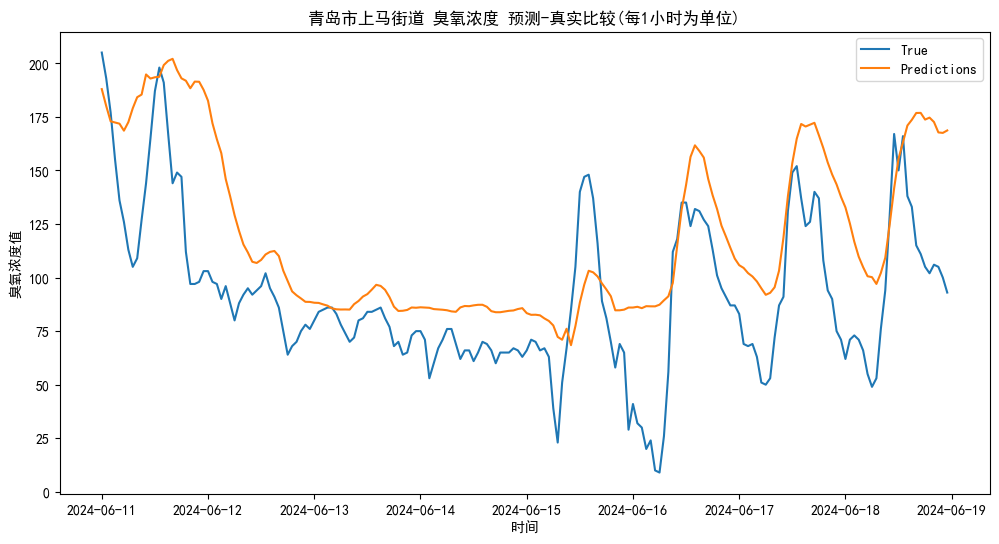

rmse: 38.51517468549376
r2 score: -0.1128433310252519
all
rmse: 38.51517468549376
r2 score: -0.1128433310252519
all-1
rmse: 35.91575271850283
r2 score: 0.0720387366611055
all-2
rmse: 34.55334614881527
r2 score: 0.04562282716791921


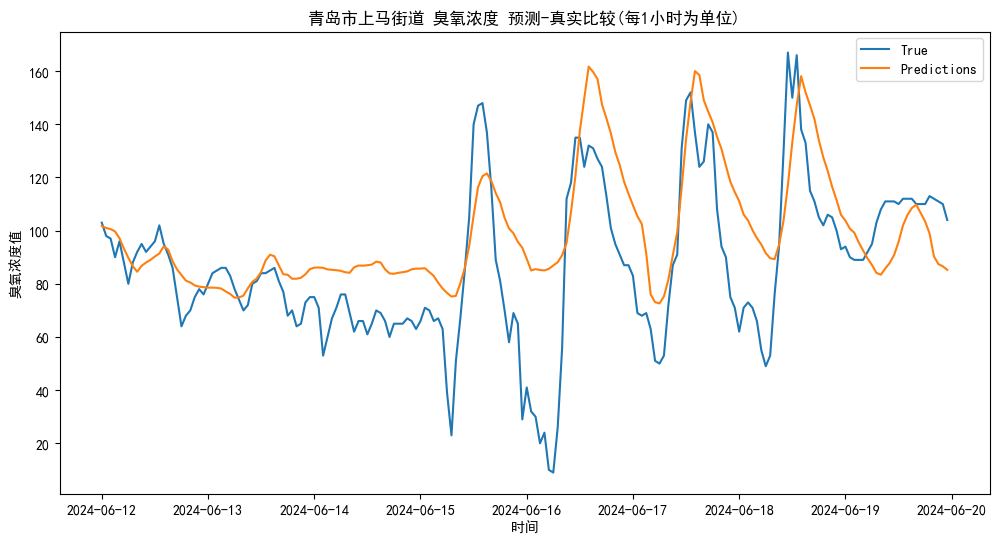

rmse: 24.735346171531383
r2 score: 0.2808200475689481
all
rmse: 24.735346171531383
r2 score: 0.2808200475689481
all-1
rmse: 25.26493235881656
r2 score: 0.22223214754931242
all-2
rmse: 25.25865499157133
r2 score: 0.11981702426113616


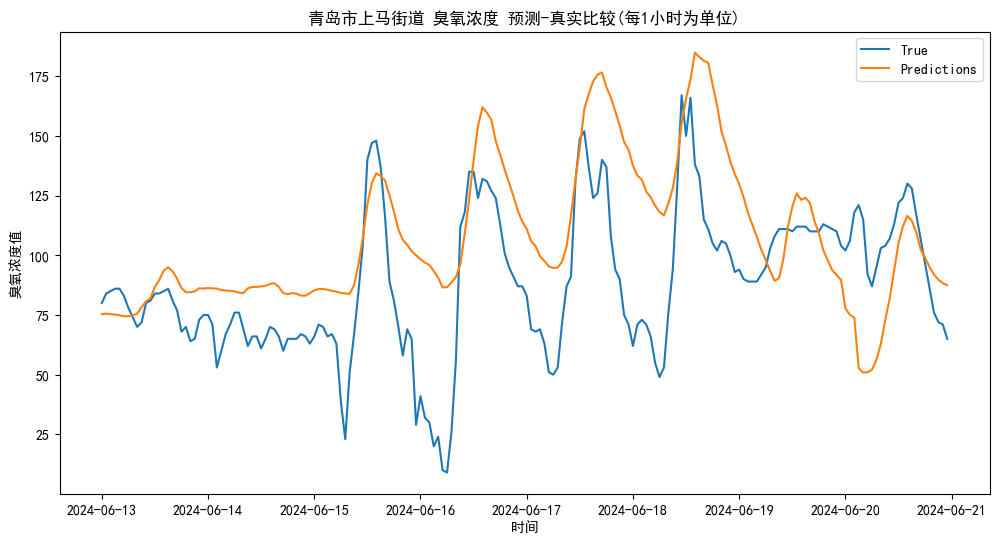

rmse: 34.274598506019366
r2 score: -0.2970686054984317
all
rmse: 34.274598506019366
r2 score: -0.2970686054984317
all-1
rmse: 36.87293122247557
r2 score: -0.3093666789348004
all-2
rmse: 32.93940511338227
r2 score: -0.13774265265970675


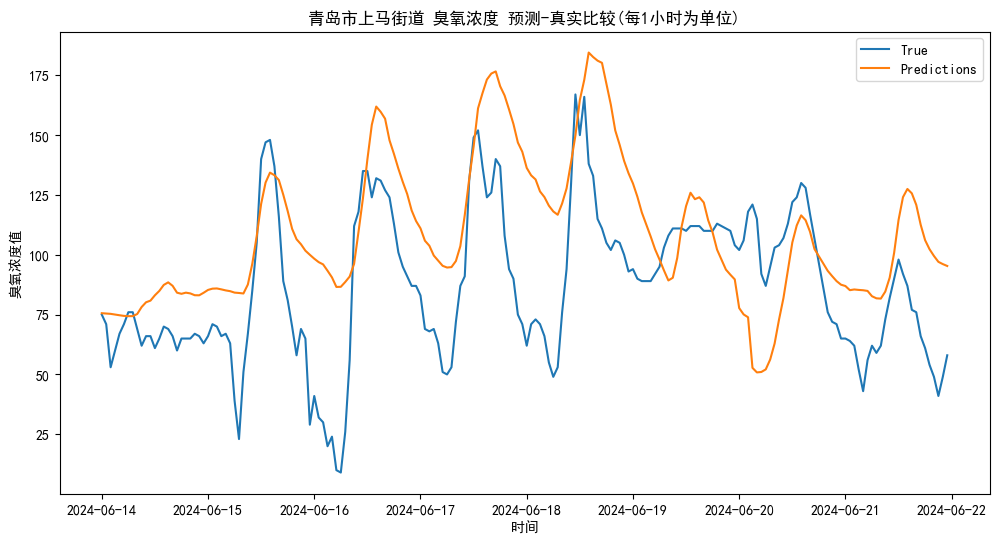

rmse: 36.03485915098993
r2 score: -0.3284158631934835
all
rmse: 36.03485915098993
r2 score: -0.3284158631934835
all-1
rmse: 36.94711025183408
r2 score: -0.2495128718374302
all-2
rmse: 39.72496500467916
r2 score: -0.2838048115245002


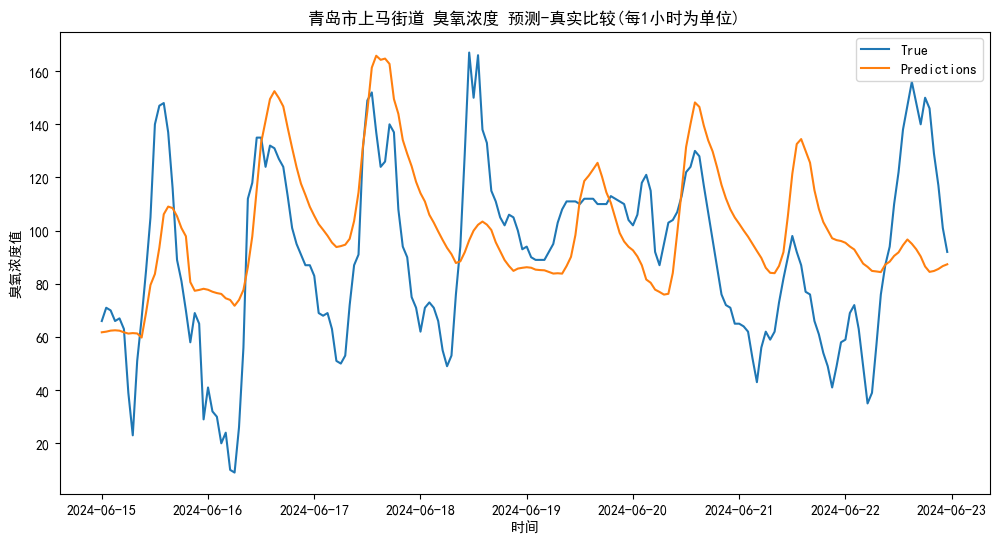

rmse: 31.951297585381543
r2 score: 0.07782280797951246
all
rmse: 31.951297585381543
r2 score: 0.07782280797951246
all-1
rmse: 29.104269797183193
r2 score: 0.20522225370302927
all-2
rmse: 29.58298788286292
r2 score: 0.26721733914353596


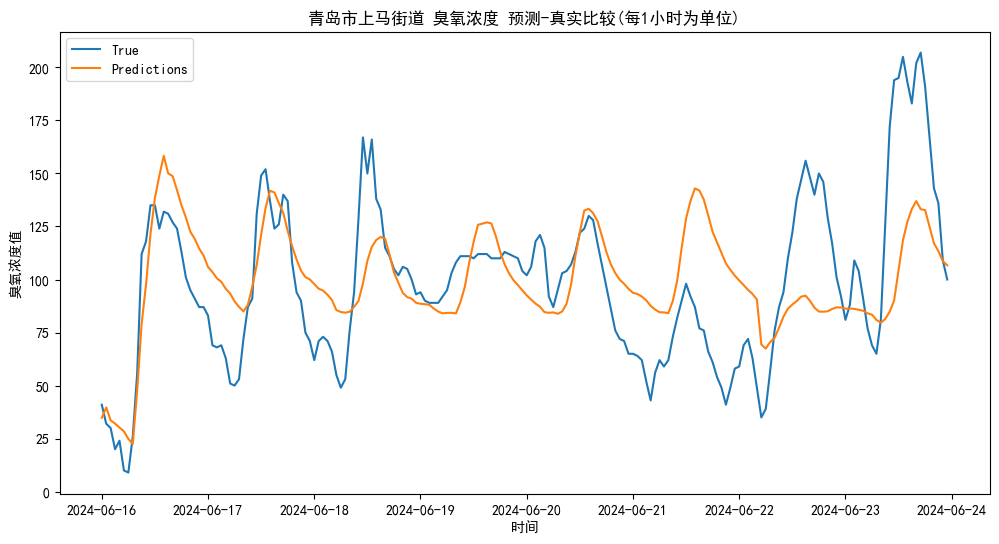

rmse: 32.22744506656727
r2 score: 0.290045485697373
all
rmse: 32.22744506656727
r2 score: 0.290045485697373
all-1
rmse: 26.692873110002704
r2 score: 0.28861680466921813
all-2
rmse: 21.071776081552905
r2 score: 0.5539356284382682


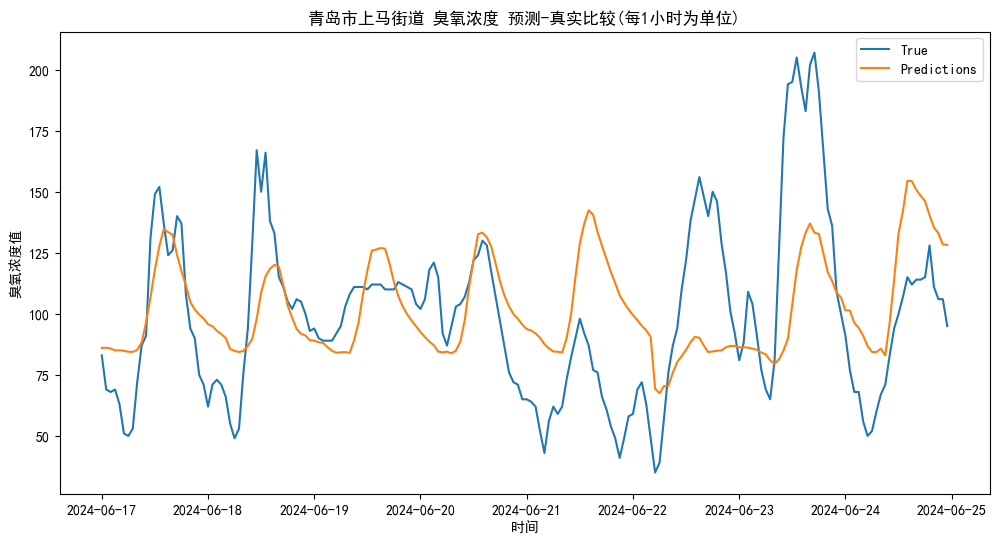

rmse: 32.75635711159178
r2 score: 0.1426293961229983
all
rmse: 32.75635711159178
r2 score: 0.1426293961229983
all-1
rmse: 29.537977609476282
r2 score: 0.025771772838212303
all-2
rmse: 27.00256247270938
r2 score: 0.06027034043022639


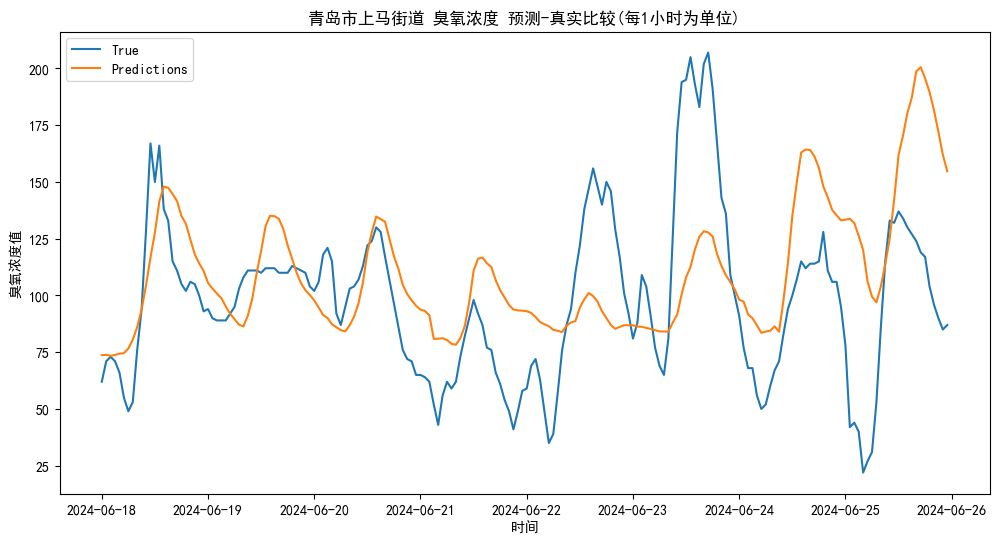

rmse: 38.06173538101226
r2 score: -0.10669477856911191
all
rmse: 38.06173538101226
r2 score: -0.10669477856911191
all-1
rmse: 31.66854075160003
r2 score: 0.273140377554677
all-2
rmse: 26.073421291883772
r2 score: 0.21085710709214822


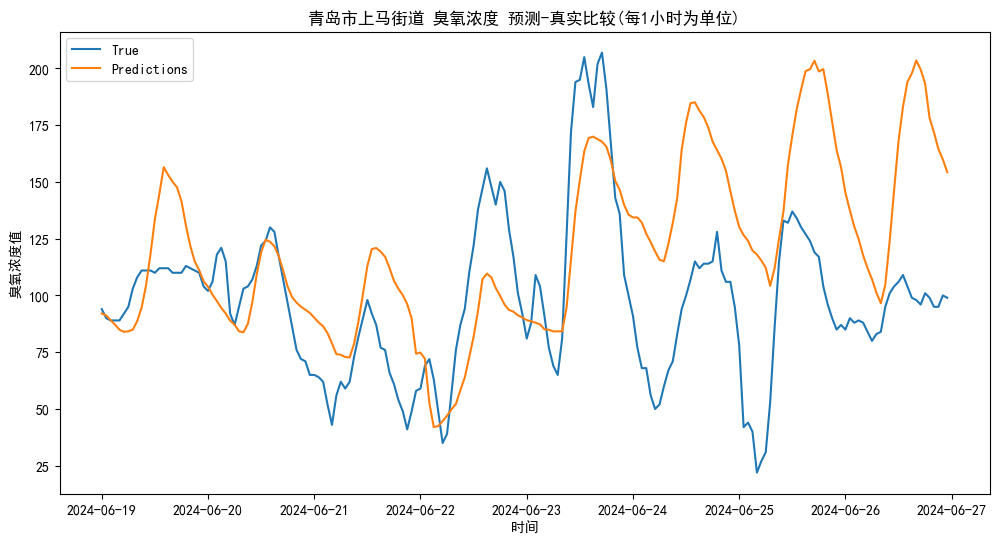

rmse: 44.6422207947345
r2 score: -0.6972236791718192
all
rmse: 44.6422207947345
r2 score: -0.6972236791718192
all-1
rmse: 34.213983555914375
r2 score: 0.09684792107496687
all-2
rmse: 26.196500495796855
r2 score: 0.518195420379705


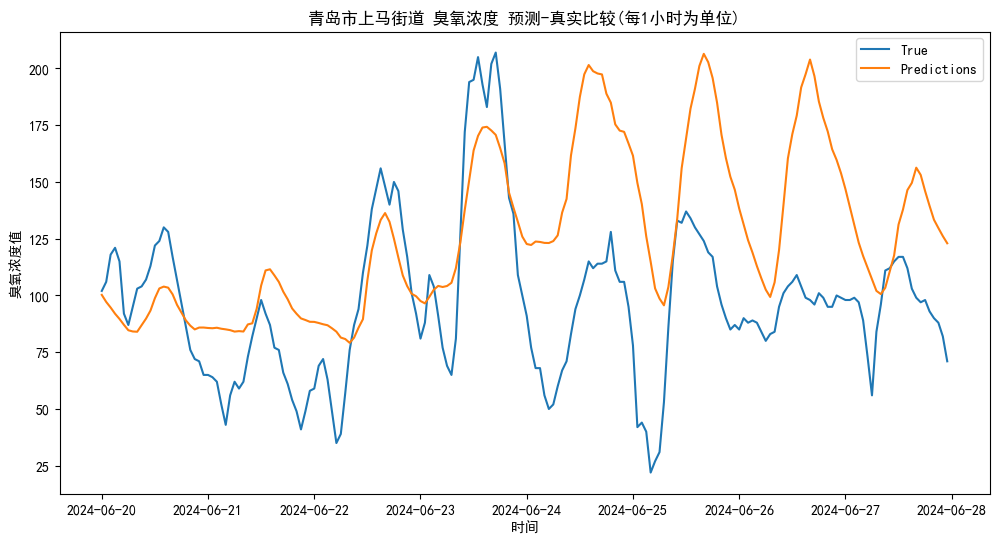

rmse: 46.80598893099583
r2 score: -0.8471632993260034
all
rmse: 46.80598893099583
r2 score: -0.8471632993260034
all-1
rmse: 45.12206359207854
r2 score: -0.3283921163920249
all-2
rmse: 38.564920396855726
r2 score: 0.03066277014216834


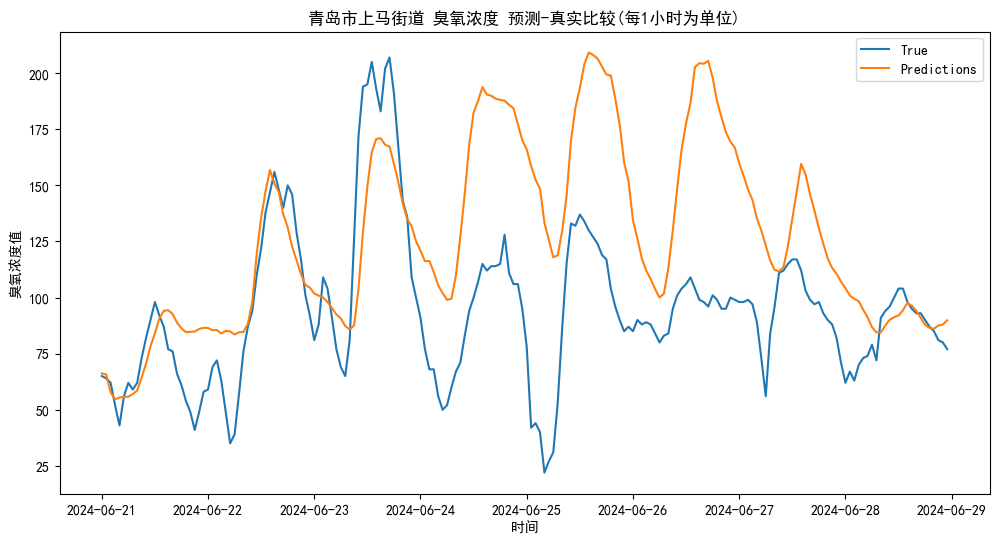

rmse: 48.79873431748157
r2 score: -1.028968369037797
all
rmse: 48.79873431748157
r2 score: -1.028968369037797
all-1
rmse: 53.483391472691906
r2 score: -0.9296074134654777
all-2
rmse: 50.12185640020321
r2 score: -0.4226593192497907


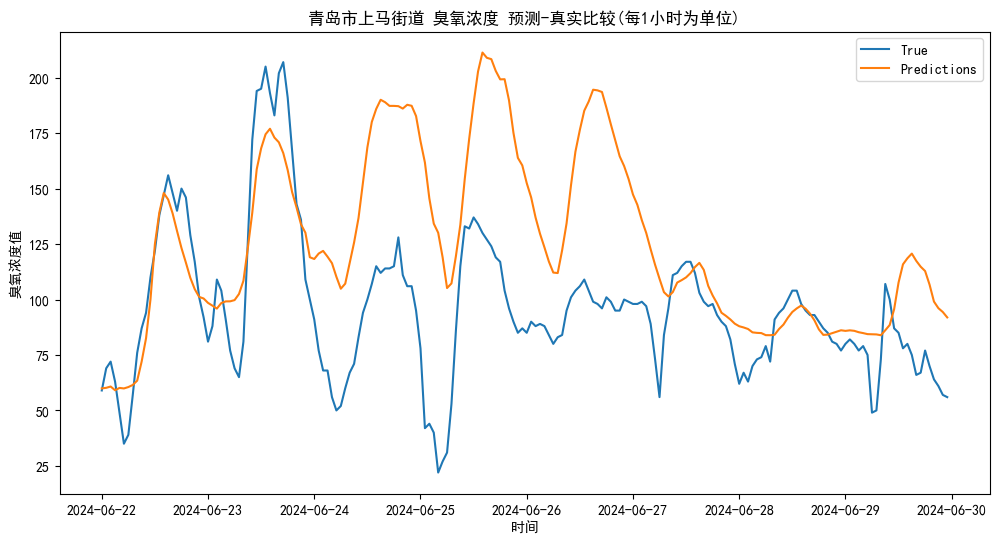

rmse: 46.313966671113434
r2 score: -0.9220193104246195
all
rmse: 46.313966671113434
r2 score: -0.9220193104246195
all-1
rmse: 51.8613259489515
r2 score: -1.0665449796984796
all-2
rmse: 55.75789261435033
r2 score: -1.0585616498918018


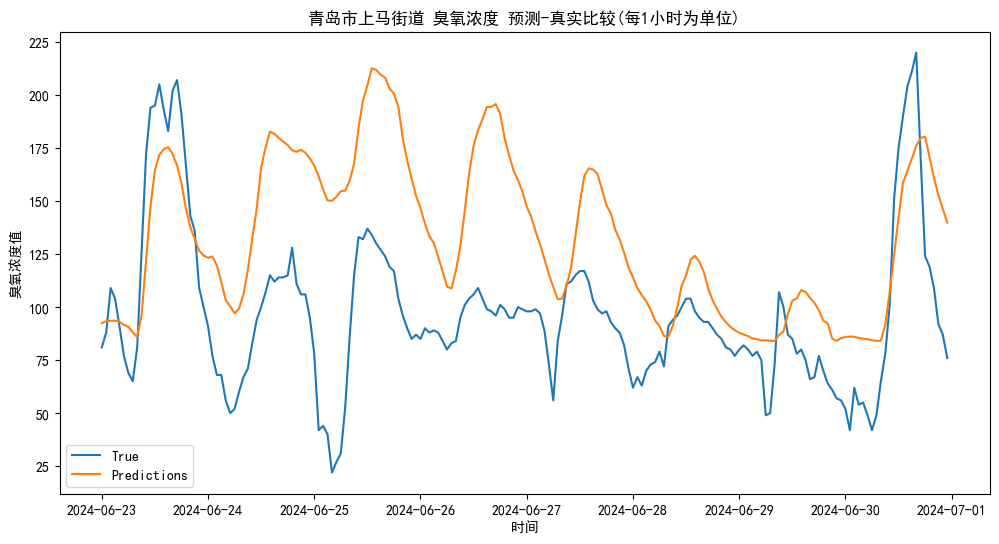

rmse: 50.76046307557591
r2 score: -0.8829532845217929
all
rmse: 50.76046307557591
r2 score: -0.8829532845217929
all-1
rmse: 55.48562747889165
r2 score: -1.7406253631505266
all-2
rmse: 59.92706789930752
r2 score: -1.8294890053561996


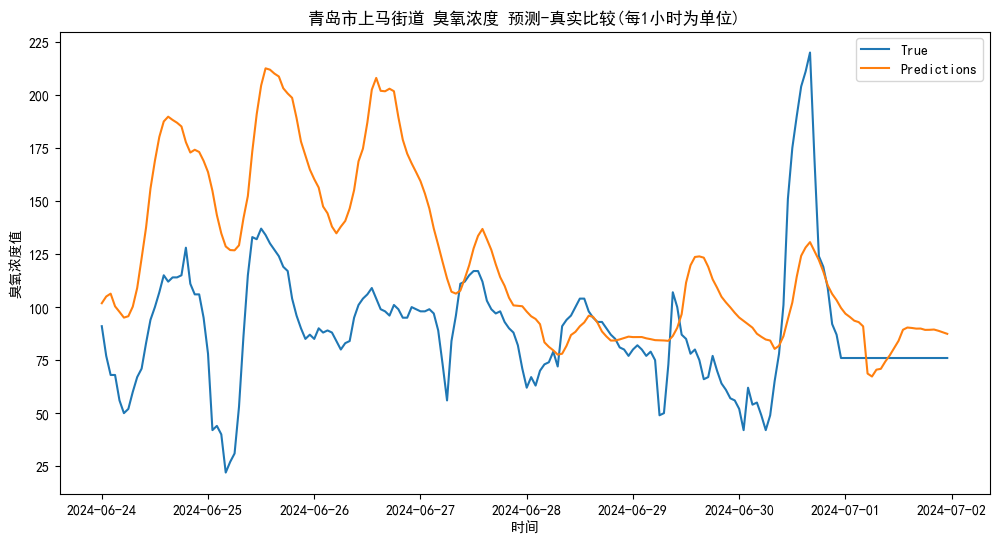

rmse: 51.215899119884334
r2 score: -2.0792096659972237
all
rmse: 51.215899119884334
r2 score: -2.0792096659972237
all-1
rmse: 55.82032671651325
r2 score: -5.367827493950706
all-2
rmse: 59.35601677780787
r2 score: -6.020438242721602


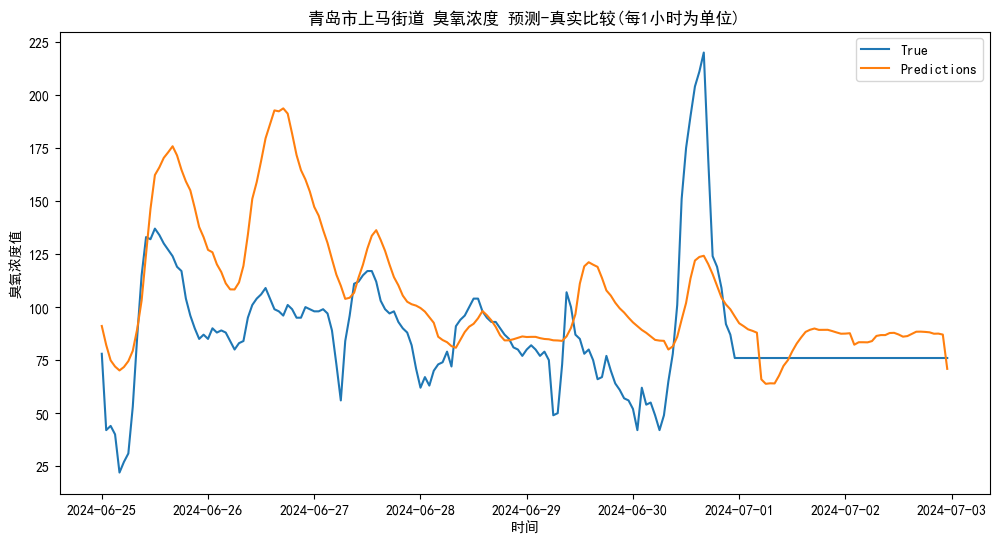

rmse: 35.012402685215505
r2 score: -0.5273841899701464
all
rmse: 35.012402685215505
r2 score: -0.5273841899701464
all-1
rmse: 39.92073925426833
r2 score: -0.571534195293772
all-2
rmse: 38.3621409721477
r2 score: -2.073116591584129


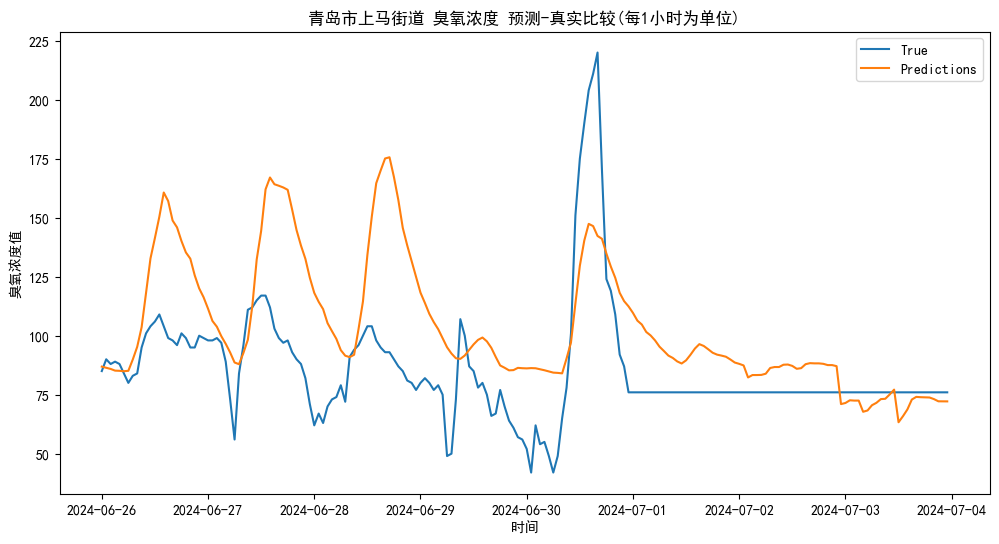

rmse: 30.980707120911777
r2 score: -0.5161292666371178
all
rmse: 30.980707120911777
r2 score: -0.5161292666371178
all-1
rmse: 35.45332286081348
r2 score: -0.5636673295632217
all-2
rmse: 37.82269467126955
r2 score: -0.5449198928383758


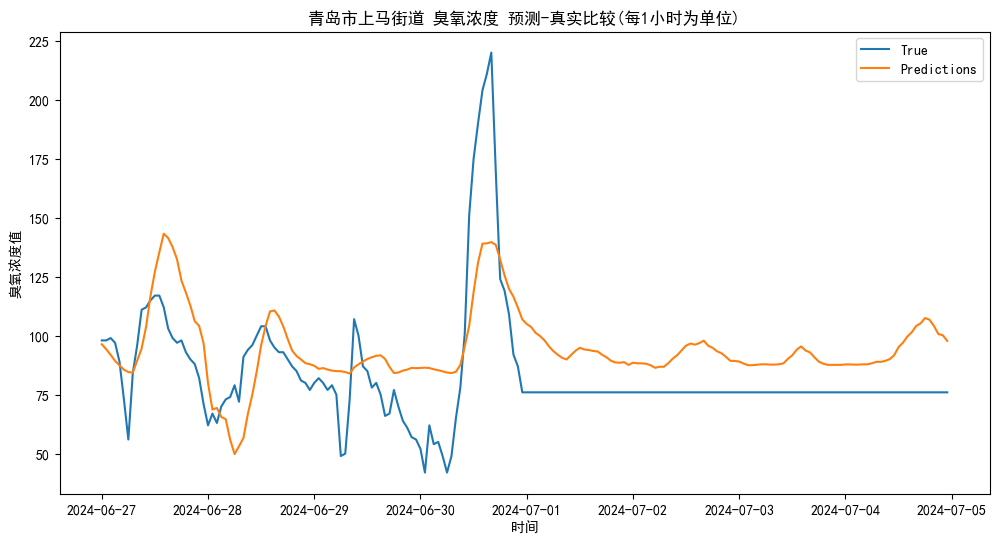

rmse: 21.836624321390982
r2 score: 0.23171049245367747
all
rmse: 21.836624321390982
r2 score: 0.23171049245367747
all-1
rmse: 23.144601957752332
r2 score: 0.33424175075446727
all-2
rmse: 24.339399652578123
r2 score: 0.37212935395942637


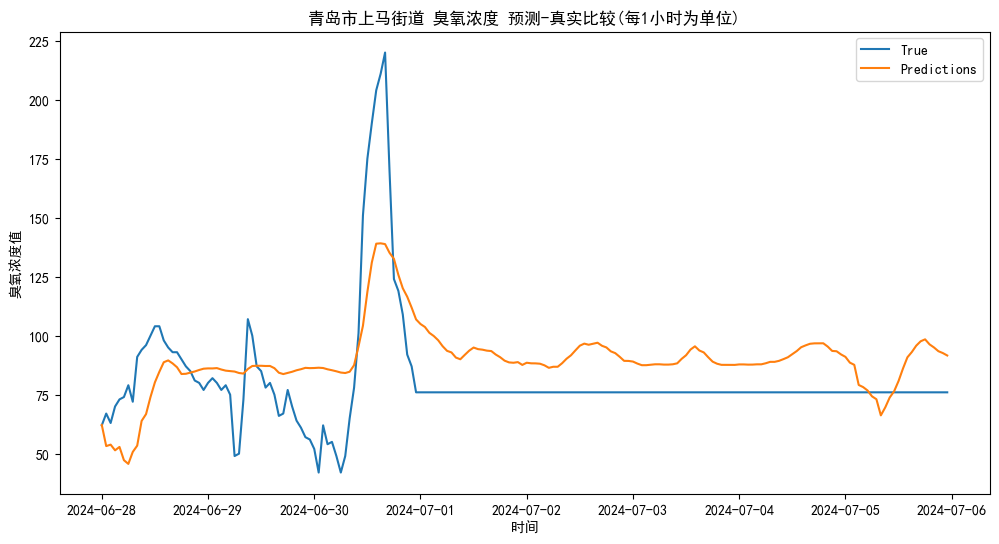

rmse: 20.91372541928736
r2 score: 0.23810333339304868
all
rmse: 20.91372541928736
r2 score: 0.23810333339304868
all-1
rmse: 22.589277028786476
r2 score: 0.3245768209643347
all-2
rmse: 23.992048226332365
r2 score: 0.3583175631050668


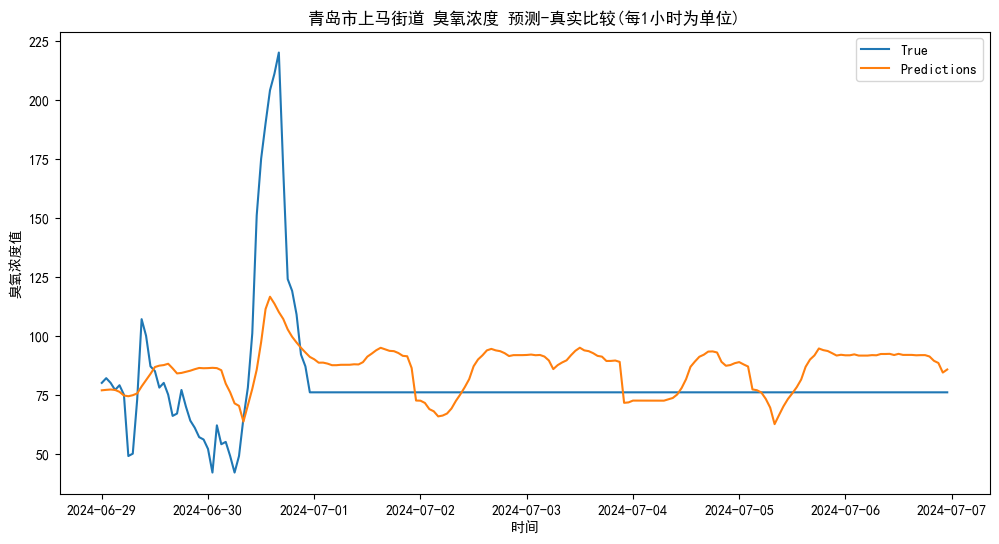

rmse: 21.645102380077436
r2 score: 0.15503349263137034
all
rmse: 21.645102380077436
r2 score: 0.15503349263137034
all-1
rmse: 23.763916598721995
r2 score: 0.2299092189937172
all-2
rmse: 25.648052154330845
r2 score: 0.24755685975497965


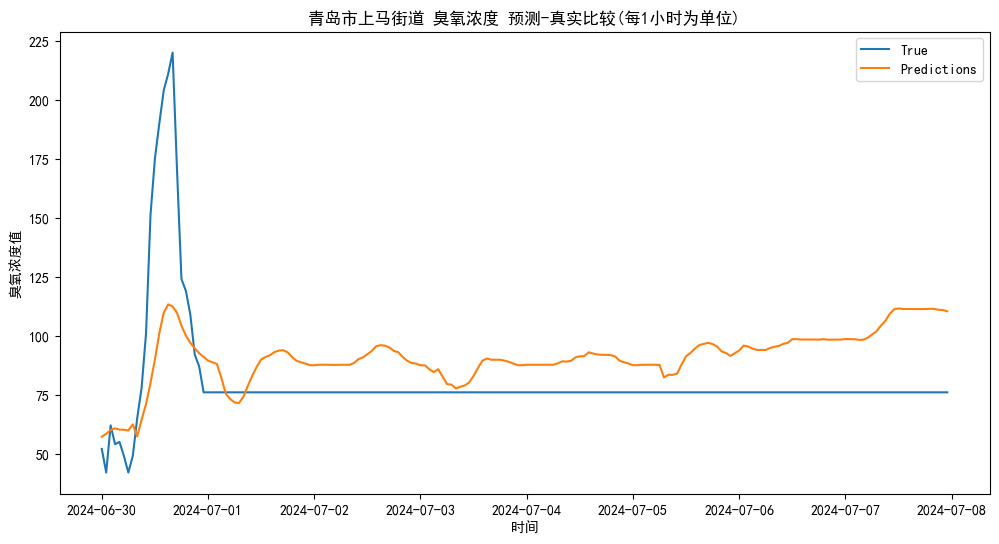

rmse: 24.13629600520263
r2 score: -0.10214078909203361
all
rmse: 24.13629600520263
r2 score: -0.10214078909203361
all-1
rmse: 23.30724808152072
r2 score: 0.22165486348161534
all-2
rmse: 24.650188533723526
r2 score: 0.26874992264346476


In [39]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
for i in range(len(df_list)):
# 绘制真实值和预测值的曲线
    plt.figure(figsize=(12, 6))
    plt.title("青岛市上马街道 臭氧浓度 预测-真实比较(每1小时为单位)")
    plt.plot(df_list[i]['日期'],y_list[i].values, label='True')
    plt.plot(df_list[i]['日期'],y_pred_list[i], label='Predictions')
    plt.xlabel('时间')
    plt.ylabel('臭氧浓度值')

# 显示每个具体的数值
    #for j in range(0, len(df_list[i]), 10):
    #    plt.text(df_list[i].loc[5*j]['日期'], y_list[i].values[j], f'{y_list[i].values[j]:.2f}', color='blue', fontsize=8, ha='right')
    #    plt.text(df_list[i].loc[5*j]['日期'], y_pred_list[i][j], f'{y_pred_list[i][j]:.2f}', color='orange', fontsize=8, ha='left')
    plt.legend()
    plt.show()
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all-1")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)]))
    print("all-2")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)]))

In [40]:
# from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
# import matplotlib.dates as mdates
# from datetime import datetime, timedelta
# date_range_list = []
# date_range_list111 = []
# start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
# end_date111 = datetime(2024, 5, 22, 23, 0, 0)
# date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
# merged_data111 = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')
# while end_date111 < datetime(2024, 7, 1, 0, 0, 0):
#     date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
#     date_range_list111.append(date_range111)
#     end_date111 += timedelta(hours=1)
#     start_date111 = end_date111
#     end_date111 += timedelta(days=1)
#     end_date111 -= timedelta(hours=1)


# true_value_list1 = []
# true_value_list1 = merged_data111['O3VAL'].tolist()



# start_date = datetime(2024, 5, 16, 0, 0, 0) 
# end_date = datetime(2024, 5, 16, 23, 0, 0)
# while end_date < datetime(2024, 7, 1, 0, 0, 0):
#     date_range = pd.date_range(start=start_date, end=end_date, freq='H')
#     date_range_list.append(date_range)
#     end_date += timedelta(hours=1)
#     start_date = end_date
#     end_date += timedelta(days=1)
#     end_date -= timedelta(hours=1)

# num = 0
# colors = [
#  '#d3e5f3','#a1cae1', 
#     '#5d9fcd', '#4292c6',  '#3171ad',
#     '#2864a0', '#2171b5',   '#08306b','orange'
# ]
# true_legend_added = 0 
# pred_value_list_7 = np.array([])
# pred_value_list_6 = np.array([])
# pred_value_list_5 = np.array([])
# pred_value_list_4 = np.array([])
# pred_value_list_3 = np.array([])
# pred_value_list_2 = np.array([])
# pred_value_list_1 = np.array([])
# pred_value_list_0 = np.array([])

# for date_ranges in date_range_list:
#     num = 7
#     for i in range(len(df_list)):
#         is_in_list = df_list[i]['日期'].isin(date_ranges)
#         rmse_list = []
#         r2_list = []
#         if is_in_list.any():
#             matching_indices = df_list[i].index[is_in_list].tolist()
#             matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
#             if num == 7:
#                 pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 6:
#                 pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 5:
#                 pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 4:
#                 pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 3:
#                 pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 2:
#                 pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 1:
#                 pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 0:
#                 pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             num-=1



# plt.figure(figsize=(15, 6))
# plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较(每1小时为单位)")
# plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
# plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
# plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
# plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
# plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
# plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
# # plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
# # plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
# plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
# plt.legend()
# plt.show()   


# print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
# print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
# print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
# print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
# print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
# print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
# print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
# print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
# print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
# print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
# print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
# print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
# # print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
# # print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
# # print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
# # print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))
# # r2_list.append(r2_score(y_list[i].values[int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1], y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1]))
# # print(f"第{num}条线,前{j+1}天 rmse:", rmse_list[j])
# # print(f"第{num}条线,前{j+1}天 r2 score:", r2_list[j])

In [41]:
# for i in range(46):

#     mase7 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24]))
#     mase6 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24]))
#     mase5 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24]))
#     mase4 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24]))
#     mase3 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24]))
#     mase2 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24]))
#     mase1 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24]))
#     mase0 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24]))
    
#     r27 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24])
#     r26 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24])
#     r25 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24])
#     r24 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24])
#     r23 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24])
#     r22 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24])
#     r21 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24])
#     r20 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24])
#     rmse_list = []
#     r2_list = []
#     rmse_list.append(mase7)
#     rmse_list.append(mase6)
#     rmse_list.append(mase5)
#     rmse_list.append(mase4)
#     rmse_list.append(mase3)
#     rmse_list.append(mase2)
#     rmse_list.append(mase1)
#     rmse_list.append(mase0)
#     std_dev1 = np.std(rmse_list)
#     r2_list.append(r27)
#     r2_list.append(r26)
#     r2_list.append(r25)
#     r2_list.append(r24)
#     r2_list.append(r23)
#     r2_list.append(r22)
#     r2_list.append(r21)
#     r2_list.append(r20)
#     std_dev2 = np.std(r2_list)
#     col_name1 = 'rmse'
#     col_name2 = 'r2'
    
    
    


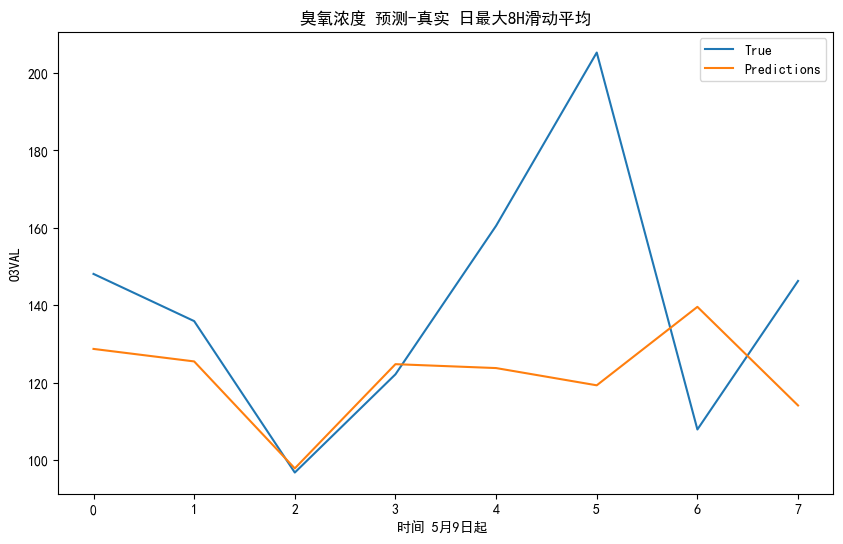

rmse: 37.53516530422652
r2 score: -0.40536022299149144
rmse: 15.554244666746664
r2 score: -5.515212512943838
rmse: 12.715201819666355
r2 score: 0.6625707444291398
rmse: 11.08959437939301
r2 score: 0.6617957611648366
rmse: 19.200042688368743
r2 score: 0.23933482487784996
rmse: 39.22735440086148
r2 score: -0.35497391765368125


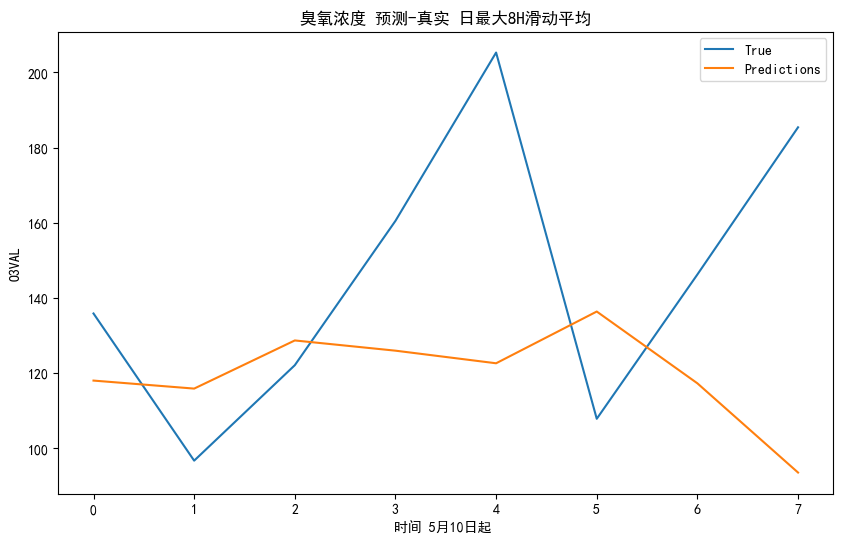

rmse: 48.503726348923124
r2 score: -0.917588533511609
rmse: 18.509281176998424
r2 score: 0.10477872224446316
rmse: 15.583053442712501
r2 score: 0.07540438498196733
rmse: 21.906026875027113
r2 score: 0.09743112179908009
rmse: 41.81943947028178
r2 score: -0.2857686248026208
rmse: 39.911835657707066
r2 score: -0.21069741147162646


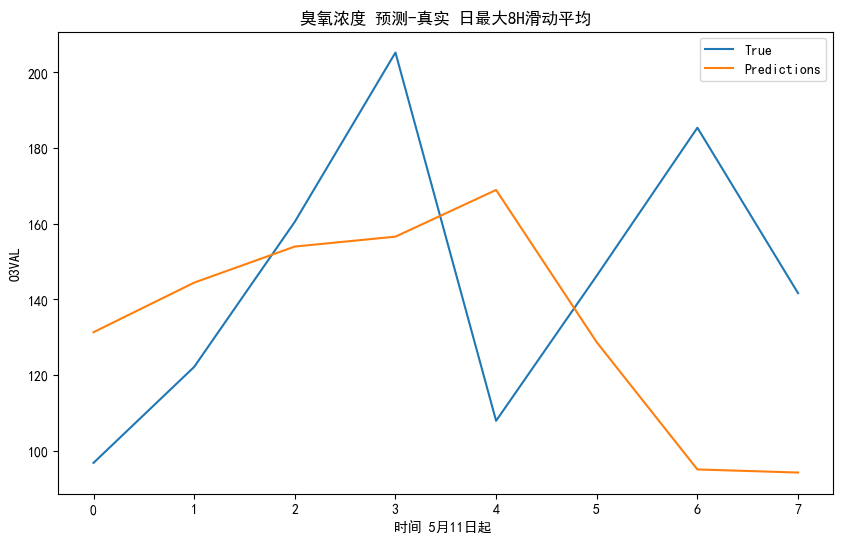

rmse: 48.15824126757771
r2 score: -0.9051219468013507
rmse: 29.07376661246262
r2 score: -4.251102421539038
rmse: 24.037518556846287
r2 score: 0.1586211785337669
rmse: 32.0279697799376
r2 score: 0.3890731967783646
rmse: 39.57095761685017
r2 score: 0.007523818321686582
rmse: 36.8316208898703
r2 score: -0.02528137355478033


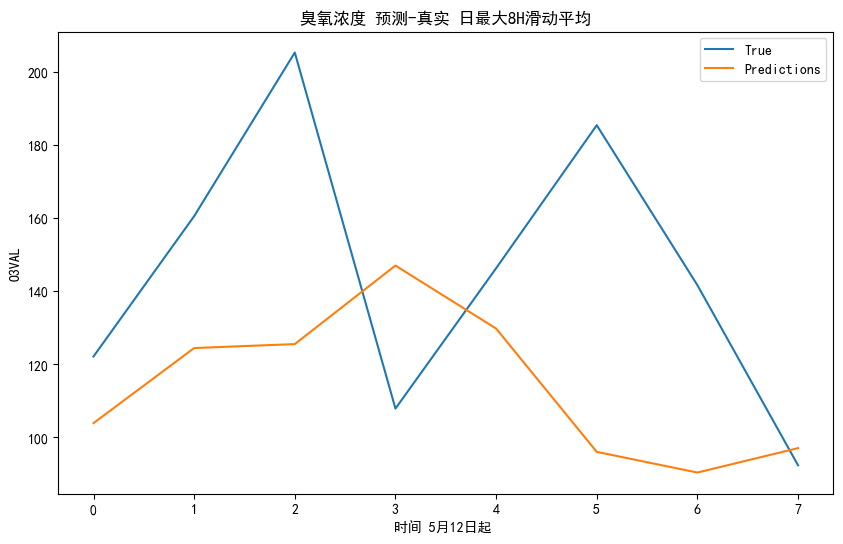

rmse: 50.52512336204424
r2 score: -1.0053142816588627
rmse: 28.575663111447593
r2 score: -1.21797092487231
rmse: 51.61054919762646
r2 score: -1.308417066380252
rmse: 48.78868369726811
r2 score: -0.6675357680137355
rmse: 44.25606358502857
r2 score: -0.7133783175162671
rmse: 54.4277988824155
r2 score: -1.5929358267181501


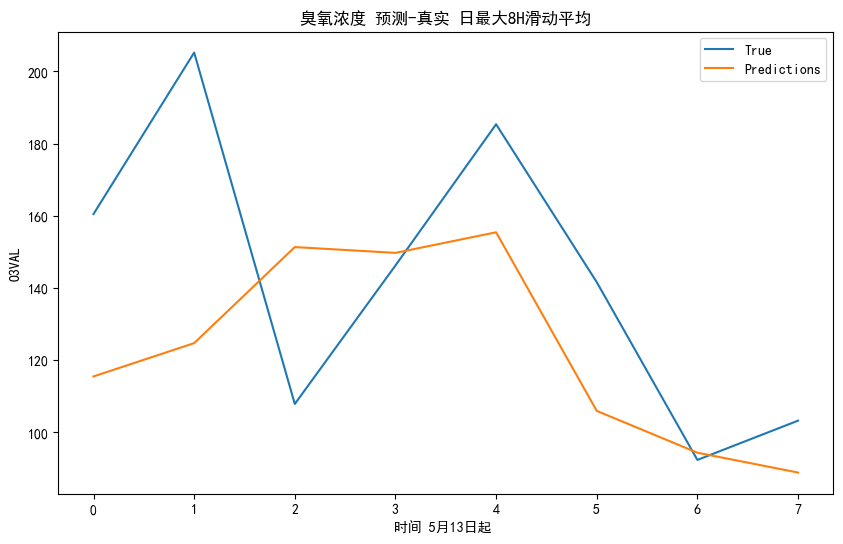

rmse: 39.982793998232864
r2 score: -0.12521259385085304
rmse: 65.2224643136437
r2 score: -7.497052853320735
rmse: 58.87286728712193
r2 score: -1.1884714797342748
rmse: 51.015295832467125
r2 score: -1.1452752882309611
rmse: 47.55214485270225
r2 score: -1.0217255117543989
rmse: 45.78628986222341
r2 score: -1.1294940905655673


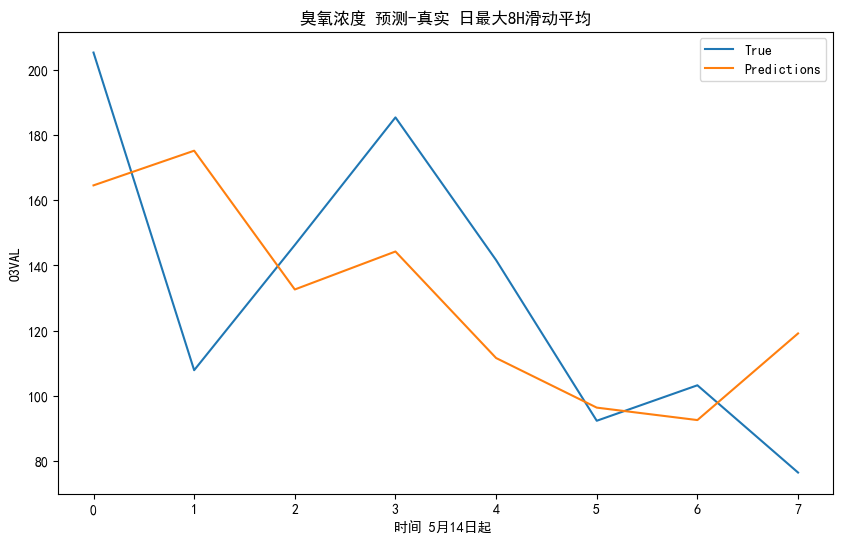

rmse: 36.93069416413114
r2 score: 0.2510466832197915
rmse: 55.611825393761116
r2 score: -0.3046660190203041
rmse: 46.08336206271187
r2 score: -0.32403068512126443
rmse: 44.89276066238563
r2 score: -0.4416304574199279
rmse: 42.33809693132858
r2 score: -0.5195838889518023
rmse: 38.684179472812026
r2 score: 0.04562662181530508


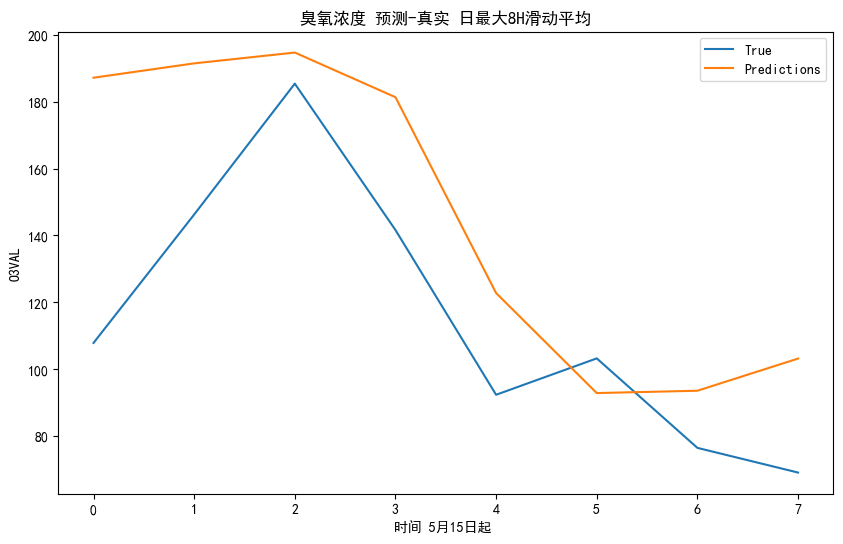

rmse: 39.48399586951642
r2 score: -0.1416047934908895
rmse: 64.5183179271321
r2 score: -10.306528632935128
rmse: 52.95151362277205
r2 score: -1.8008577080267107
rmse: 49.96886578831847
r2 score: -2.305994087471198
rmse: 46.71554769529117
r2 score: -1.0743516495932024
rmse: 42.85482004976088
r2 score: -0.811014756397255


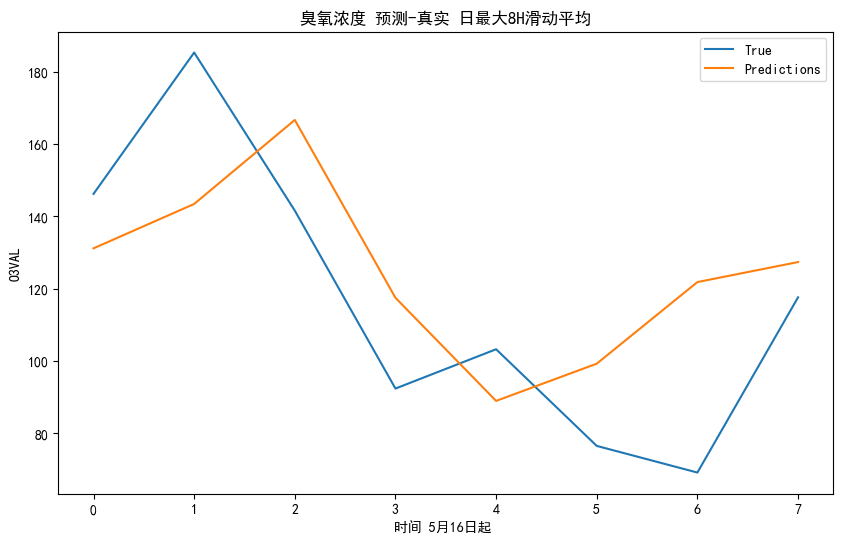

rmse: 29.243555963326248
r2 score: 0.3702219361916923
rmse: 31.490649729866348
r2 score: -1.5912811320390903
rmse: 29.51173260627173
r2 score: -1.2613925485276245
rmse: 28.478315229503618
r2 score: 0.2560906859543637
rmse: 26.26168206318688
r2 score: 0.37592029310426545
rmse: 25.711890680408327
r2 score: 0.5197364544030235


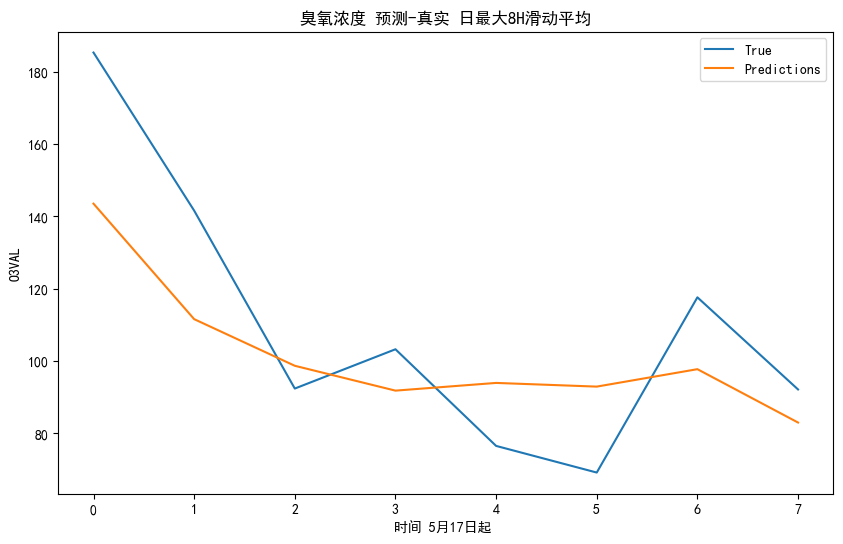

rmse: 22.834990841348436
r2 score: 0.5913467118885682
rmse: 36.41141906160326
r2 score: -1.7706335359053011
rmse: 29.951677067878236
r2 score: 0.37838480727512214
rmse: 26.56326739676361
r2 score: 0.4705641540346017
rmse: 25.005338548662923
r2 score: 0.5927836538684923
rmse: 24.806408240107906
r2 score: 0.6239948480948774


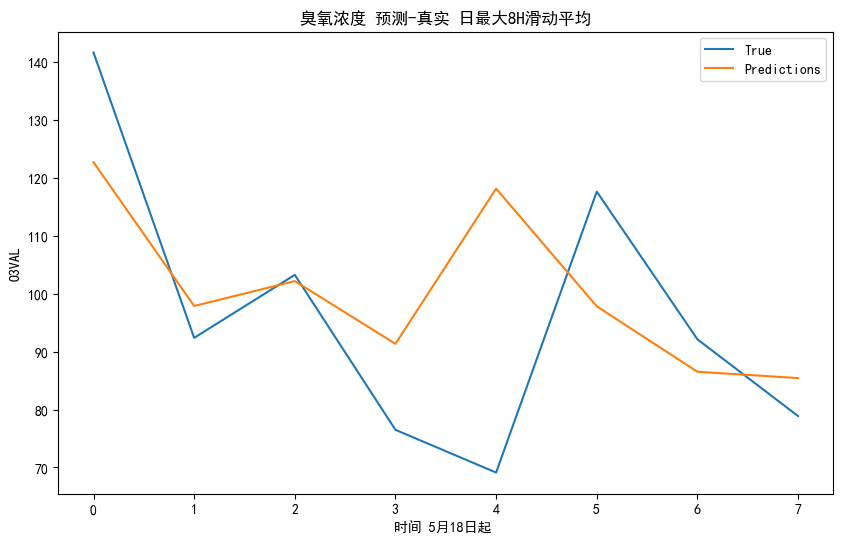

rmse: 20.852337326923784
r2 score: 0.13560047810982134
rmse: 13.945529844704064
r2 score: 0.6792862642796766
rmse: 11.403334089336662
r2 score: 0.7086186080304375
rmse: 12.353046034604809
r2 score: 0.7353407874986295
rmse: 24.543851358169878
r2 score: 0.07271799706078186
rmse: 23.819486939676313
r2 score: 0.05895039148118364


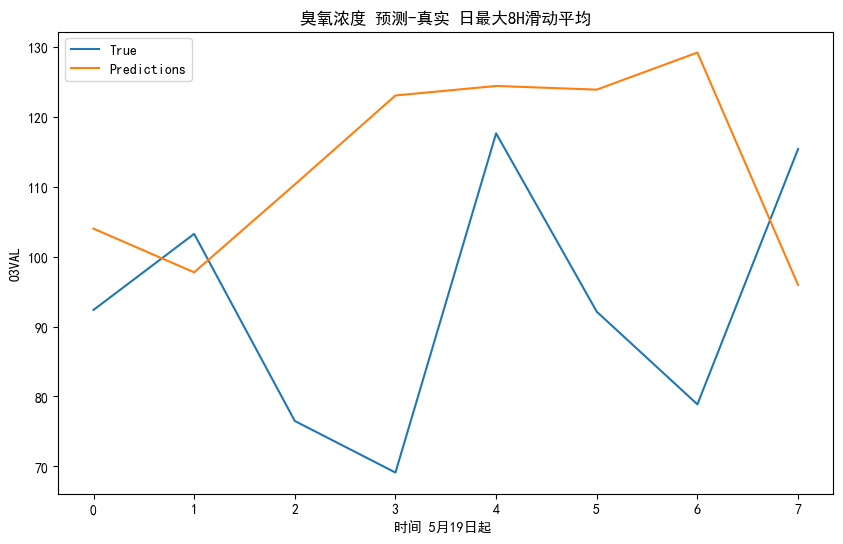

rmse: 31.96981085321127
r2 score: -2.6262285481339336
rmse: 9.09111763345929
r2 score: -1.7953488539174232
rmse: 20.884889429138333
r2 score: -2.615259983958104
rmse: 32.462202442902566
r2 score: -4.9257861479552165
rmse: 29.192578775208272
r2 score: -1.755086032875984
rmse: 29.634035736422977
r2 score: -2.4066257552321746


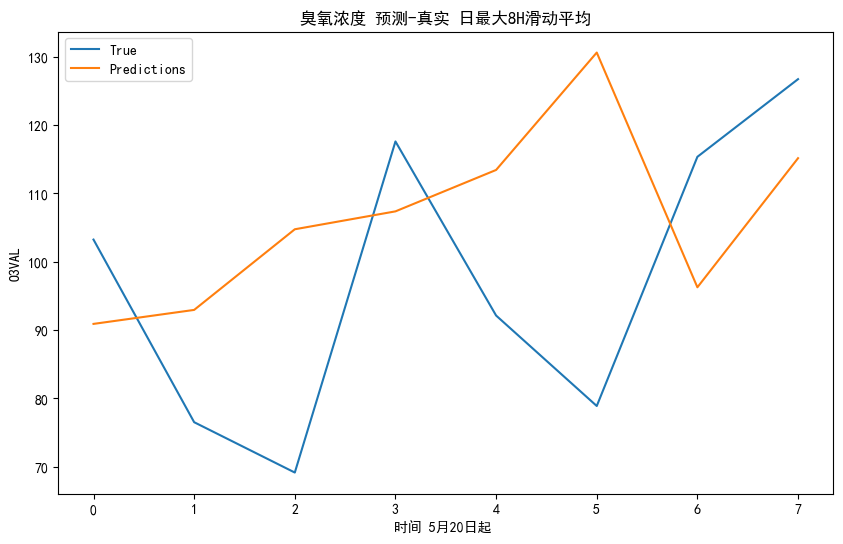

rmse: 26.05783282143833
r2 score: -0.6791293801432892
rmse: 14.544346816769552
r2 score: -0.1824992188745196
rmse: 23.75515947711715
r2 score: -1.625407319735415
rmse: 21.2003222912536
r2 score: -0.16276389337241737
rmse: 21.22497308060606
r2 score: -0.4566484349012456
rmse: 28.67271148190639
r2 score: -1.9292567427031817


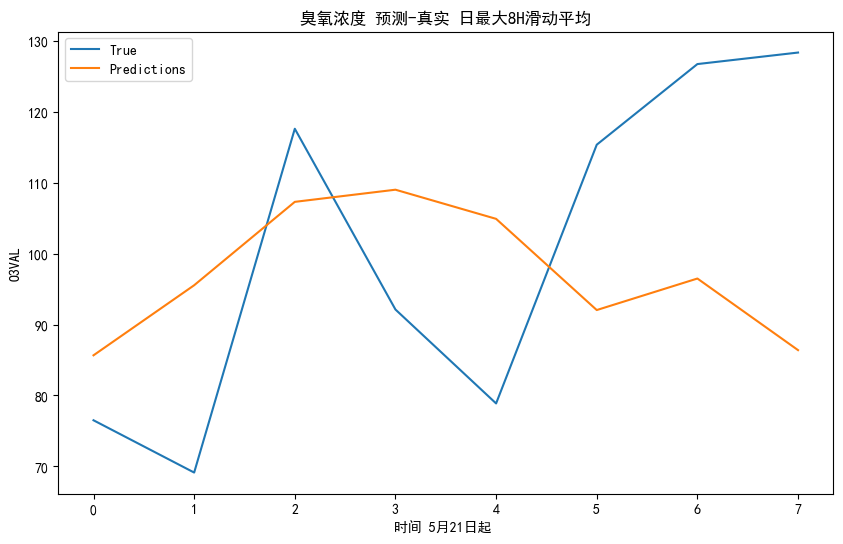

rmse: 25.184399149876565
r2 score: -0.24402826335923145
rmse: 19.776037304214412
r2 score: -27.761695711912125
rmse: 17.209953559903603
r2 score: 0.3495111036748708
rmse: 17.133483750190308
r2 score: 0.14931213571294066
rmse: 19.247295555241624
r2 score: -0.2688451910017433
rmse: 19.98492644479301
r2 score: -0.12091170663308604


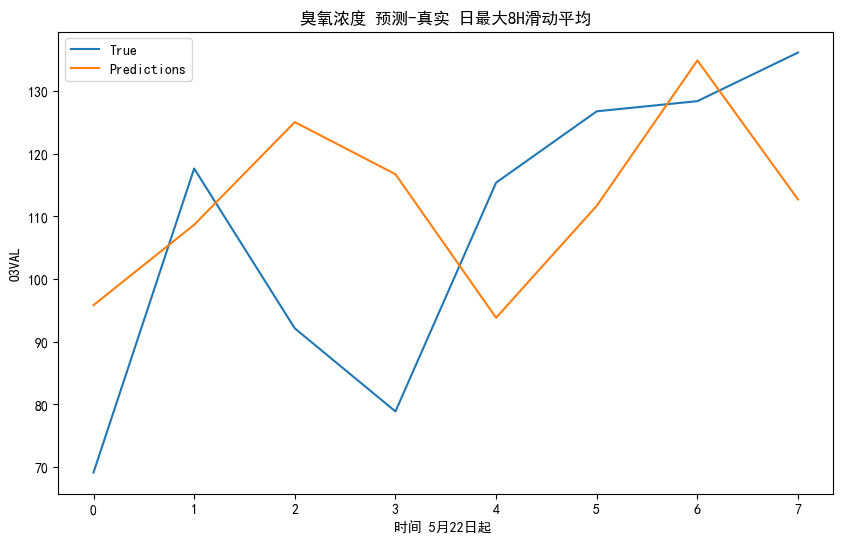

rmse: 23.959030299298906
r2 score: -0.06394437134469277
rmse: 19.921576866077462
r2 score: 0.3251240729836833
rmse: 25.011916298200024
r2 score: -0.5943263803407834
rmse: 28.761065044456565
r2 score: -1.49546787963344
rmse: 27.47240320686408
r2 score: -1.0243624702219964
rmse: 25.822236632989885
r2 score: -0.46862141263932644


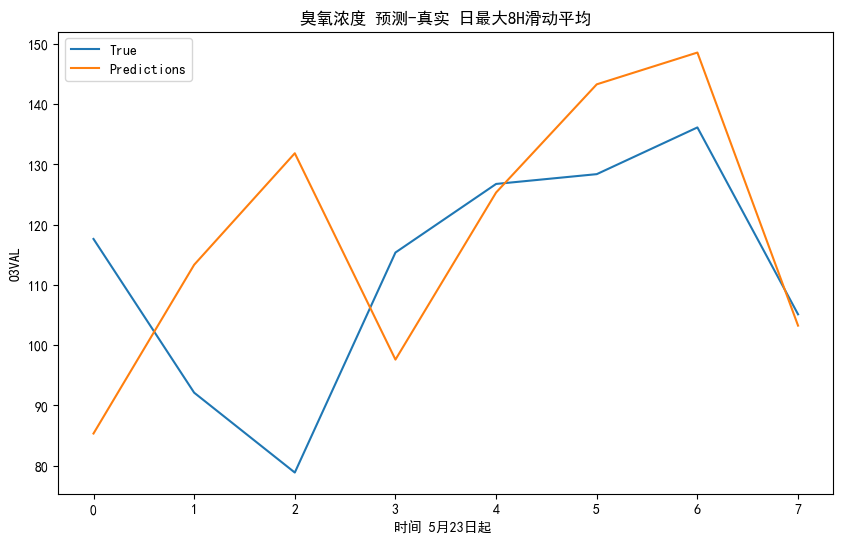

rmse: 24.98653717956697
r2 score: -0.8862525838647568
rmse: 27.311248688253844
r2 score: -3.5884155627014067
rmse: 37.84722311910864
r2 score: -4.539163512733584
rmse: 33.958749825676456
r2 score: -3.3876456894515403
rmse: 30.380255675827673
r2 score: -1.9175047926874598
rmse: 28.392477329949358
r2 score: -1.4264200261262299


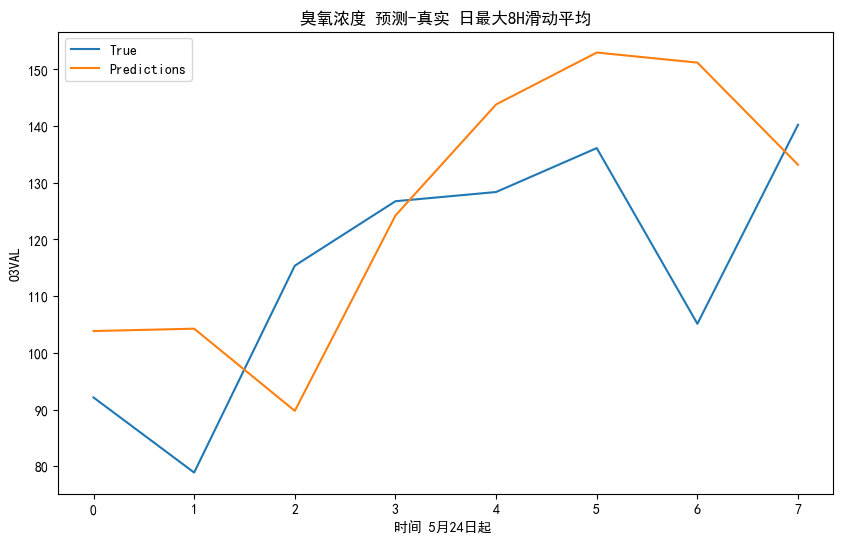

rmse: 22.75095419550468
r2 score: -0.24514527201273917
rmse: 19.770415749776348
r2 score: -7.905531395805019
rmse: 21.892299121007046
r2 score: -1.105793542311741
rmse: 19.001078103746917
r2 score: -0.01904919407159178
rmse: 18.34610304752901
r2 score: 0.12391296632988491
rmse: 18.10678550414591
r2 score: 0.23342001006768487


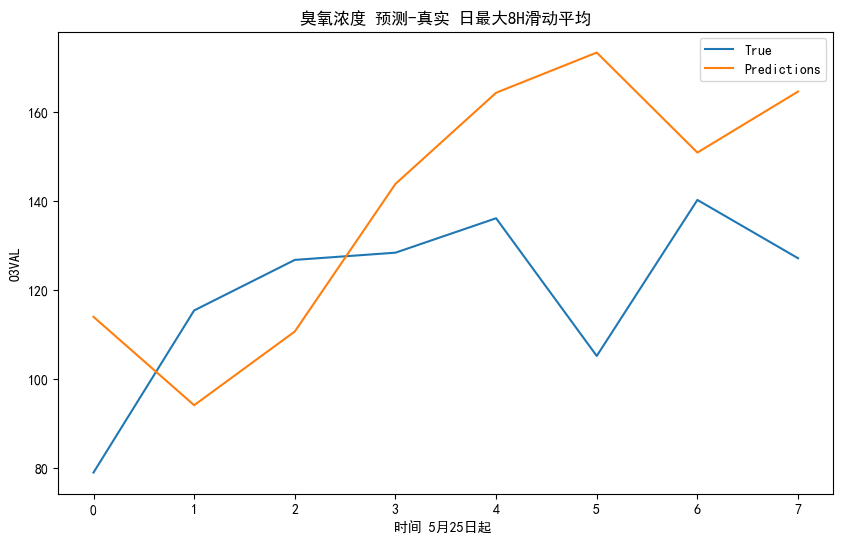

rmse: 33.856004429389294
r2 score: -2.3104461150988147
rmse: 29.020385366461618
r2 score: -1.5286027902208734
rmse: 25.45810173054709
r2 score: -0.5539607532005526
rmse: 23.367201585641816
r2 score: -0.37030092169220263
rmse: 24.423158705044074
r2 score: -0.4574680980092851
rmse: 35.70264335692089
r2 score: -2.531250501234381


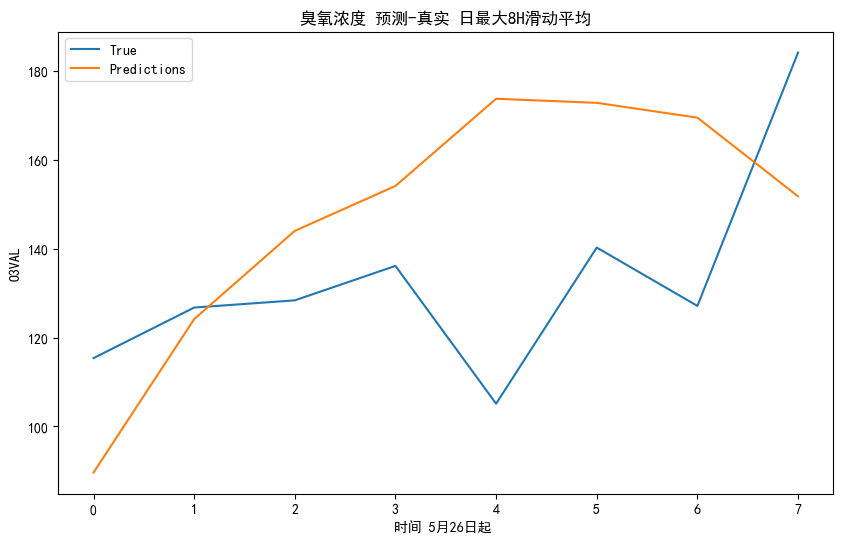

rmse: 35.078710830922816
r2 score: -1.5511854183984632
rmse: 18.295658637536032
r2 score: -9.3479251292355
rmse: 17.451843184518562
r2 score: -8.105704058410026
rmse: 17.586388512452707
r2 score: -4.62618902440516
rmse: 34.47771061217986
r2 score: -9.06083264473642
rmse: 34.165624193871956
r2 score: -7.165047104859591


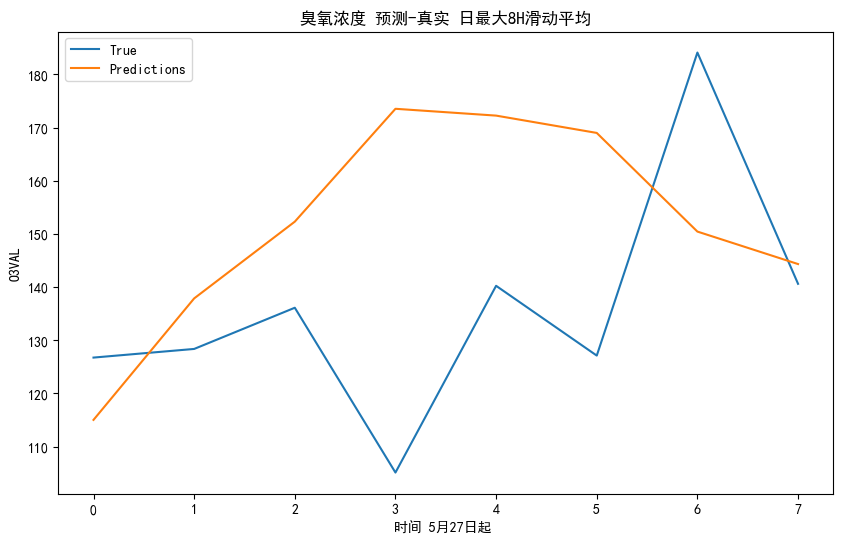

rmse: 33.72317510023219
r2 score: -1.5764761318189318
rmse: 10.669602267049202
r2 score: -171.44464857678994
rmse: 12.778646967891214
r2 score: -8.75899972588476
rmse: 35.955798315984
r2 score: -8.758062748646841
rmse: 35.20278753472478
r2 score: -7.3871729158479855
rmse: 36.401121258929315
r2 score: -9.761000750801417


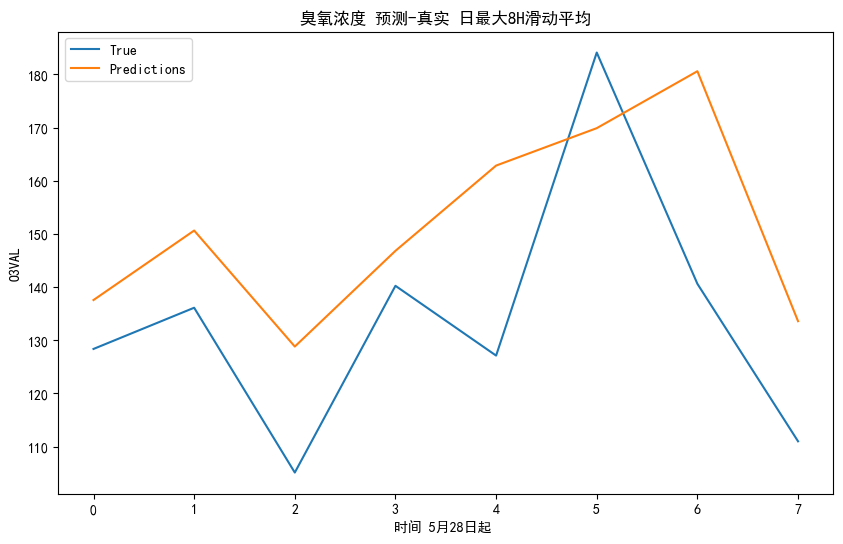

rmse: 23.690294434514666
r2 score: -0.11091053675064222
rmse: 12.156193115380022
r2 score: -8.841284066325088
rmse: 16.90527792259066
r2 score: -0.6470636642985861
rmse: 15.005458394993761
r2 score: -0.21981235962174206
rmse: 20.87116691924639
r2 score: -1.949459059997595
rmse: 19.917608375688367
r2 score: 0.3039927839907044


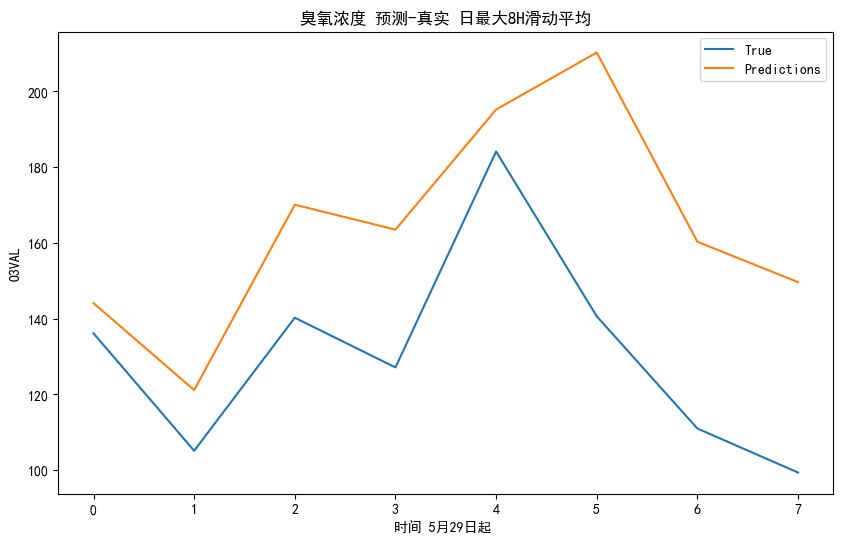

rmse: 39.46568278423636
r2 score: -1.4388253920265472
rmse: 12.657993343869288
r2 score: 0.3330913819211687
rmse: 20.088672202370255
r2 score: -0.6421121020392733
rmse: 25.169561938657278
r2 score: -2.4370798432773237
rmse: 23.05038020881815
r2 score: 0.2030866998322759
rmse: 35.36450052398519
r2 score: -1.2485575370795812


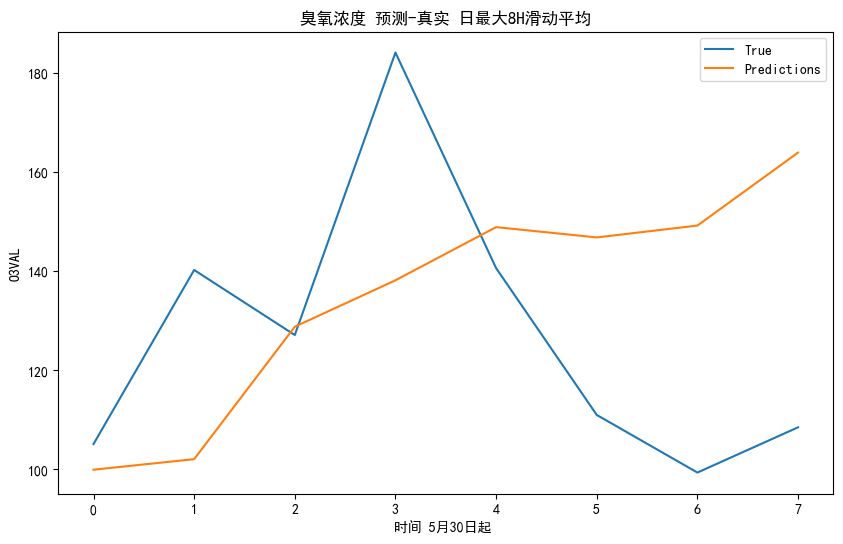

rmse: 36.241613825966354
r2 score: -0.9229299401351534
rmse: 27.239678369457398
r2 score: -1.405643544077459
rmse: 22.26216037266844
r2 score: -1.3599790004137127
rmse: 29.99405145515428
r2 score: -0.08186691098080634
rmse: 27.08139349422936
r2 score: -0.10186993429105162
rmse: 28.723020019110386
r2 score: -0.23674807168062695


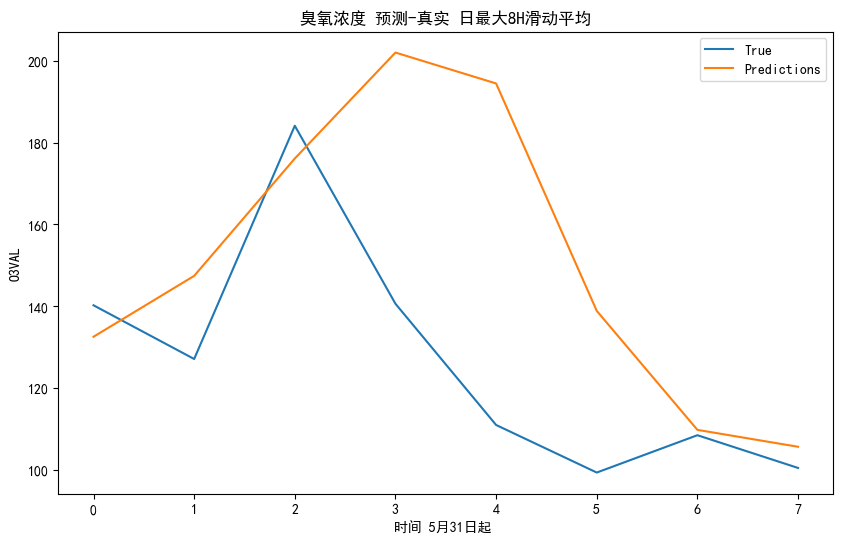

rmse: 40.090832296954815
r2 score: -1.2615401731965883
rmse: 15.357836248894463
r2 score: -4.476731280494453
rmse: 13.365197186764139
r2 score: 0.6992944464772046
rmse: 32.80294873603344
r2 score: -1.3199995125216715
rmse: 47.4739167751758
r2 score: -2.817002147028368
rmse: 46.24159724428082
r2 score: -1.9356928995397693


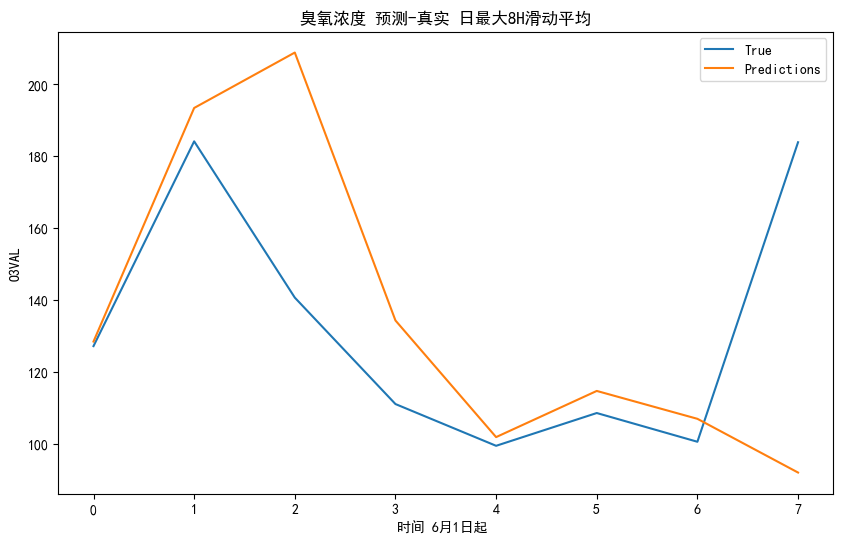

rmse: 41.564598447754655
r2 score: -0.6153524015721299
rmse: 6.629780132321078
r2 score: 0.9458861377618722
rmse: 39.755192590876916
r2 score: -1.6719785933012927
rmse: 36.34094892647244
r2 score: -0.7894544525682994
rmse: 32.52236590007363
r2 score: -0.22432230641880802
rmse: 29.794695680671396
r2 score: -0.11022105684409267


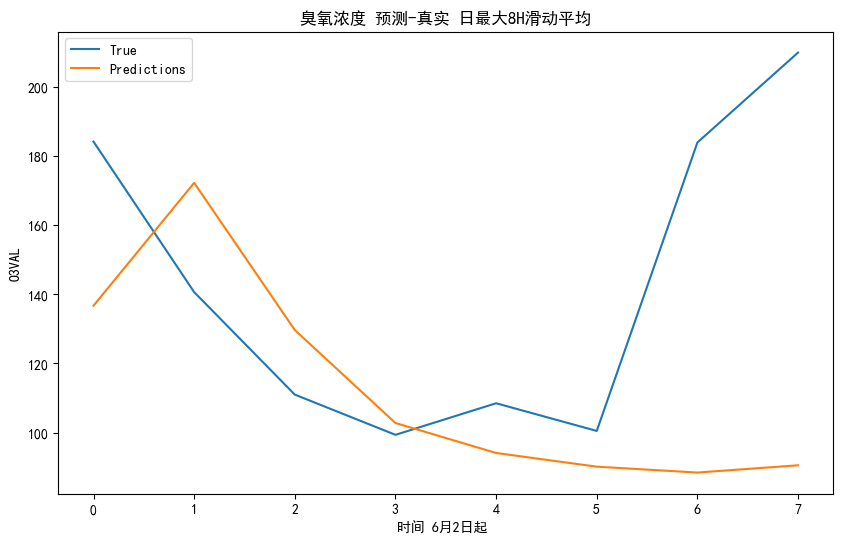

rmse: 58.36946676397899
r2 score: -0.9809708365621703
rmse: 40.28759614546339
r2 score: -2.4310274079639718
rmse: 34.61457324797687
r2 score: -0.3284847301363707
rmse: 30.025684492053607
r2 score: 0.15824506582056963
rmse: 27.614314385506905
r2 score: 0.20491786146766278
rmse: 25.55858053972468
r2 score: 0.2820599072349923


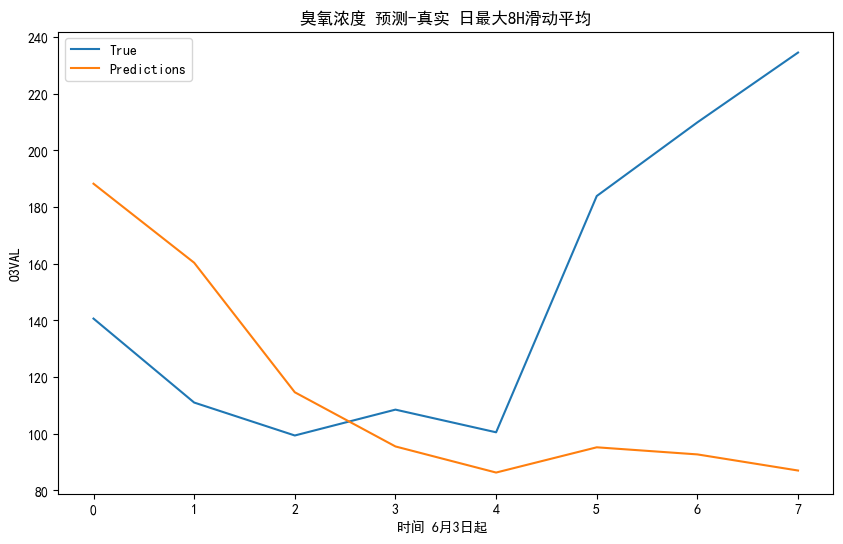

rmse: 77.98097120340312
r2 score: -1.408352739604076
rmse: 48.47582626689349
r2 score: -9.710104638823168
rmse: 40.54808184690504
r2 score: -4.451528559405857
rmse: 35.71157461277936
r2 score: -4.319533347980765
rmse: 32.566774230863444
r2 score: -3.716768085405814
rmse: 46.84243958633344
r2 score: -1.4248611737847598


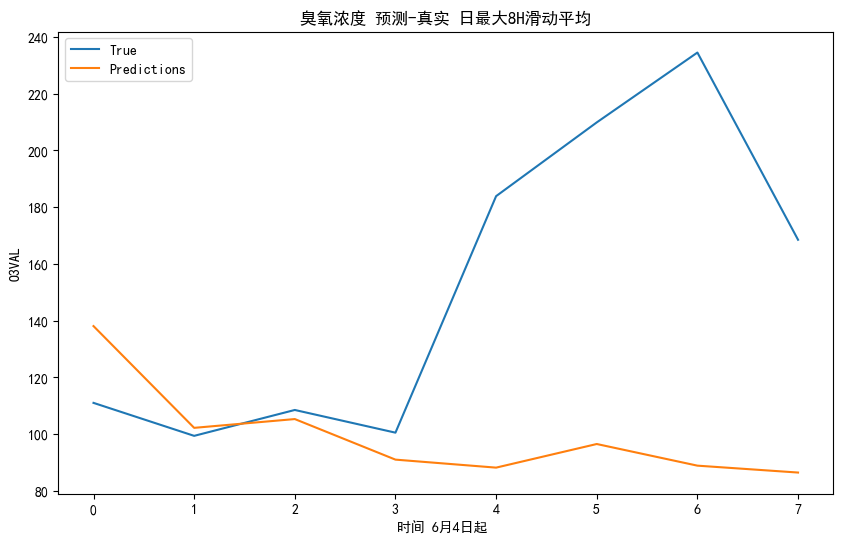

rmse: 79.68403889415151
r2 score: -1.4852765522855145
rmse: 19.2458315927909
r2 score: -9.963454807111281
rmse: 15.82283262652874
r2 score: -9.029804605677704
rmse: 14.503941600997289
r2 score: -7.410958794748472
rmse: 44.72194749744241
r2 score: -0.9620693774041724
rmse: 61.71747814126879
r2 score: -0.9481882534132191


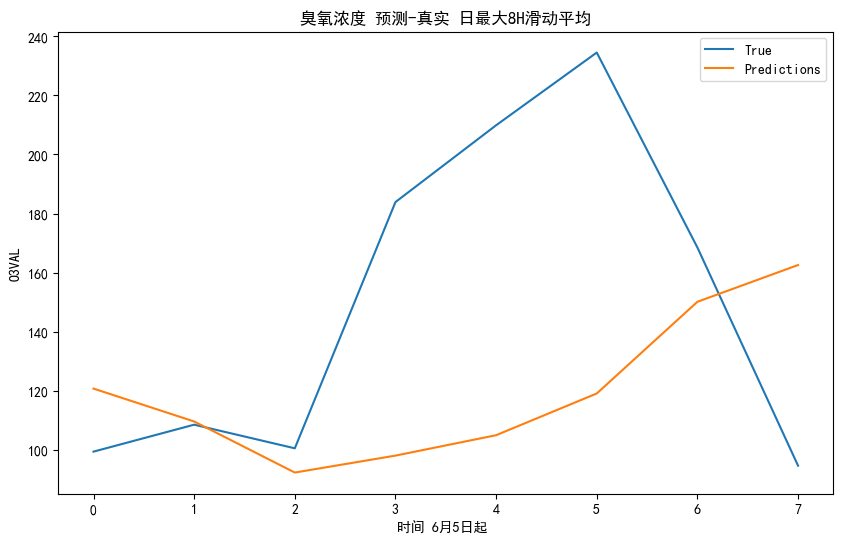

rmse: 68.1778192995548
r2 score: -0.6889698974644627
rmse: 15.11314032585166
r2 score: -9.972451621368776
rmse: 13.218407979528765
r2 score: -9.58724534816362
rmse: 44.42499658771581
r2 score: -0.5850807460055898
rmse: 61.49221092797032
r2 score: -0.7172830578130371
rmse: 73.29487706050448
r2 score: -0.7532512074733786


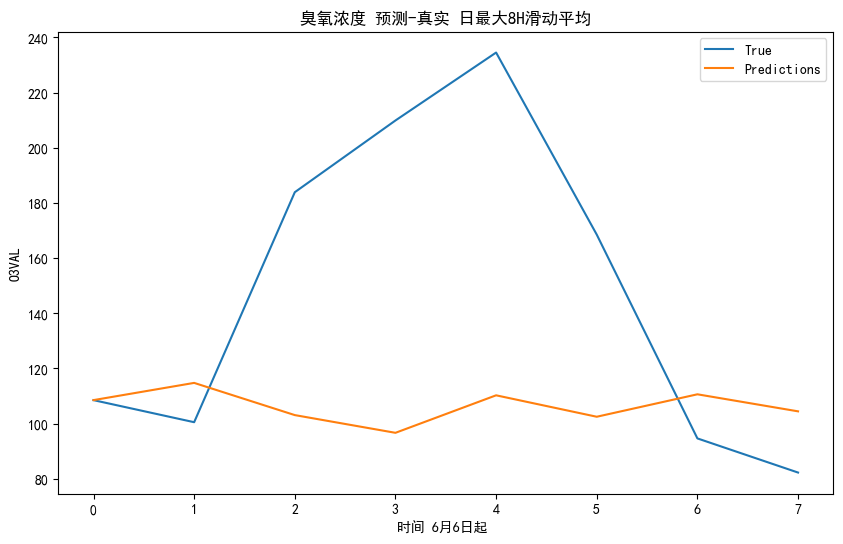

rmse: 70.79509979044226
r2 score: -0.6702139024981391
rmse: 10.076889611958407
r2 score: -5.346481515724703
rmse: 47.36912315654224
r2 score: -0.5905215707781841
rmse: 69.91167544717237
r2 score: -1.195918303303567
rmse: 83.65268701610826
r2 score: -1.4092417105433035
rmse: 80.98110269335507
r2 score: -1.709204116419492


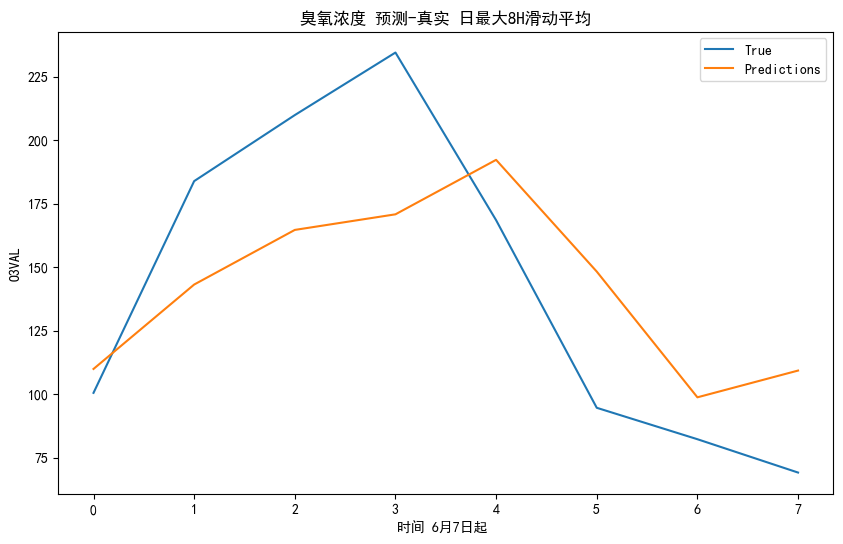

rmse: 40.58027971796831
r2 score: 0.5371010062019008
rmse: 29.55600986487244
r2 score: 0.49733354590042944
rmse: 35.550498355080116
r2 score: 0.41937835120917477
rmse: 44.29683687685686
r2 score: 0.2289101712221745
rmse: 41.01951651261358
r2 score: 0.18547855235476274
rmse: 43.37723595665102
r2 score: 0.30844587727215145


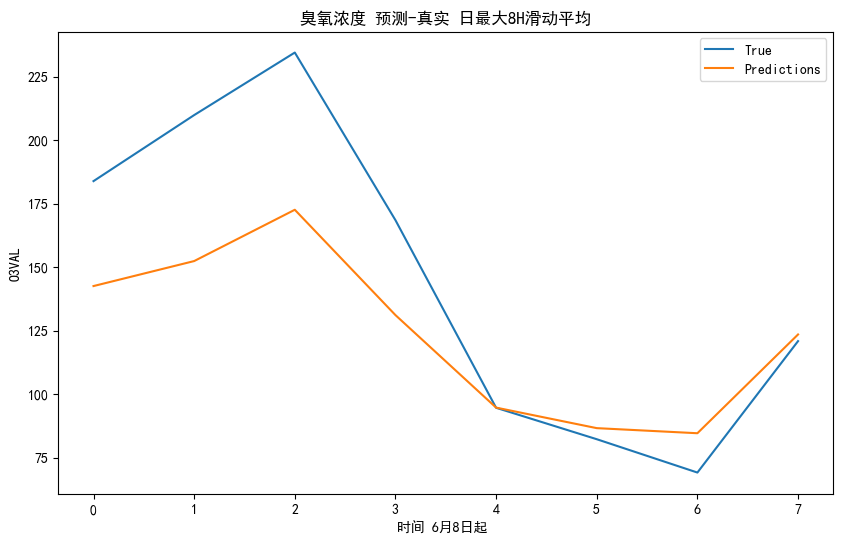

rmse: 36.23819622350295
r2 score: 0.612267679829692
rmse: 50.05502246072169
r2 score: -13.825474991380784
rmse: 54.29240873286363
r2 score: -5.8991028456363095
rmse: 50.59672288997032
r2 score: -3.0356866490817858
rmse: 45.255095847507896
r2 score: 0.09251339965465566
rmse: 41.350404463907964
r2 score: 0.459135820778957


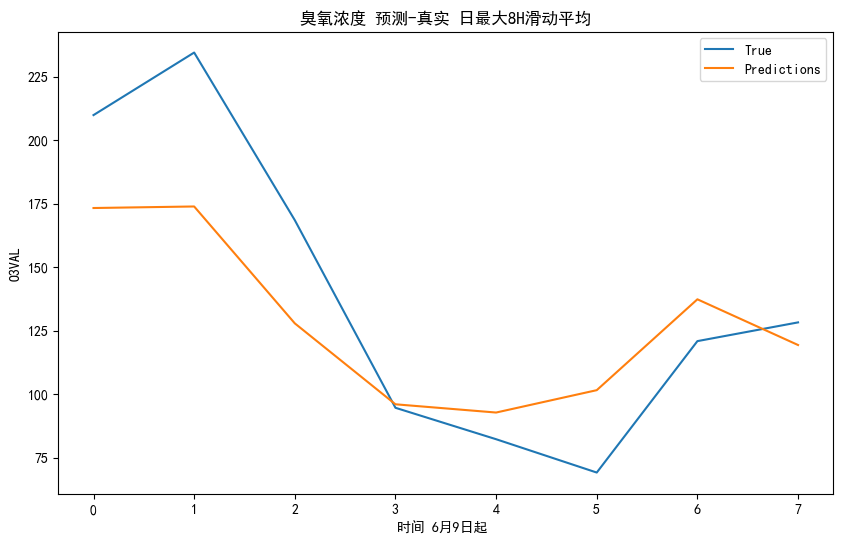

rmse: 31.97293783842531
r2 score: 0.6796407862070037
rmse: 50.06104498665557
r2 score: -15.531312469785977
rmse: 47.12769081423563
r2 score: -1.9949551756362824
rmse: 40.81957381383654
r2 score: 0.4072883026611197
rmse: 36.811128717283516
r2 score: 0.6319365444383824
rmse: 36.11938753920835
r2 score: 0.6866787089623934


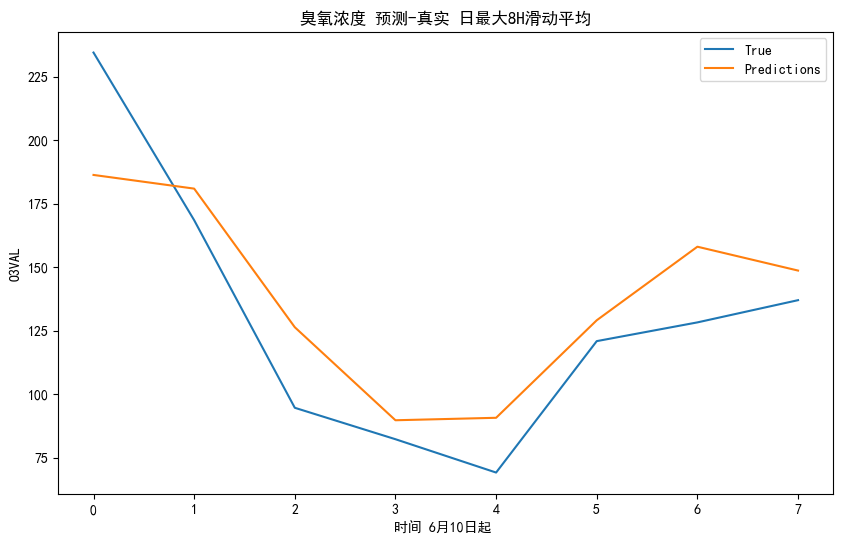

rmse: 25.236190186617048
r2 score: 0.7423172803507514
rmse: 35.189860508233885
r2 score: -0.13712238988885095
rmse: 34.072752390607334
r2 score: 0.6443466826053552
rmse: 29.743124248123195
r2 score: 0.7646838317031239
rmse: 28.29681406260551
r2 score: 0.7961483434787145
rmse: 26.04814682345113
r2 score: 0.793410296387741


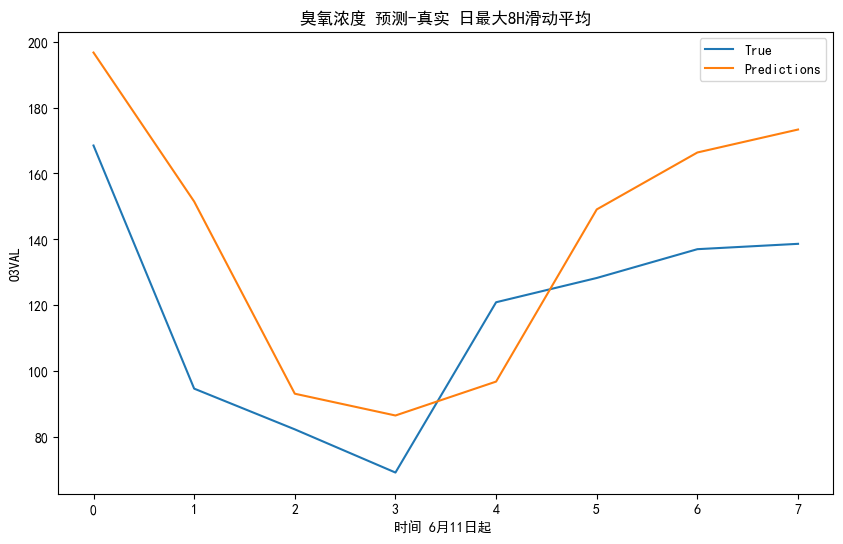

rmse: 30.687482292695027
r2 score: 0.016525922150416927
rmse: 44.89361316649416
r2 score: -0.4771823969942868
rmse: 37.18516866322988
r2 score: 0.04636788309206419
rmse: 33.34947363381335
r2 score: 0.25066198129545203
rmse: 31.717568387051234
r2 score: 0.18541597409109445
rmse: 30.17709566389188
r2 score: 0.16563281206900338


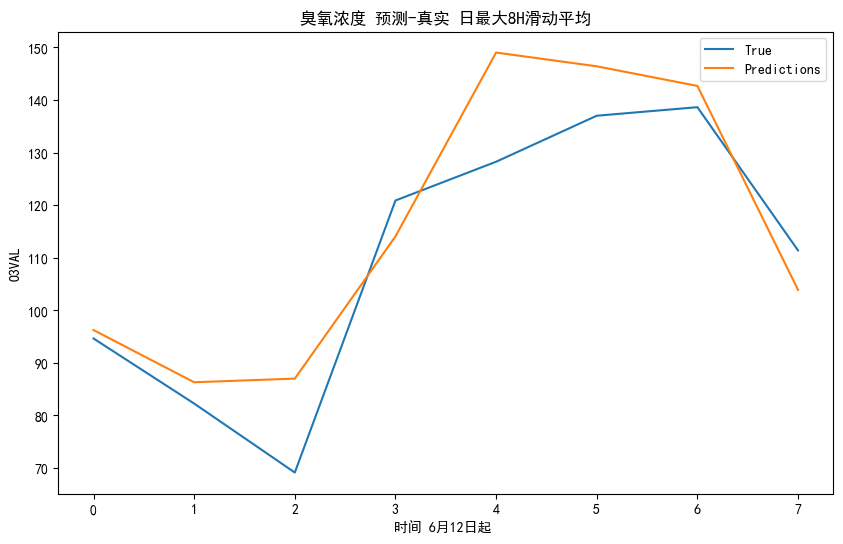

rmse: 11.052014558584279
r2 score: 0.7911241702129994
rmse: 3.0828880101425646
r2 score: 0.7517523914224385
rmse: 10.617722895279075
r2 score: -0.039940404551706665
rmse: 9.808805958531039
r2 score: 0.7361629201618429
rmse: 12.77604151930138
r2 score: 0.6769432752962463
rmse: 12.278162479207444
r2 score: 0.7573742215800682


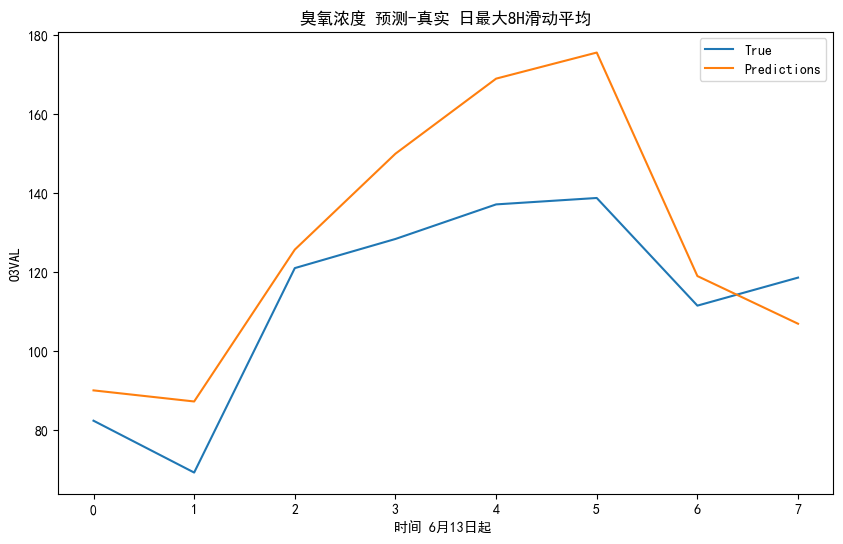

rmse: 20.70986842760547
r2 score: 0.22544075330720525
rmse: 13.829813871221807
r2 score: -3.441135640674432
rmse: 11.610833351835867
r2 score: 0.7205799316036445
rmse: 14.751221736617294
r2 score: 0.6521336696950695
rmse: 19.409898810453264
r2 score: 0.47527296592768276
rmse: 23.23366293585681
r2 score: 0.2634379822716797


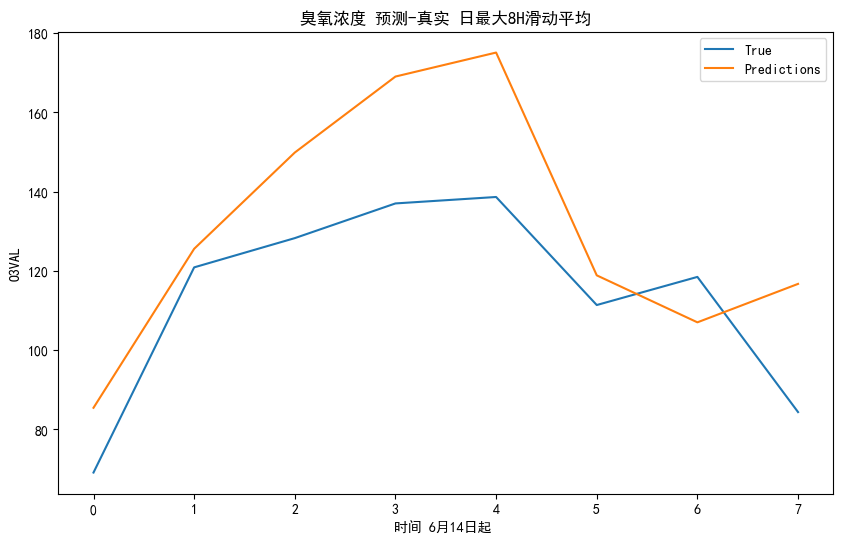

rmse: 23.28766297492725
r2 score: -0.008471248479426707
rmse: 12.016561759880096
r2 score: 0.7843250386740226
rmse: 15.861434682662589
r2 score: 0.6364504712151696
rmse: 21.087865080522757
r2 score: 0.3631141895310812
rmse: 24.923219504280823
r2 score: 0.05467902083056453
rmse: 22.95607291758741
r2 score: 0.050801879165157215


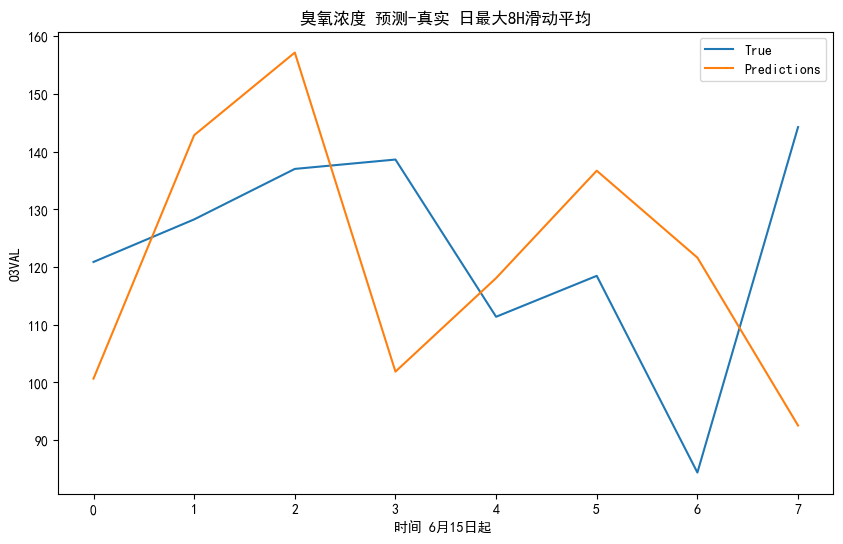

rmse: 29.19605018861141
r2 score: -1.6521053525268359
rmse: 17.63275993673907
r2 score: -21.86528040350119
rmse: 18.516140365485395
r2 score: -6.892260152017825
rmse: 24.391869926481544
r2 score: -10.661481474516581
rmse: 22.021748674375118
r2 score: -3.6800961644193855
rmse: 21.43486818324187
r2 score: -3.7366387577484916


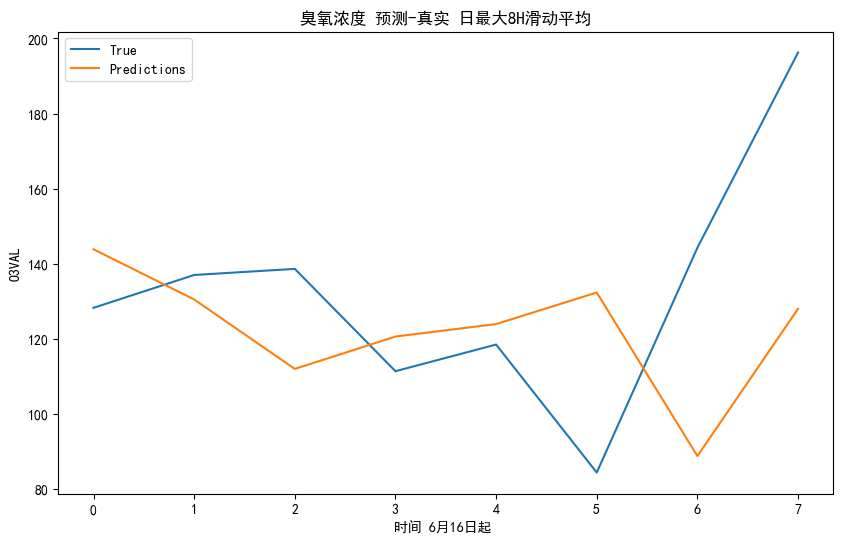

rmse: 37.32901109259867
r2 score: -0.5403967586523277
rmse: 11.956877311813507
r2 score: -6.4692918883140225
rmse: 18.222390781899943
r2 score: -14.99464650155249
rmse: 16.44181789503045
r2 score: -1.3120082910999877
rmse: 14.907131132362924
r2 score: -1.0081646477918174
rmse: 23.841257873635293
r2 score: -0.664256491214392


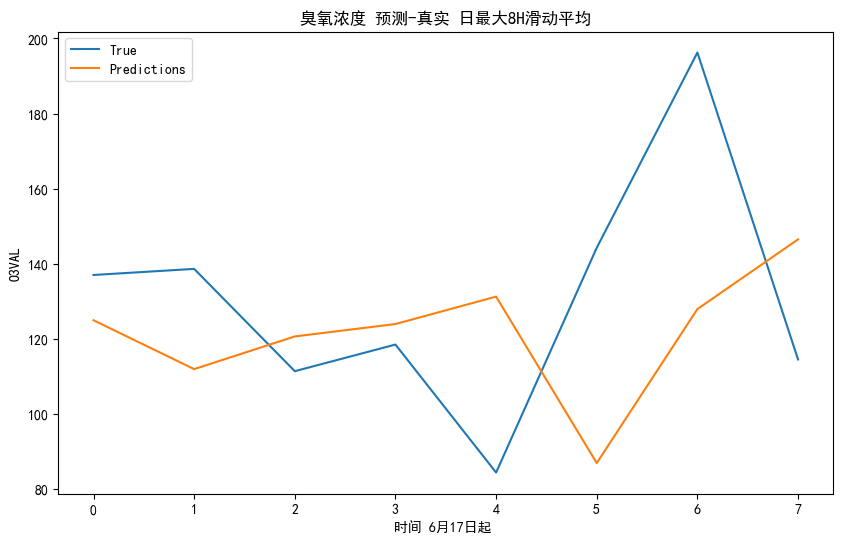

rmse: 38.971812214909015
r2 score: -0.6169653093889085
rmse: 20.713734628995997
r2 score: -648.9352271230756
rmse: 17.73673981680885
r2 score: -1.019716857861336
rmse: 15.601850098638256
r2 score: -0.7688259859032576
rmse: 25.178888083315403
r2 score: -0.61634933212665
rmse: 32.80932517470522
r2 score: -1.5460839491443132


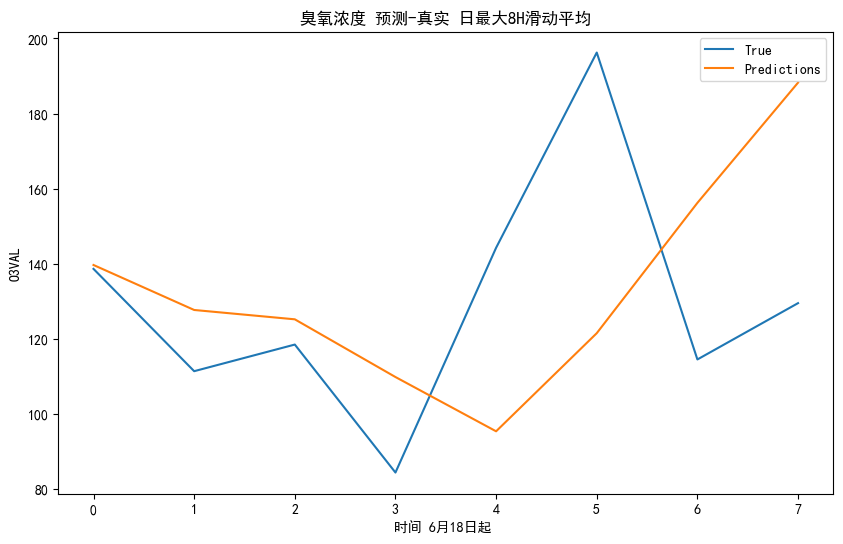

rmse: 42.023576262135464
r2 score: -0.8918771966260912
rmse: 11.55314275812932
r2 score: 0.2810027029928608
rmse: 10.200400885507738
r2 score: 0.2190908575822086
rmse: 15.488744025534698
r2 score: 0.36382653705812273
rmse: 25.882954543314273
r2 score: -0.4696933532367258
rmse: 38.5948469035914
r2 score: -0.24158798120972236


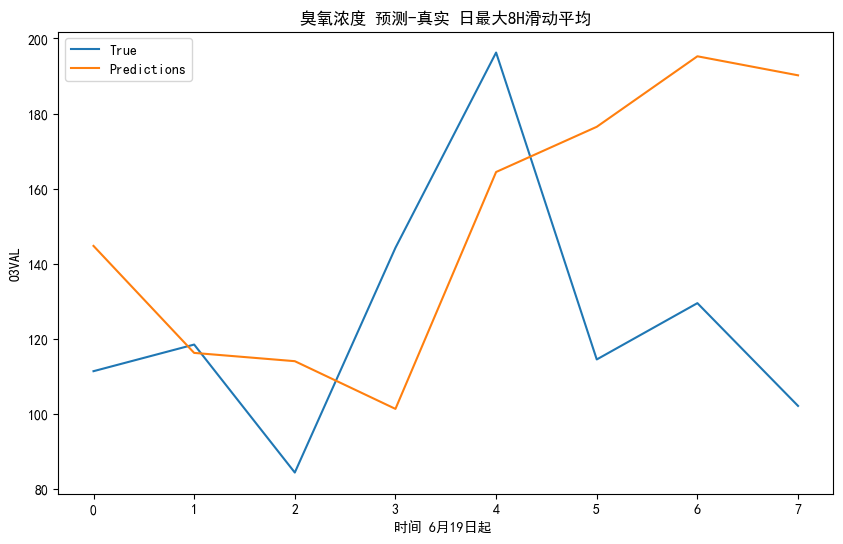

rmse: 50.95537249944518
r2 score: -1.6031237084218066
rmse: 23.649693618656798
r2 score: -43.45895712740306
rmse: 25.811113552982594
r2 score: -2.0879675359321785
rmse: 30.986106793493242
r2 score: -1.1124704022422724
rmse: 31.154147364015497
r2 score: 0.32119355298386487
rmse: 38.0644050958669
r2 score: -0.17884461082914216


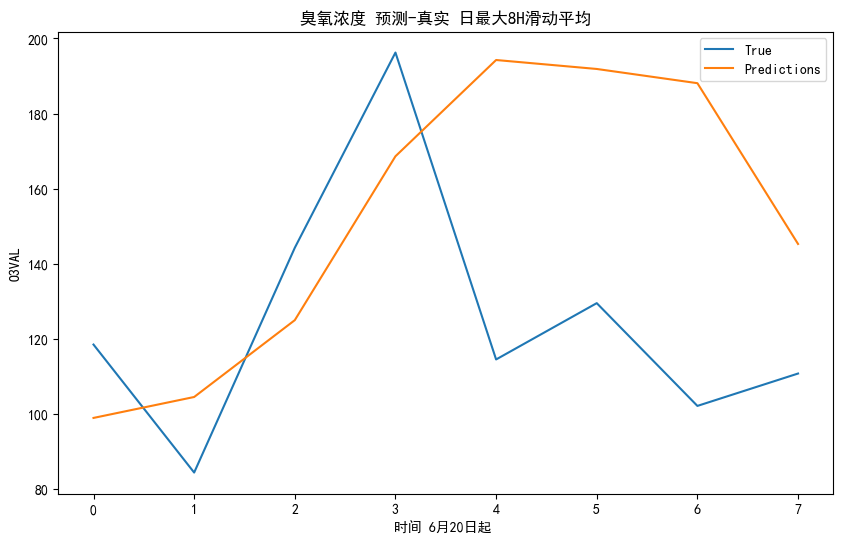

rmse: 50.936404917063996
r2 score: -1.5954922792466557
rmse: 19.837731558739883
r2 score: -0.354236344655231
rmse: 19.65364857004217
r2 score: 0.357659515909841
rmse: 21.921082352293034
r2 score: 0.7118454940211949
rmse: 40.70441318072994
r2 score: -0.17762936052871536
rmse: 45.04632485880833
r2 score: -0.7298381911904623


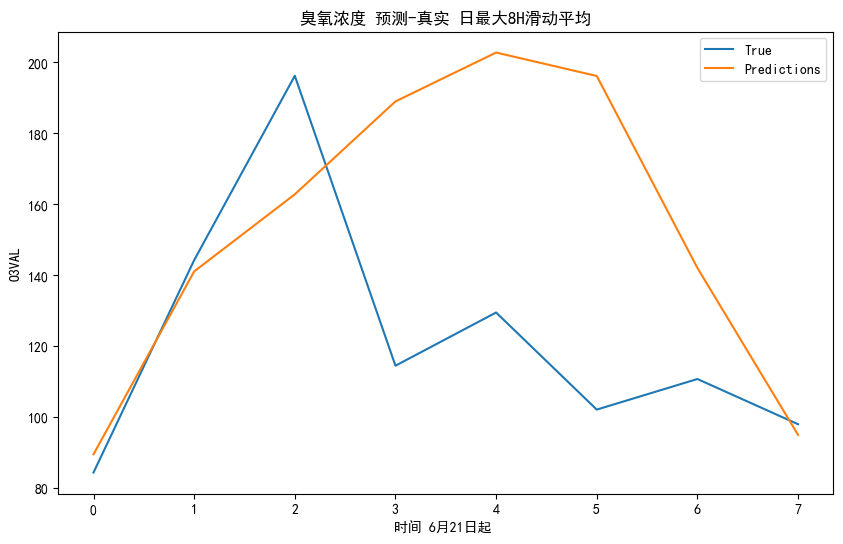

rmse: 52.34339772957673
r2 score: -1.5392066814109224
rmse: 4.276700513106099
r2 score: 0.979592649860429
rmse: 19.612716947741735
r2 score: 0.8159041615711156
rmse: 40.948802632698374
r2 score: 0.016561208031942276
rmse: 49.1526315932286
r2 score: -0.7652906468749356
rmse: 59.05986682525398
r2 score: -1.7258405175975038


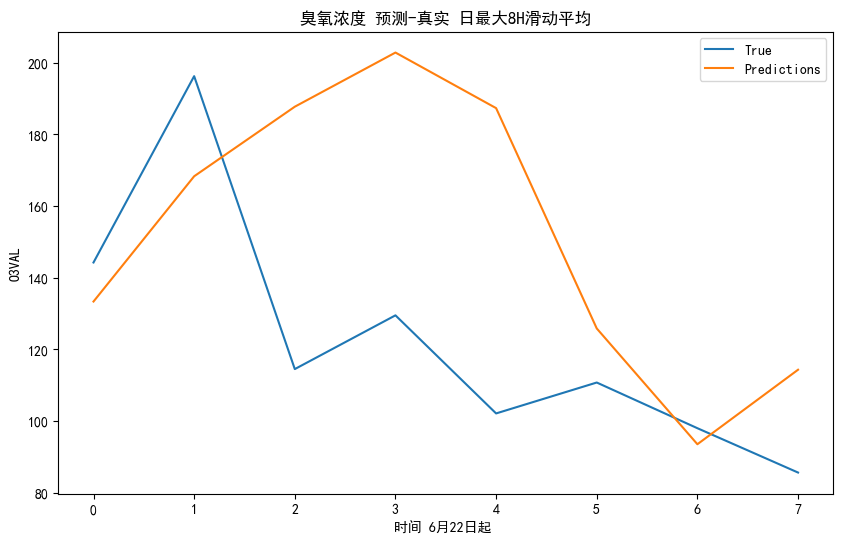

rmse: 49.963957867370674
r2 score: -1.3390331485919278
rmse: 21.20573132949102
r2 score: 0.33478840056426484
rmse: 45.68566303922024
r2 score: -0.8286983721477852
rmse: 53.945158108523245
r2 score: -2.0692494410874662
rmse: 61.4818646801661
r2 score: -2.5384414412523535
rmse: 56.46200821126065
r2 score: -2.2256511691771785


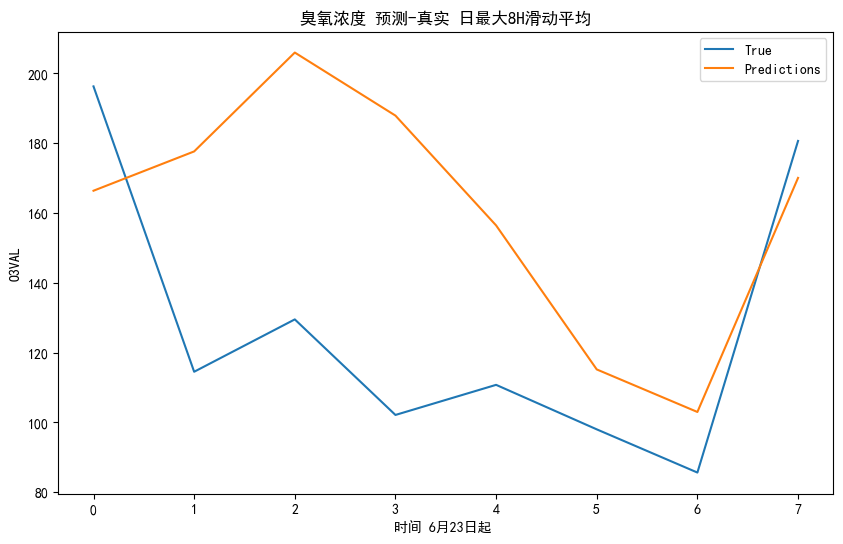

rmse: 51.0750517225344
r2 score: -0.8518895780772433
rmse: 49.38304102610546
r2 score: -0.4596210889759087
rmse: 59.78051317936805
r2 score: -1.8303809571239262
rmse: 67.22181004132487
r2 score: -2.422392828569456
rmse: 63.5001445549437
r2 score: -2.4910280908617652
rmse: 58.3895691671394
r2 score: -2.070474181824586


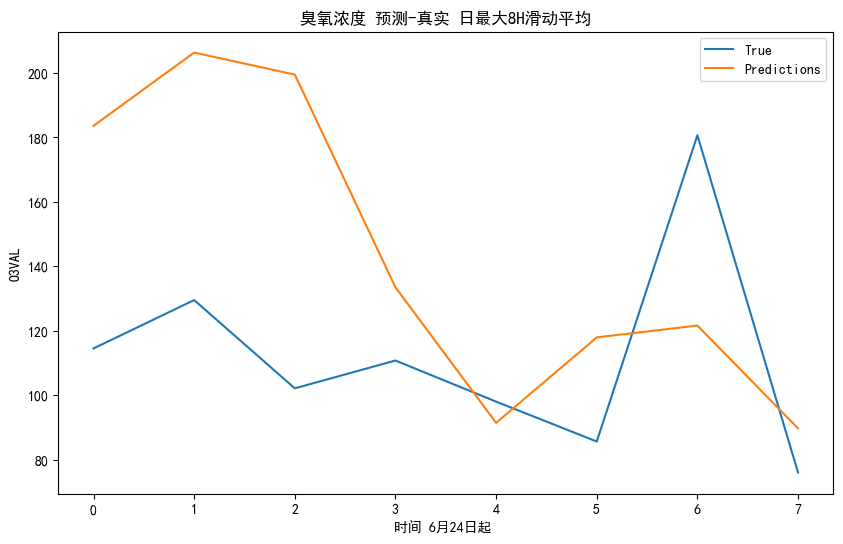

rmse: 56.3588399594952
r2 score: -2.4768722038435413
rmse: 73.02166687888852
r2 score: -93.79402371149094
rmse: 81.92794660554414
r2 score: -52.57695932153368
rmse: 71.85451795062814
r2 score: -51.69963489842959
rmse: 64.33601931864295
r2 score: -33.359551585678815
rmse: 60.19223627816461
r2 score: -18.105111619234517


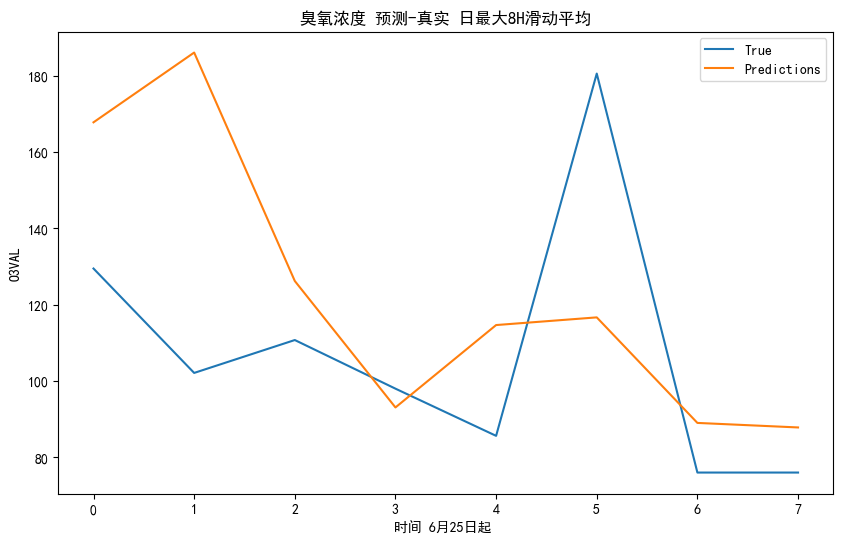

rmse: 41.8828936519955
r2 score: -0.6659347083061167
rmse: 65.3020625068107
r2 score: -21.761743877665467
rmse: 54.0629173822221
r2 score: -21.38084928166143
rmse: 46.884602730335835
r2 score: -13.984269343676687
rmse: 43.901540192870954
r2 score: -8.042042334729103
rmse: 47.826301224617154
r2 score: -1.363562541304324


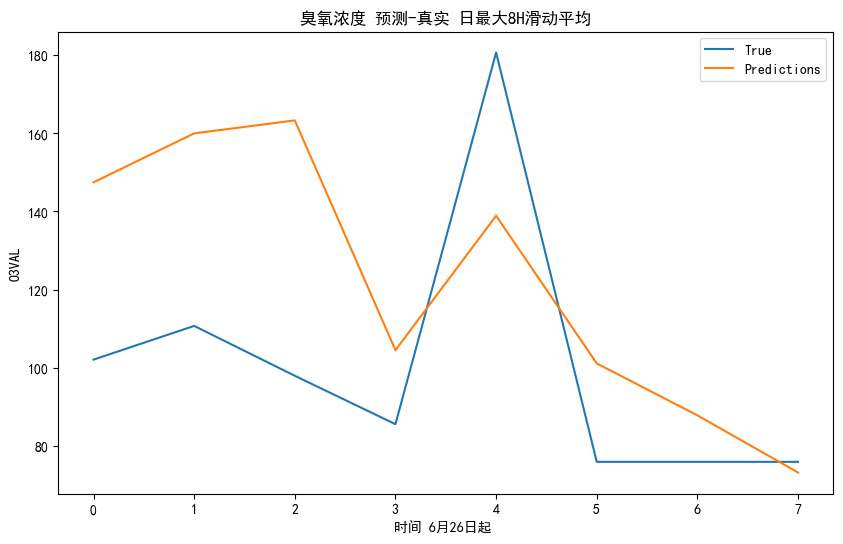

rmse: 38.10835845667698
r2 score: -0.3579022809383008
rmse: 47.310420511088694
r2 score: -119.35257877916963
rmse: 53.96838280243815
r2 score: -102.21457691465785
rmse: 47.685169485280774
r2 score: -26.759279901908812
rmse: 46.553981866112466
r2 score: -0.9208455508188413
rmse: 43.72108346754762
r2 score: -0.6534009410140078


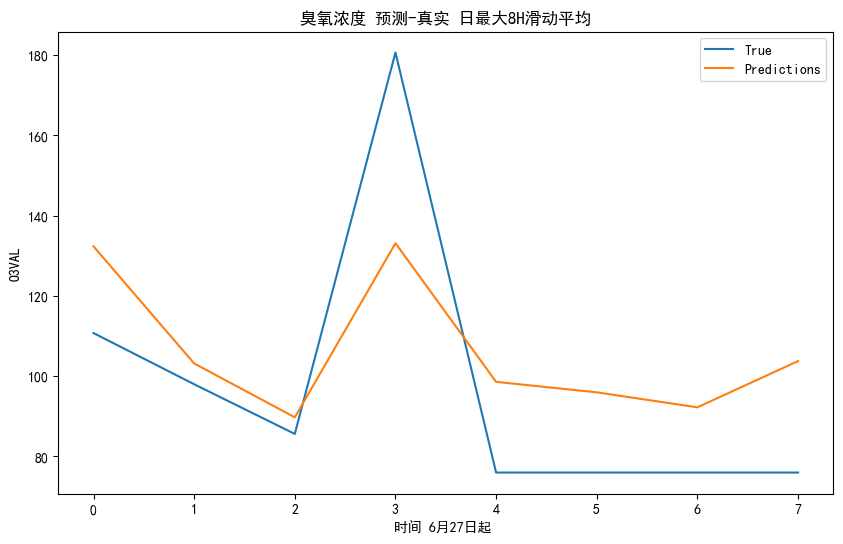

rmse: 24.26752094524207
r2 score: 0.4808752349434182
rmse: 15.701819047469021
r2 score: -5.066518942547289
rmse: 13.040090018257478
r2 score: -0.616099294890486
rmse: 26.298180311689052
r2 score: 0.48963068055887815
rmse: 25.600543369474426
r2 score: 0.5238663722107291
rmse: 24.752965090958245
r2 score: 0.5321099885354957


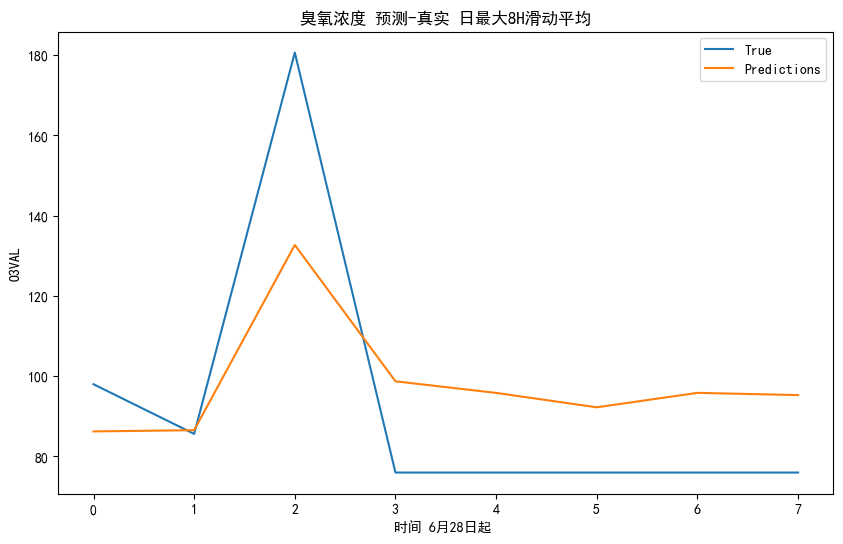

rmse: 23.390581731893178
r2 score: 0.5243745327270731
rmse: 8.335780488434326
r2 score: -0.8149393435311474
rmse: 28.49619343104132
r2 score: 0.5433750021241663
rmse: 27.16932442687445
r2 score: 0.5709558187393643
rmse: 25.870187646992008
r2 score: 0.5715442612343107
rmse: 24.53051665677283
r2 score: 0.5716611032195706


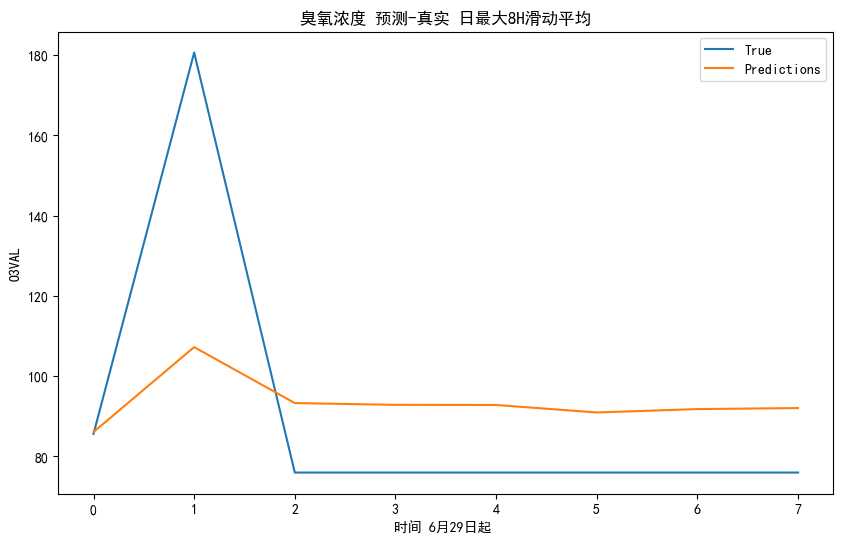

rmse: 29.545718645153986
r2 score: 0.2576485445507847
rmse: 51.88611099593608
r2 score: -0.19320488167649819
rmse: 43.527826565393376
r2 score: 0.15011868965451858
rmse: 38.62765415035813
r2 score: 0.23243794264455864
rmse: 35.359926915247826
r2 score: 0.25826868091261634
rmse: 32.85231137867239
r2 score: 0.2694047546913514


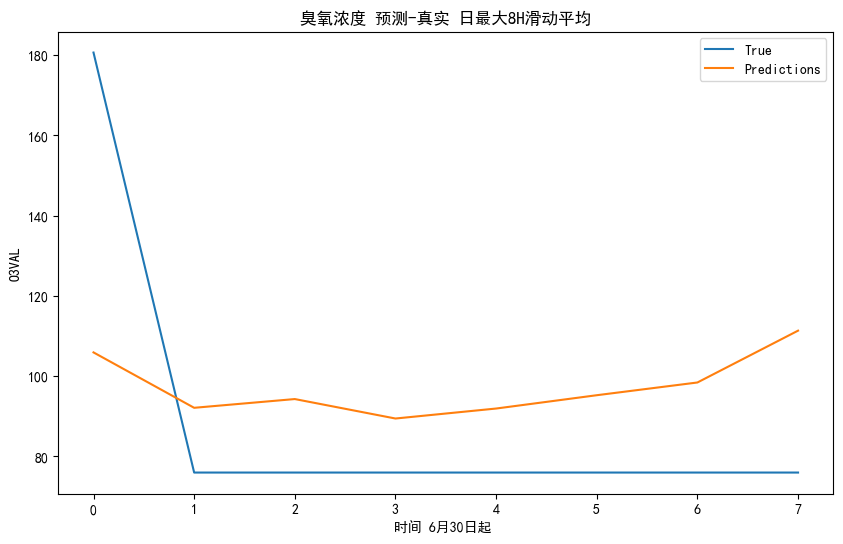

rmse: 33.04166389914605
r2 score: 0.08812604733620755
rmse: 54.03501265559691
r2 score: -0.06693893639137993
rmse: 45.36789438249153
r2 score: 0.15386663965739134
rmse: 39.861899221665894
r2 score: 0.22581676999332156
rmse: 36.359835814927344
r2 score: 0.245163482547202
rmse: 34.110747091759194
r2 score: 0.23467831812942452


In [42]:
# 创建滑动窗口计算平均值的函数
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data

# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8
for i in range(len(df_list)):
    y_test_sw_avg_8 = sliding_window_average(y_list[i].values, window_size)
    y_pred_sw_avg_8 = sliding_window_average(y_pred_list[i], window_size)
    y_test_sw_max_8 = max_values(y_test_sw_avg_8, 16)
    y_pred_sw_max_8 = max_values(y_pred_sw_avg_8, 16)   
    plt.figure(figsize=(10, 6))
    # 绘制每8小时为单位的滑动平均图像
    plt.title("臭氧浓度 预测-真实 日最大8H滑动平均")
    plt.plot(y_test_sw_max_8, label='True')
    plt.plot(y_pred_sw_max_8, label='Predictions')
    if 9+i <= 31:
        plt.xlabel('时间 5月'+str(9+i)+'日起 ')
    else:
        plt.xlabel('时间 6月'+str(9+i-31)+'日起 ')
    plt.ylabel('O3VAL')
    plt.legend()

    # for i in range(0, 32, 2):
    #     plt.text(i, y_test_sw_max_8[i], f'{y_test_sw_max_8[i]:.2f}', color='blue', fontsize=8, ha='right')
    #     plt.text(i, y_pred_sw_max_8[i], f'{y_pred_sw_max_8[i]:.2f}', color='orange', fontsize=8, ha='left')
    plt.show()

    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8, y_pred_sw_max_8)))
    print("r2 score:", r2_score(y_test_sw_max_8, y_pred_sw_max_8))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:2], y_pred_sw_max_8[:2])))
    print("r2 score:", r2_score(y_test_sw_max_8[:2], y_pred_sw_max_8[:2]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:3], y_pred_sw_max_8[:3])))
    print("r2 score:", r2_score(y_test_sw_max_8[:3], y_pred_sw_max_8[:3]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:4], y_pred_sw_max_8[:4])))
    print("r2 score:", r2_score(y_test_sw_max_8[:4], y_pred_sw_max_8[:4]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:5], y_pred_sw_max_8[:5])))
    print("r2 score:", r2_score(y_test_sw_max_8[:5], y_pred_sw_max_8[:5]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:6], y_pred_sw_max_8[:6])))
    print("r2 score:", r2_score(y_test_sw_max_8[:6], y_pred_sw_max_8[:6]))

# print("\ny_pred_sw_max_8   y_test_sw_max_8 ")
# for i in range(0,15):
#     print(y_pred_sw_max_8[i] , y_test_sw_max_8[i])